<a href="https://colab.research.google.com/github/Coulbe/algorithmic-trading-python/blob/master/Algorithmic_Trading.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Getting started with Algorithmic Trading using Python

**Import libraries**

In [1]:
import fix_yahoo_finance as yf # fetches stock prices
yf.pdr_override()
import numpy as np # Linear algebra
import pylab
import math
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from sklearn.svm import SVC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, datasets
from keras.layers import Dense
from keras.models import Sequential
import tensorflow as tf
tf.random.set_seed(100)
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.tsa.stattools as ts
from statsmodels.tsa.arima_model import ARIMA
from pandas.api.types import CategoricalDtype
from plotnine import *
from plotnine.data import mpg
from plotnine import options as op
from plotnine import watermark as wm
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from PIL import Image
import missingno as msno
import warnings
%matplotlib inline
#import pycountry_convert as pc
import warnings
import networkx as nx
warnings.filterwarnings('ignore')
import collections
import numpy as np
import pandas as pd
import warnings


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


**Generating random financial dataset**

In [2]:
# Imports
import numpy as np
import pandas as pd

r = 0.05  # constant short rate
sigma = 0.5  # volatility factor


def generate_sample_data(rows, cols, freq='1min'):
    '''
    Function to generate sample financial data.
    Parameters
    ==========
    rows: int
        number of rows to generate
    cols: int
        number of columns to generate
    freq: str
        frequency string for DatetimeIndex
    Returns
    =======
    df: DataFrame
        DataFrame object with the sample data
    '''
    rows = int(rows)
    cols = int(cols)

    # generate a DatetimeIndex object given the frequency
    index = pd.date_range('2021-1-1', periods=rows, freq=freq)

    # determine time delta in year fractions
    dt = (index[1] - index[0]) / pd.Timedelta(value='365D')

    # generate column names
    columns = ['No%d' % i for i in range(cols)]

    # generate sample paths for geometric Brownian motion
    raw = np.exp(np.cumsum((r - 0.5 * sigma ** 2) * dt +
                 sigma * np.sqrt(dt) *
                 np.random.standard_normal((rows, cols)), axis=0))
    
    # normalize the data to start at 100
    raw = raw / raw[0] * 100
    
    # generate the DataFrame object
    df = pd.DataFrame(raw, index=index, columns=columns)
    return df


In [3]:
#  Test generate_sample_data function
if __name__ == '__main__':
    rows = 200  # number of rows
    columns = 7  # number of columns
    freq = 'D'  # daily frequency
    print(generate_sample_data(rows, columns, freq))

                   No0         No1  ...         No5         No6
2021-01-01  100.000000  100.000000  ...  100.000000  100.000000
2021-01-02   98.452489  100.270692  ...   99.293053   98.001629
2021-01-03   99.157126  102.853932  ...  100.102059   99.426072
2021-01-04   96.757318   99.695816  ...   99.491471  102.403054
2021-01-05   99.570144   97.256263  ...   96.804430  100.549389
...                ...         ...  ...         ...         ...
2021-07-15   94.946046  106.155733  ...   91.836015  107.514357
2021-07-16   96.414179  106.794408  ...   90.632701  108.450425
2021-07-17   97.007599  103.226508  ...   91.367409  105.593219
2021-07-18  100.497525  100.790017  ...   93.055694  105.277639
2021-07-19  101.817480  100.558425  ...   90.811484  106.486761

[200 rows x 7 columns]


**Using Basic Python Operations and Data Types**

In [4]:
a = 3

In [5]:
type(a)

int

In [6]:
a.bit_length()

2

In [7]:
b = 5.

In [8]:
c = 10 ** 100

In [9]:
c.bit_length()

333

In [10]:
3 / 5.

0.6

In [11]:
a * b

15.0

In [12]:
a - b

-2.0

In [13]:
b + a

8.0

In [14]:
# a power b
a ** b

243.0

In [15]:
import math

In [16]:
math.log(a)

1.0986122886681098

In [17]:
math.exp(a)

20.085536923187668

In [18]:
math.sin(b)

-0.9589242746631385

**Working with strings**

In [19]:
s = 'Demystifying Algorithmic Trading with Python.'

In [20]:
type(s)

str

In [21]:
s.lower()

'demystifying algorithmic trading with python.'

In [22]:
s.upper()

'DEMYSTIFYING ALGORITHMIC TRADING WITH PYTHON.'

In [23]:
s[25:]

'Trading with Python.'

In [24]:
st = s[0:13] + s[-8:-1]

In [25]:
print(st)

Demystifying  Python


In [26]:
repl = 'My name is %s, I am %d years old and %4.2f m tall.'

In [27]:
print(repl % ('Youssouf Coulibaly', 44, 1.77))

My name is Youssouf Coulibaly, I am 44 years old and 1.77 m tall.


In [28]:

print(repl % ('Youssouf Coulibaly', 44, 1.77))

My name is Youssouf Coulibaly, I am 44 years old and 1.77 m tall.


In [29]:
repl = 'My name is {:s}, I am {:d} years old and {:4.2f} m tall.' # <3>

In [30]:
print(repl.format('Youssouf Coulibaly', 44, 1.77))

My name is Youssouf Coulibaly, I am 44 years old and 1.77 m tall.


In [31]:
name, age, height = 'Youssouf Coulibaly', 44, 1.77 # <5>

In [32]:
print(f'My name is {name:s}, I am {age:d} years old and {height:4.2f}m tall.')

My name is Youssouf Coulibaly, I am 44 years old and 1.77m tall.


**Working with data types and structures**

In [33]:
t1 = (a, b, st)

In [34]:
t1

(3, 5.0, 'Demystifying  Python')

In [35]:
type(t1)

tuple

In [36]:

t2 = st, b, a

In [37]:
t2

('Demystifying  Python', 5.0, 3)

In [38]:
type(t2)

tuple

In [39]:
t = (t1, t2)

In [40]:
t

((3, 5.0, 'Demystifying  Python'), ('Demystifying  Python', 5.0, 3))

In [41]:
t[0][2]

'Demystifying  Python'

In [42]:

l = [a, b, st]

In [43]:
l

[3, 5.0, 'Demystifying  Python']

In [44]:
type(l)

list

In [45]:
l.append(s.split()[3])

In [46]:
l

[3, 5.0, 'Demystifying  Python', 'with']

In [47]:
l = list(('Z', 'Q', 'D', 'J', 'E', 'H', '5.', 'a'))

In [48]:
l

['Z', 'Q', 'D', 'J', 'E', 'H', '5.', 'a']

In [49]:
l.sort()

In [50]:
l

['5.', 'D', 'E', 'H', 'J', 'Q', 'Z', 'a']

In [51]:
d = {'int_obj': a, 'float_obj': b, 'string_obj': st}

In [52]:
type(d)

dict

In [53]:
d

{'float_obj': 5.0, 'int_obj': 3, 'string_obj': 'Demystifying  Python'}

In [54]:
d['float_obj']

5.0

In [55]:
d['int_obj_long'] = 10 ** 20

In [56]:
d

{'float_obj': 5.0,
 'int_obj': 3,
 'int_obj_long': 100000000000000000000,
 'string_obj': 'Demystifying  Python'}

In [57]:
d.keys()

dict_keys(['int_obj', 'float_obj', 'string_obj', 'int_obj_long'])

In [58]:
d.values()

dict_values([3, 5.0, 'Demystifying  Python', 100000000000000000000])

**Control Structures**

In [59]:
range(5)

range(0, 5)

In [60]:
range(3, 15, 2)

range(3, 15, 2)

In [61]:
for i in range(5):
    print(i ** 2, end=' ')

0 1 4 9 16 

In [62]:
for i in range(3, 15, 2):
    print(i, end=' ')

3 5 7 9 11 13 

In [63]:
alist = ['a', 'b', 'c', 'd', 'e']

In [64]:
for _ in alist:
    print(_)

a
b
c
d
e


In [65]:
s = 'Algorithmic trading with Python'

In [66]:

for c in s:
    print(c + '|', end='')

A|l|g|o|r|i|t|h|m|i|c| |t|r|a|d|i|n|g| |w|i|t|h| |P|y|t|h|o|n|

In [67]:
s ='Demystifying Algorithmic trading with Python'

result = s.startswith('trading')
# returns False
print(result)

result = s.startswith('Demystifying')
# returns True
print(result)

result = s.endswith('Python')
# returns True
print(result)

False
True
True


**Working with while loop**

In [68]:
i = 0

In [69]:
while i < 5:
    print(i ** 0.5, end=' ')
    i += 1

0.0 1.0 1.4142135623730951 1.7320508075688772 2.0 

In [70]:
# The break Statement
# Exit the loop when i is 3:
i = 1
while i < 6:
  print(i)
  if i == 3:
    break
  i += 1

1
2
3


In [71]:
# The continue Statement
i = 0
while i < 6:
  i += 1
  if i == 3:
    continue
  print(i)

1
2
4
5
6


In [72]:
# 
i = 1
while i < 6:
  print(i)
  i += 1
else:
  print("i is no longer less than 6")

1
2
3
4
5
i is no longer less than 6


**Python Conditions: If and else statements**

In [73]:
# If statement
a = 33
b = 200
if b > a:
  print("b is greater than a") 

b is greater than a


In [74]:
# Elif
a = 33
b = 33
if b > a:
  print("b is greater than a")
elif a == b:
  print("a and b are equal")

a and b are equal


In [75]:
# Else
a = 200
b = 33
if b > a:
  print("b is greater than a")
elif a == b:
  print("a and b are equal")
else:
  print("a is greater than b")

a is greater than b


In [76]:
# Nested If
x = 41

if x > 10:
  print("Above ten,")
  if x > 20:
    print("and also above 20!")
  else:
    print("but not above 20.")

Above ten,
and also above 20!


**Parse JSON - Convert from JSON to Python**

In [77]:
# Convert from JSON to Python
import json

# JSON
x =  '{ "name":"John", "age":30, "city":"New York"}'

# parse x:
y = json.loads(x)

# the result is a Python dictionary:
print(y["age"])

30


**Convert from Python to JSON**

In [78]:
# Convert from Python to JSON
import json

# a Python object (dict):
x = {
  "name": "John",
  "age": 30,
  "city": "New York"
}

# convert into JSON:
y = json.dumps(x)

# the result is a JSON string:
print(y)

{"name": "John", "age": 30, "city": "New York"}


**Convert Python objects into JSON strings, and print the values**

In [79]:
# Convert Python objects into JSON strings, and print the values
import json
print(json.dumps({"name": "John", "age": 30}))
print(json.dumps(["apple", "bananas"]))
print(json.dumps(("apple", "bananas")))
print(json.dumps("hello"))
print(json.dumps(42))
print(json.dumps(31.76))
print(json.dumps(True))
print(json.dumps(False))
print(json.dumps(None))

{"name": "John", "age": 30}
["apple", "bananas"]
["apple", "bananas"]
"hello"
42
31.76
true
false
null


**Working with Python Idioms**

In [80]:
lc = [i ** 2 for i in range(10)]

In [81]:
lc

[0, 1, 4, 9, 16, 25, 36, 49, 64, 81]

In [82]:
type(lc)

list

In [83]:
f = lambda x: math.cos(x)

In [84]:
f(5)

0.28366218546322625

In [85]:
list(map(lambda x: math.cos(x), range(10)))

[1.0,
 0.5403023058681398,
 -0.4161468365471424,
 -0.9899924966004454,
 -0.6536436208636119,
 0.28366218546322625,
 0.960170286650366,
 0.7539022543433046,
 -0.14550003380861354,
 -0.9111302618846769]

In [86]:
def f(x):
    return math.exp(x)

In [87]:
f(5)

148.4131591025766

In [88]:
def f(*args):
    for arg in args:
        print(arg)
    return None

In [89]:
f(l)

['5.', 'D', 'E', 'H', 'J', 'Q', 'Z', 'a']


In [90]:
import random

In [91]:
a = random.randint(0, 1000)

In [92]:
print(f'Random number is {a}')

Random number is 249


In [93]:
def number_decide(number):
    if a < 10:
        return "Number is single digit."
    elif 10 <= a < 100:
        return "Number is double digit."
    else:
        return "Number is triple digit."

In [94]:
number_decide(a)

'Number is triple digit.'

**Working with NumPy Regular ndarray Objects**

In [95]:
import numpy as np

In [96]:

a = np.array(range(24))

In [97]:
a

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [98]:
b = a.reshape((4, 6))

In [99]:
b

array([[ 0,  1,  2,  3,  4,  5],
       [ 6,  7,  8,  9, 10, 11],
       [12, 13, 14, 15, 16, 17],
       [18, 19, 20, 21, 22, 23]])

In [100]:
c = a.reshape((2, 3, 4))

In [101]:
c

array([[[ 0,  1,  2,  3],
        [ 4,  5,  6,  7],
        [ 8,  9, 10, 11]],

       [[12, 13, 14, 15],
        [16, 17, 18, 19],
        [20, 21, 22, 23]]])

In [102]:
b = np.array(b, dtype=np.float)

In [103]:
b

array([[ 0.,  1.,  2.,  3.,  4.,  5.],
       [ 6.,  7.,  8.,  9., 10., 11.],
       [12., 13., 14., 15., 16., 17.],
       [18., 19., 20., 21., 22., 23.]])

**Applying Math Operations with Vectors**

In [104]:
2 * b

array([[ 0.,  2.,  4.,  6.,  8., 10.],
       [12., 14., 16., 18., 20., 22.],
       [24., 26., 28., 30., 32., 34.],
       [36., 38., 40., 42., 44., 46.]])

In [105]:
b ** 2

array([[  0.,   1.,   4.,   9.,  16.,  25.],
       [ 36.,  49.,  64.,  81., 100., 121.],
       [144., 169., 196., 225., 256., 289.],
       [324., 361., 400., 441., 484., 529.]])

In [106]:
f = lambda x: x ** 2 - 2 * x + 0.5

In [107]:
f(a)

array([  0.5,  -0.5,   0.5,   3.5,   8.5,  15.5,  24.5,  35.5,  48.5,
        63.5,  80.5,  99.5, 120.5, 143.5, 168.5, 195.5, 224.5, 255.5,
       288.5, 323.5, 360.5, 399.5, 440.5, 483.5])

In [108]:
a[2:6]

array([2, 3, 4, 5])

In [109]:
b[2, 4]

16.0

In [110]:
b[1:3, 2:4]

array([[ 8.,  9.],
       [14., 15.]])

**Working with Boolean Operations**

In [111]:
b > 10

array([[False, False, False, False, False, False],
       [False, False, False, False, False,  True],
       [ True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True]])

In [112]:
b[b > 10]

array([11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23.])

**Working with NumPy Methods/Functions**

In [113]:
a.sum()

276

In [114]:
b.mean()

11.5

In [115]:
b.mean(axis=0)

array([ 9., 10., 11., 12., 13., 14.])

In [116]:
b.mean(axis=1)

array([ 2.5,  8.5, 14.5, 20.5])

In [117]:
c.std()

6.922186552431729

In [118]:
np.sum(a)

276

In [119]:
np.mean(b, axis=0)

array([ 9., 10., 11., 12., 13., 14.])

In [120]:
np.sin(b).round(2)

array([[ 0.  ,  0.84,  0.91,  0.14, -0.76, -0.96],
       [-0.28,  0.66,  0.99,  0.41, -0.54, -1.  ],
       [-0.54,  0.42,  0.99,  0.65, -0.29, -0.96],
       [-0.75,  0.15,  0.91,  0.84, -0.01, -0.85]])

In [121]:
np.sin(4.5)

-0.977530117665097

In [122]:
%time l = [np.sin(x) for x in range(1000000)]

CPU times: user 1.32 s, sys: 44.9 ms, total: 1.36 s
Wall time: 1.43 s


In [123]:
%time l = [math.sin(x) for x in range(1000000)]

CPU times: user 284 ms, sys: 34.6 ms, total: 319 ms
Wall time: 333 ms


In [124]:
%time a = np.sin(np.arange(1000000))

CPU times: user 24.3 ms, sys: 2.75 ms, total: 27 ms
Wall time: 28.2 ms


**Dataset bytesize**

In [125]:
import sys

In [126]:
sys.getsizeof(a)

8000096

In [127]:
a.nbytes

8000000

**Creating and working with ndarray**

In [128]:

ai = np.arange(10)

In [129]:
ai

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [130]:

ai.dtype

dtype('int64')

In [131]:
af = np.arange(0.5, 9.5, 0.5)

In [132]:
af

array([0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. , 5.5, 6. , 6.5,
       7. , 7.5, 8. , 8.5, 9. ])

In [133]:
af.dtype

dtype('float64')

In [134]:
np.linspace(0, 10, 12)

array([ 0.        ,  0.90909091,  1.81818182,  2.72727273,  3.63636364,
        4.54545455,  5.45454545,  6.36363636,  7.27272727,  8.18181818,
        9.09090909, 10.        ])

**Creating and working with Random Numbers**

In [135]:
np.random.standard_normal(10)

array([ 0.11715801,  1.25017531, -0.53820451, -0.28724957,  1.11570963,
        0.26171354,  0.46741209,  1.26412558, -0.37813468, -0.49174576])

In [136]:
np.random.poisson(0.5, 10)

array([1, 0, 0, 0, 0, 2, 1, 1, 0, 1])

In [137]:
np.random.seed(1000)

In [138]:
data = np.random.standard_normal((5, 100))

In [139]:
data[:, :3]

array([[-0.8044583 ,  0.32093155, -0.02548288],
       [-0.39031935, -0.58069634,  1.94898697],
       [-1.11573322, -1.34477121,  0.75334374],
       [ 0.42400699, -1.56680276,  0.76499895],
       [-1.74866738, -0.06913021,  1.52621653]])

In [140]:
data.mean()

-0.02714981205311327

In [141]:
data.std()

1.0016799134894265

In [142]:
data = data - data.mean()

In [143]:
data.mean()

3.552713678800501e-18

In [144]:
data = data / data.std()

In [145]:
data.std()

1.0

**Creating and storing dictionnary as dataframe and CSV file**

In [146]:
# Creating and storing dictionnary as a dataframe 
import pandas as pd
data = {'Product': ['Desktop Computer','Tablet','Printer','Laptop'],
        'Price': [850,200,150,1300]
        }
df = pd.DataFrame(data, columns= ['Product', 'Price'])
df.to_csv (r'data\export_dataframe.csv', index = False, header=True)
print (df)

            Product  Price
0  Desktop Computer    850
1            Tablet    200
2           Printer    150
3            Laptop   1300


**Python Pickle Module for saving Objects by serialization**

If you have a large dataset, for example, and you're loading that massive data set into memory every time you run the program, it may make a lot of sense to just pickle it, and then load that instead, because it will be far faster, again by 50 - 100x, sometimes far more depending on the size.
https://pythonprogramming.net/python-pickle-module-save-objects-serialization/

In [147]:
# imports pickle
import pickle

example_dict = {1:"6",2:"2",3:"f"}

# opens the file
pickle_out = open("dict.pickle","wb")
pickle.dump(example_dict, pickle_out)
pickle_out.close()

In [148]:
# Opens the pickle file using pickle.load() to load it to a var.
pickle_in = open("dict.pickle","rb")
example_dict = pickle.load(pickle_in)

In [149]:
print(example_dict)
print(example_dict[3])

{1: '6', 2: '2', 3: 'f'}
f


**Working with matplotlib**

In [150]:
import matplotlib.pyplot as plt

In [151]:
plt.style.use('seaborn')

In [152]:
import matplotlib as mpl

In [153]:
mpl.rcParams['font.family'] = 'serif'
%matplotlib inline

In [154]:
data = np.random.standard_normal((5, 100))

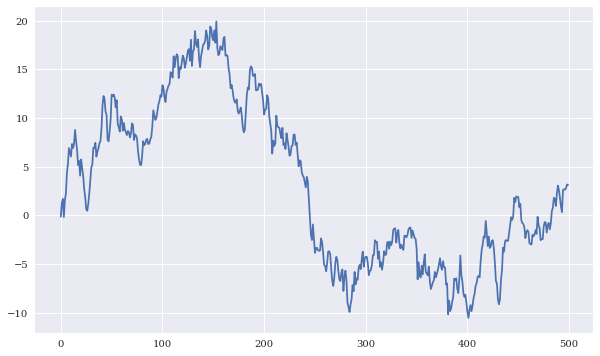

In [155]:
plt.figure(figsize=(10, 6))
plt.plot(data.cumsum())
# plt.savefig('../../images/chA/plot_01.png');

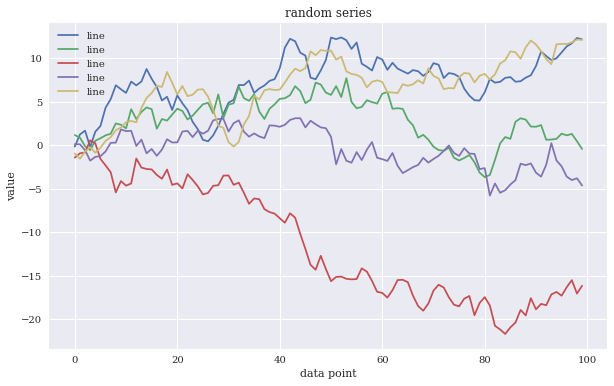

In [156]:

plt.figure(figsize=(10, 6));
plt.plot(data.T.cumsum(axis=0), label='line')
plt.legend(loc=0);
plt.xlabel('data point')
plt.ylabel('value');
plt.title('random series');
# plt.savefig('../../images/chA/plot_02.png');

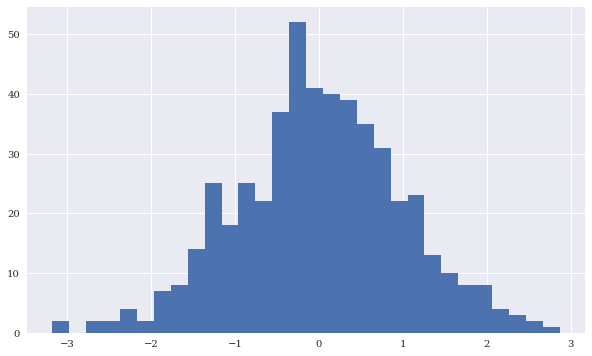

In [157]:
plt.figure(figsize=(10, 6))
plt.hist(data.flatten(), bins=30);
# plt.savefig('../../images/chA/plot_03.png');

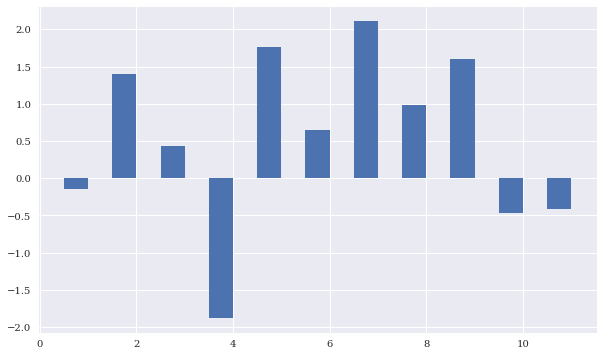

In [158]:
plt.figure(figsize=(10, 6))
plt.bar(np.arange(1, 12) - 0.25,
        data[0, :11], width=0.5);
# plt.savefig('../../images/chA/plot_04.png');

In [159]:
x = np.arange(len(data.cumsum()))

In [160]:
y = 0.2 * data.cumsum() ** 2 # <2>

In [161]:
rg1 = np.polyfit(x, y, 1)

In [162]:
rg3 = np.polyfit(x, y, 3)

In [163]:
rg9 = np.polyfit(x, y, 9)

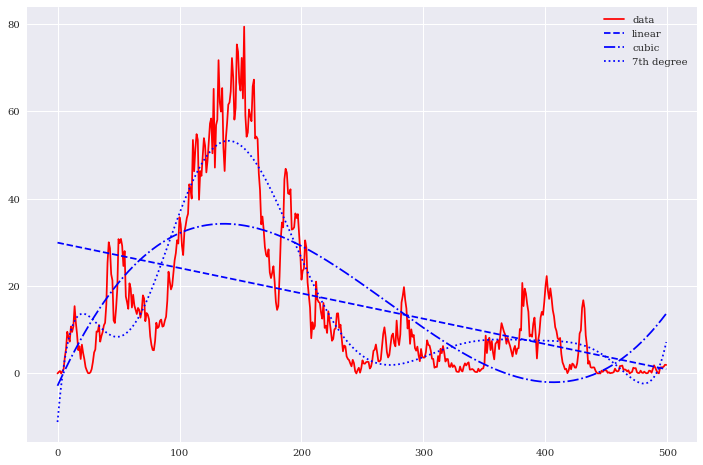

In [164]:
plt.figure(figsize=(12, 8))
plt.plot(x, y, 'r', label='data')
plt.plot(x, np.polyval(rg1, x), 'b--', label='linear')
plt.plot(x, np.polyval(rg3, x), 'b-.', label='cubic')
plt.plot(x, np.polyval(rg9, x), 'b:', label='7th degree')
plt.legend(loc=0);
# plt.savefig('../../images/chA/plot_05.png');

**Working with Pandas DataFrame**

In [165]:
import pandas as pd

In [166]:
np.random.seed(1000)

In [167]:
raw = np.random.standard_normal((10, 3)).cumsum(axis=0)

In [168]:
index = pd.date_range('2022-1-1', periods=len(raw), freq='M')

In [169]:
columns = ['no1', 'no2', 'no3']

In [170]:
df = pd.DataFrame(raw, index=index, columns=columns)

In [171]:
df

,no1,no2,no3
2022-01-31,-0.804458,0.320932,-0.025483
2022-02-28,-0.160134,0.020135,0.363992
2022-03-31,-0.267572,-0.459848,0.959027
2022-04-30,-0.732239,0.207433,0.152912
2022-05-31,-1.928309,-0.198527,-0.029466
2022-06-30,-1.825116,-0.336949,0.676227
2022-07-31,-0.553321,-1.323696,0.341391
2022-08-31,-0.652803,-0.916504,1.260779
2022-09-30,-0.340685,0.616657,0.710605
2022-10-31,-0.723832,-0.206284,2.310688


In [172]:
df.head()

,no1,no2,no3
2022-01-31,-0.804458,0.320932,-0.025483
2022-02-28,-0.160134,0.020135,0.363992
2022-03-31,-0.267572,-0.459848,0.959027
2022-04-30,-0.732239,0.207433,0.152912
2022-05-31,-1.928309,-0.198527,-0.029466


In [173]:
df.tail()

,no1,no2,no3
2022-06-30,-1.825116,-0.336949,0.676227
2022-07-31,-0.553321,-1.323696,0.341391
2022-08-31,-0.652803,-0.916504,1.260779
2022-09-30,-0.340685,0.616657,0.710605
2022-10-31,-0.723832,-0.206284,2.310688


In [174]:
df.index

DatetimeIndex(['2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30',
               '2022-05-31', '2022-06-30', '2022-07-31', '2022-08-31',
               '2022-09-30', '2022-10-31'],
              dtype='datetime64[ns]', freq='M')

In [175]:
df.columns

Index(['no1', 'no2', 'no3'], dtype='object')

In [176]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10 entries, 2022-01-31 to 2022-10-31
Freq: M
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   no1     10 non-null     float64
 1   no2     10 non-null     float64
 2   no3     10 non-null     float64
dtypes: float64(3)
memory usage: 320.0 bytes


In [177]:
df.describe()

,no1,no2,no3
count,10.000000,10.000000,10.000000
mean,-0.798847,-0.227665,0.672067
std,0.607430,0.578071,0.712430
min,-1.928309,-1.323696,-0.029466
25%,-0.786404,-0.429123,0.200031
50%,-0.688317,-0.202406,0.520109
75%,-0.393844,0.160609,0.896922
max,-0.160134,0.616657,2.310688


**Working with Pandas Numerical Operations**

In [178]:
print(df * 2)

                 no1       no2       no3
2022-01-31 -1.608917  0.641863 -0.050966
2022-02-28 -0.320269  0.040270  0.727983
2022-03-31 -0.535144 -0.919696  1.918054
2022-04-30 -1.464479  0.414866  0.305823
2022-05-31 -3.856618 -0.397054 -0.058932
2022-06-30 -3.650232 -0.673898  1.352453
2022-07-31 -1.106642 -2.647393  0.682782
2022-08-31 -1.305605 -1.833009  2.521557
2022-09-30 -0.681369  1.233314  1.421210
2022-10-31 -1.447664 -0.412568  4.621376


In [179]:
df.std()

no1    0.607430
no2    0.578071
no3    0.712430
dtype: float64

In [180]:
df.mean()

no1   -0.798847
no2   -0.227665
no3    0.672067
dtype: float64

In [181]:
df.mean(axis=1)

2022-01-31   -0.169670
2022-02-28    0.074664
2022-03-31    0.077202
2022-04-30   -0.123965
2022-05-31   -0.718767
2022-06-30   -0.495280
2022-07-31   -0.511875
2022-08-31   -0.102843
2022-09-30    0.328859
2022-10-31    0.460191
Freq: M, dtype: float64

In [182]:
np.mean(df)

no1   -0.798847
no2   -0.227665
no3    0.672067
dtype: float64

**Data Selection**

In [183]:
df['no2']

2022-01-31    0.320932
2022-02-28    0.020135
2022-03-31   -0.459848
2022-04-30    0.207433
2022-05-31   -0.198527
2022-06-30   -0.336949
2022-07-31   -1.323696
2022-08-31   -0.916504
2022-09-30    0.616657
2022-10-31   -0.206284
Freq: M, Name: no2, dtype: float64

In [184]:
df.iloc[0]

no1   -0.804458
no2    0.320932
no3   -0.025483
Name: 2022-01-31 00:00:00, dtype: float64

In [185]:
df.iloc[2:4]

,no1,no2,no3
2022-03-31,-0.267572,-0.459848,0.959027
2022-04-30,-0.732239,0.207433,0.152912


In [186]:
df.iloc[2:4, 1]

2022-03-31   -0.459848
2022-04-30    0.207433
Freq: M, Name: no2, dtype: float64

In [187]:
df.no3.iloc[3:7]

2022-04-30    0.152912
2022-05-31   -0.029466
2022-06-30    0.676227
2022-07-31    0.341391
Freq: M, Name: no3, dtype: float64

In [188]:
df.loc['2022-3-31']

no1   -0.267572
no2   -0.459848
no3    0.959027
Name: 2022-03-31 00:00:00, dtype: float64

In [189]:
df.loc['2022-5-31', 'no3']

-0.02946577492329111

In [190]:
df['no1'] + 3 * df['no3']

2022-01-31   -0.880907
2022-02-28    0.931841
2022-03-31    2.609510
2022-04-30   -0.273505
2022-05-31   -2.016706
2022-06-30    0.203564
2022-07-31    0.470852
2022-08-31    3.129533
2022-09-30    1.791130
2022-10-31    6.208233
Freq: M, dtype: float64

**Working with Boolean Operations with Pandas**

In [191]:
df['no3'] > 0.5

2022-01-31    False
2022-02-28    False
2022-03-31     True
2022-04-30    False
2022-05-31    False
2022-06-30     True
2022-07-31    False
2022-08-31     True
2022-09-30     True
2022-10-31     True
Freq: M, Name: no3, dtype: bool

In [192]:
df[df['no3'] > 0.5]

,no1,no2,no3
2022-03-31,-0.267572,-0.459848,0.959027
2022-06-30,-1.825116,-0.336949,0.676227
2022-08-31,-0.652803,-0.916504,1.260779
2022-09-30,-0.340685,0.616657,0.710605
2022-10-31,-0.723832,-0.206284,2.310688


In [193]:
df[(df.no3 > 0.5) & (df.no2 > -0.25)]

,no1,no2,no3
2022-09-30,-0.340685,0.616657,0.710605
2022-10-31,-0.723832,-0.206284,2.310688


In [194]:
df[df.index > '2022-5-15']

,no1,no2,no3
2022-05-31,-1.928309,-0.198527,-0.029466
2022-06-30,-1.825116,-0.336949,0.676227
2022-07-31,-0.553321,-1.323696,0.341391
2022-08-31,-0.652803,-0.916504,1.260779
2022-09-30,-0.340685,0.616657,0.710605
2022-10-31,-0.723832,-0.206284,2.310688


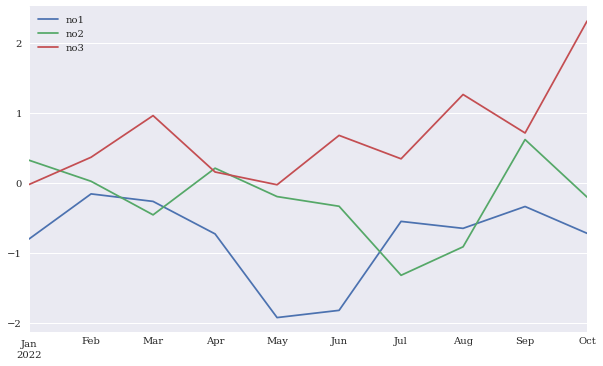

In [195]:
df.plot(figsize=(10, 6))
# plt.savefig('../../images/chA/plot_06.png');

In [196]:
index = ['2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30',
         '2022-05-31', '2022-06-30', '2022-07-31', '2022-08-31',
         '2022-09-30', '2022-10-31']

In [197]:
pd.DatetimeIndex(df.index)

DatetimeIndex(['2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30',
               '2022-05-31', '2022-06-30', '2022-07-31', '2022-08-31',
               '2022-09-30', '2022-10-31'],
              dtype='datetime64[ns]', freq='M')

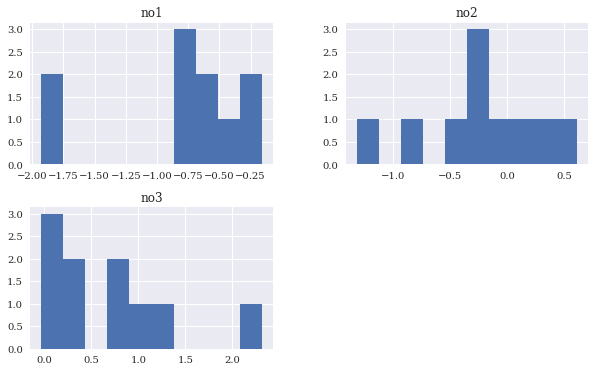

In [198]:
df.hist(figsize=(10, 6));
# plt.savefig('../../images/chA/plot_07.png');

**Basic Input-Output Operations**

In [199]:
df.to_csv('data.csv')

In [200]:
with open('data.csv') as f:
    for line in f.readlines():
        print(line, end='')

,no1,no2,no3
2022-01-31,-0.8044583035248052,0.3209315470898572,-0.025482880472072204
2022-02-28,-0.16013447509799061,0.020134874302836725,0.363991673815235
2022-03-31,-0.26757177678888727,-0.4598482010579319,0.9590271758917923
2022-04-30,-0.7322393029842283,0.2074331059300848,0.15291156544935125
2022-05-31,-1.9283091368170622,-0.19852705542997268,-0.02946577492329111
2022-06-30,-1.8251162427820806,-0.33694904401573555,0.6762266000356951
2022-07-31,-0.5533209663746153,-1.3236963728130973,0.34139114682415433
2022-08-31,-0.6528026643843922,-0.9165042724715742,1.2607786860286034
2022-09-30,-0.34068465431802875,0.6166567928863607,0.7106048210003031
2022-10-31,-0.7238320652023266,-0.20628417055270565,2.310688189060956


In [201]:
from_csv = pd.read_csv('data.csv',
                      index_col=0,
                      parse_dates=True)

In [202]:
from_csv.head() #  <6>

,no1,no2,no3
2022-01-31,-0.804458,0.320932,-0.025483
2022-02-28,-0.160134,0.020135,0.363992
2022-03-31,-0.267572,-0.459848,0.959027
2022-04-30,-0.732239,0.207433,0.152912
2022-05-31,-1.928309,-0.198527,-0.029466


In [203]:
h5 = pd.HDFStore('data.h5', 'w')

In [204]:
h5['df'] = df

In [205]:
h5

<class 'pandas.io.pytables.HDFStore'>
File path: data.h5

In [206]:
from_h5 = h5['df']

In [207]:
h5.close()

In [208]:
from_h5.tail()

,no1,no2,no3
2022-06-30,-1.825116,-0.336949,0.676227
2022-07-31,-0.553321,-1.323696,0.341391
2022-08-31,-0.652803,-0.916504,1.260779
2022-09-30,-0.340685,0.616657,0.710605
2022-10-31,-0.723832,-0.206284,2.310688


In [209]:
!rm data.csv data.h5 # <7>

#Working with Time Series Data


**Reading Financial Data From Different Sources**

In [210]:
# Retrieves end-of-day (EOD) data and stores it in a DataFrame object. 
# Reading from a CSV File with pandas
import pandas as pd 

fn = pd.read_csv('http://hilpisch.com/pyalgo_eikon_eod_data.csv',
 index_col=0, parse_dates=True).dropna()

In [211]:
#exporting data to csv file
fn.to_csv('data.csv')

In [212]:
with open('/content/data.csv', 'r') as f: # Opens the file on disk (adjust path and filename if necessary).
 for _ in range(5): #Sets up a for loop with five iterations.
   print(f.readline(), end='')  #Prints the first five lines in the opened CSV file.

Date,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
2010-01-04,30.57282657,30.95,20.88,133.9,173.08,113.33,1132.99,20.04,1.4411,1120.0,47.71,109.8
2010-01-05,30.625683660000004,30.96,20.87,134.69,176.14,113.63,1136.52,19.35,1.4368,1118.65,48.17,109.7
2010-01-06,30.138541290000006,30.77,20.8,132.25,174.26,113.71,1137.14,19.16,1.4412,1138.5,49.34,111.51
2010-01-07,30.082827060000003,30.451999999999998,20.6,130.0,177.67,114.19,1141.69,19.06,1.4318,1131.9,49.1,110.82


**Reading from a CSV File with Python**

Working with such a nested list object—for the calculation of the average closing price, for exammple—is possible in principle but not really efficient or intuitive.

In [213]:
import csv #Imports the csv module.
csv_reader = csv.reader(open('/content/data.csv', 'r')) # Instantiates a csv.reader iterator object.

In [214]:
# A list comprehension adding every single line from the CSV file as a list
# object to the resulting list object.
data = list(csv_reader)  

In [215]:
#Prints out the first five elements of the list object.
data[:1]

[['Date',
  'AAPL.O',
  'MSFT.O',
  'INTC.O',
  'AMZN.O',
  'GS.N',
  'SPY',
  '.SPX',
  '.VIX',
  'EUR=',
  'XAU=',
  'GDX',
  'GLD']]

In [216]:
#Here, the csv.DictReader iterator object is instantiated, which reads every data
# row into a dict object, given the information in the header row.
csv_reader = csv.DictReader(open('/content/data.csv', 'r'))

In [217]:
data = list(csv_reader)


In [218]:
data[:3]


[OrderedDict([('Date', '2010-01-04'),
              ('AAPL.O', '30.57282657'),
              ('MSFT.O', '30.95'),
              ('INTC.O', '20.88'),
              ('AMZN.O', '133.9'),
              ('GS.N', '173.08'),
              ('SPY', '113.33'),
              ('.SPX', '1132.99'),
              ('.VIX', '20.04'),
              ('EUR=', '1.4411'),
              ('XAU=', '1120.0'),
              ('GDX', '47.71'),
              ('GLD', '109.8')]),
 OrderedDict([('Date', '2010-01-05'),
              ('AAPL.O', '30.625683660000004'),
              ('MSFT.O', '30.96'),
              ('INTC.O', '20.87'),
              ('AMZN.O', '134.69'),
              ('GS.N', '176.14'),
              ('SPY', '113.63'),
              ('.SPX', '1136.52'),
              ('.VIX', '19.35'),
              ('EUR=', '1.4368'),
              ('XAU=', '1118.65'),
              ('GDX', '48.17'),
              ('GLD', '109.7')]),
 OrderedDict([('Date', '2010-01-06'),
              ('AAPL.O', '30.138541290000006'),

In [219]:
# Dictionary makes aggregations somewhat easier to accom‐plish. 
# However, it is not a convenient way of calculating the mean of
#the Apple stock price when inspecting this code:
sum([float(l['AAPL.O']) for l in data]) / len(data) 

110.3452801584703

**Reading from a CSV File with pandas**

In [220]:
#The pandas package is imported.
import pandas as pd 

In [221]:
#This imports the data from the CSV file, indicating that the first column shall be
# treated as the index column and letting the entries in that column be interpreted
# as date-time information
data = pd.read_csv('/content/data.csv', index_col=0,
 parse_dates=True)

In [222]:
#This method call prints out meta information 
# regarding the resulting DataFrameobject.
data.info() 

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2010-01-04 to 2019-12-31
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL.O  2516 non-null   float64
 1   MSFT.O  2516 non-null   float64
 2   INTC.O  2516 non-null   float64
 3   AMZN.O  2516 non-null   float64
 4   GS.N    2516 non-null   float64
 5   SPY     2516 non-null   float64
 6   .SPX    2516 non-null   float64
 7   .VIX    2516 non-null   float64
 8   EUR=    2516 non-null   float64
 9   XAU=    2516 non-null   float64
 10  GDX     2516 non-null   float64
 11  GLD     2516 non-null   float64
dtypes: float64(12)
memory usage: 255.5 KB


In [223]:
# The data.tail() method prints out by default the five most recent data rows.
data.tail()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2019-12-24,284.27,157.38,59.41,1789.21,229.91,321.23,3223.38,12.67,1.1087,1498.8100,28.66,141.27
2019-12-26,289.91,158.67,59.82,1868.77,231.21,322.94,3239.91,12.65,1.1096,1511.2979,29.08,142.38
2019-12-27,289.80,158.96,60.08,1869.80,230.66,322.86,3240.02,13.43,1.1175,1510.4167,28.87,142.33
2019-12-30,291.52,157.59,59.62,1846.89,229.80,321.08,3221.29,14.82,1.1197,1515.1230,29.49,142.63
2019-12-31,293.65,157.70,59.85,1847.84,229.93,321.86,3230.78,13.78,1.1210,1517.0100,29.28,142.90


In [224]:
#Calculating the mean of the Apple stock closing values now is only a single method: .mean(()
data['AAPL.O'].mean()

110.3452801584703

**Exporting to CSV, Excel and JSON**


In [225]:
# Exports the data to a JSON file on disk.
data.to_json('data.json')

In [226]:
# Exports the data to an Excel spreadsheet file on disk.
data.to_excel('data.xls')

In [227]:
ls -n 

total 1296
-rw-r--r-- 1 0 0 242767 Jun 30 18:53  data.csv
-rw-r--r-- 1 0 0     70 Jun 30 18:53 'data\export_dataframe.csv'
-rw-r--r-- 1 0 0 693372 Jun 30 18:53  data.json
-rw-r--r-- 1 0 0 372736 Jun 30 18:53  data.xls
-rw-r--r-- 1 0 0     38 Jun 30 18:53  dict.pickle
drwxr-xr-x 1 0 0   4096 Jun 15 13:37  sample_data/


**Reading from Excel and JSON**

In [228]:
# This reads the data from the Excel spreadsheet file to a new DataFrame object.
data_copy_1 = pd.read_excel('data.xls',
 index_col=0)

In [229]:
#The first five rows of the first in-memory copy of the data are printed
data_copy_1.head()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2010-01-04,30.572827,30.950,20.88,133.90,173.08,113.33,1132.99,20.04,1.4411,1120.00,47.71,109.80
2010-01-05,30.625684,30.960,20.87,134.69,176.14,113.63,1136.52,19.35,1.4368,1118.65,48.17,109.70
2010-01-06,30.138541,30.770,20.80,132.25,174.26,113.71,1137.14,19.16,1.4412,1138.50,49.34,111.51
2010-01-07,30.082827,30.452,20.60,130.00,177.67,114.19,1141.69,19.06,1.4318,1131.90,49.10,110.82
2010-01-08,30.282827,30.660,20.83,133.52,174.31,114.57,1144.98,18.13,1.4412,1136.10,49.84,111.37


In [230]:
#This reads the data from the JSON file to yet another DataFrame object
data_copy_2 = pd.read_json('data.json')

In [231]:
#This then prints the first five rows of the second in-memory copy of the data
data_copy_2.head()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
2010-01-04,30.572827,30.950,20.88,133.90,173.08,113.33,1132.99,20.04,1.4411,1120.00,47.71,109.80
2010-01-05,30.625684,30.960,20.87,134.69,176.14,113.63,1136.52,19.35,1.4368,1118.65,48.17,109.70
2010-01-06,30.138541,30.770,20.80,132.25,174.26,113.71,1137.14,19.16,1.4412,1138.50,49.34,111.51
2010-01-07,30.082827,30.452,20.60,130.00,177.67,114.19,1141.69,19.06,1.4318,1131.90,49.10,110.82
2010-01-08,30.282827,30.660,20.83,133.52,174.31,114.57,1144.98,18.13,1.4412,1136.10,49.84,111.37


#Retrieving and Storing historical financial datasets

**Working with structured data**

In [232]:
# Fetches stock market data 
import fix_yahoo_finance as yf
yf.pdr_override()

In [233]:
symbol = 'AMD'# 1: Input the stock symbol   
start = '2020-04-27'# 2: Input the stock starting date 
end = '2021-04-27'# 3. Input the stock ending date  

# Read data 
dataset = yf.download(symbol,start,end)

[*********************100%***********************]  1 of 1 downloaded


In [234]:
#Retrieves end-of-day (EOD) data and stores it in a DataFrame object.
raw = pd.read_csv('http://hilpisch.com/pyalgo_eikon_eod_data.csv',
 index_col=0, parse_dates=True).dropna()

**Acquiring data from different open source data**

In [235]:
pip install quandl

In [236]:
import quandl as q
%matplotlib inline
from pylab import mpl, plt
plt.style.use('seaborn')
mpl.rcParams['font.family'] = 'serif'

In [237]:
import configparser
c = configparser.ConfigParser()
c.read('../pyalgo.cfg')

[]

**Importing Quandl Datasets**

In [238]:
# api key configuration
q.ApiConfig.api_key ='PjQ86fPjYWus2mxZy3Rk'

In [239]:
#To retrieve a Quandl dataset you can make the following call.
#This finds all data points for the dataset `NSE/OIL` and stores them in a pandas dataframe. 
data = q.get('NSE/OIL')

In [240]:
#However we recommend applying filters to streamline the results. 
# To do this you may want to specify some additional filters and transformations.
data = q.get('NSE/OIL', start_date='2015-01-01', end_date='2021-06-28',
                  collapse='annual', transformation='rdiff',
                  rows=4)

In [241]:
# You can then view the first three elements of the dataframe with:
data.head(3)

,Open,High,Low,Last,Close,Total Trade Quantity,Turnover (Lacs)
Date,,,,,,,
2016-12-31,0.129135,0.151307,0.213913,0.153316,0.180418,-0.957806,-0.950574
2017-12-31,-0.153803,-0.167255,-0.164689,-0.182592,-0.178279,1.260515,0.878719
2018-12-31,-0.525699,-0.526016,-0.528146,-0.526451,-0.529475,0.543005,-0.271040


In [242]:
# You can view the last three elements of the dataframe with:
data.tail(3)

,Open,High,Low,Last,Close,Total Trade Quantity,Turnover (Lacs)
Date,,,,,,,
2017-12-31,-0.153803,-0.167255,-0.164689,-0.182592,-0.178279,1.260515,0.878719
2018-12-31,-0.525699,-0.526016,-0.528146,-0.526451,-0.529475,0.543005,-0.271040
2019-12-31,-0.033970,-0.022626,-0.013192,-0.002571,-0.001430,-0.433823,-0.441868


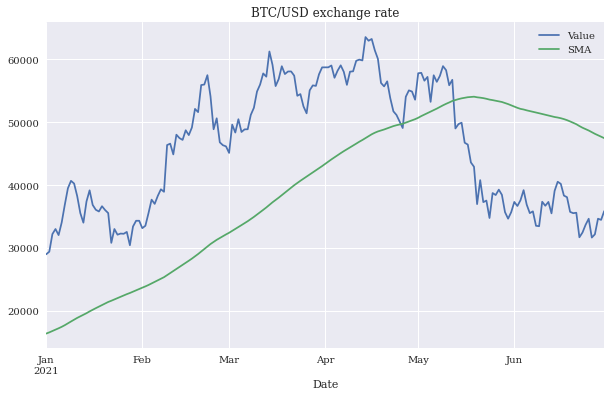

In [243]:
# Bitcoin/USD simple moving avaerage (SMA)
data = q.get('BCHAIN/MKPRU')
data['SMA'] = data['Value'].rolling(100).mean()
data.loc['2021-1-1':].plot(title='BTC/USD exchange rate',
                        figsize=(10, 6));
plt.savefig('../bitcoin_xr.png');

In [244]:
# You can then view the first three elements of the dataframe with:
data.head(3)

,Value,SMA
Date,,
2009-01-02,0.0,NaN
2009-01-03,0.0,NaN
2009-01-04,0.0,NaN


In [245]:
# You can view the last three elements of the dataframe with:
data.tail(3)

,Value,SMA
Date,,
2021-06-28,34644.45,47920.3111
2021-06-29,34456.67,47684.0198
2021-06-30,35847.70,47468.3851


In [246]:
#This finds all data points for the dataset `EOD/V` and stores them in a pandas dataframe. 
df = q.get('EOD/V')

In [247]:
# You can then view the first three elements of the dataframe with:
df.head(3)

,Open,High,Low,Close,Volume,Dividend,Split,Adj_Open,Adj_High,Adj_Low,Adj_Close,Adj_Volume
Date,,,,,,,,,,,,
2013-09-03,176.03,178.40,175.25,177.02,3137600.0,0.0,1.0,41.792650,42.355331,41.607465,42.027694,12550400.0
2013-09-04,176.90,177.88,175.25,176.19,2438300.0,0.0,1.0,41.999204,42.231873,41.607465,41.830637,9753200.0
2013-09-05,176.13,176.70,175.23,176.21,1851700.0,0.0,1.0,41.816392,41.951720,41.602716,41.835386,7406800.0


In [248]:
# You can view the last three elements of the dataframe with:
df.tail(3)

,Open,High,Low,Close,Volume,Dividend,Split,Adj_Open,Adj_High,Adj_Low,Adj_Close,Adj_Volume
Date,,,,,,,,,,,,
2017-12-26,112.07,113.4397,112.0700,112.99,3948877.0,0.0,1.0,109.779585,111.121292,109.779585,110.680782,3948877.0
2017-12-27,112.69,114.0700,112.6515,114.02,7073082.0,0.0,1.0,110.386914,111.738710,110.349200,111.689732,7073082.0
2017-12-28,114.30,114.9199,113.9900,114.35,6936266.0,0.0,1.0,111.964009,112.571240,111.660345,112.012988,6936266.0


In [249]:
#This finds all data points for the dataset `BCHAIN/BLCHS'` and stores them in a pandas dataframe. 
d = q.get('BCHAIN/BLCHS')

In [250]:
# You can then view the last three elements of the dataframe with:
d.tail(3)

,Value
Date,
2021-06-27,352157.645266
2021-06-28,352241.725649
2021-06-29,352360.822241


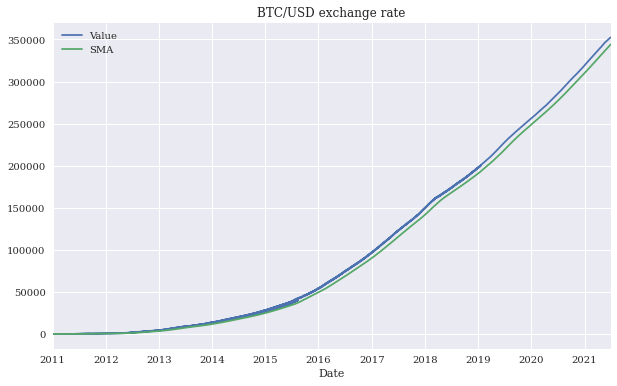

In [251]:
# Bitcoin/USD simple moving avaerage (SMA)
data = q.get('BCHAIN/BLCHS')
data['SMA'] = data['Value'].rolling(100).mean()
data.loc['2011-1-1':].plot(title='BTC/USD exchange rate',
                        figsize=(10, 6));
plt.savefig('../bitcoin_xr.png');

In [252]:
#This finds all data points for the dataset `NSE/OIL` and stores them in a pandas dataframe. 
data = q.get('NSE/OIL')

In [253]:
#This finds all data points for the dataset `NSE/OIL` and stores them in a pandas dataframe. 
# You can then view the dataframe with:
data.head(3)

,Open,High,Low,Last,Close,Total Trade Quantity,Turnover (Lacs)
Date,,,,,,,
2009-09-30,1096.0,1156.7,1090.0,1135.0,1141.20,19748012.0,223877.07
2009-10-01,1102.0,1173.7,1102.0,1167.0,1166.35,3074254.0,35463.78
2009-10-05,1152.0,1165.9,1136.6,1143.0,1140.55,919832.0,10581.13


In [254]:
# Download Entire Database (Bulk Download)
# The following code will download the entire EOD database as 
# a zip file to your current working directory.
# However, a subscribtion is required to access the database and view this dataset
#q.bulkdownload('EOD')

In [255]:
#To download database data from the previous day, you can use the download_type option.
#However, you need to subscribe to this database to get access and view this dataset.
#q.bulkdownload('EOD', download_type='partial')

In [256]:
#You can also change the filename of the downloaded zip file by using the filename option.
#However, you need to subscribe to this database to get access and view this dataset
#q.bulkdownload('EOD', filename='/my/path/EOD_DB.zip')

In [257]:
# Joining two datasets
data = q.get(['WIKI/AAPL.11','WIKI/MSFT.11'])
data.head(3)

,WIKI/AAPL - Adj. Close,WIKI/MSFT - Adj. Close
Date,,
1980-12-12,0.422706,NaN
1980-12-15,0.400652,NaN
1980-12-16,0.371246,NaN


In [258]:
### Datatables
#Datatables work similarly to datasets but provide more flexibility when it comes to filtering. 
# For example a simple way to retrieve datatable information would be:
data = q.get_table('ZACKS/FC')
data.head(3)

,m_ticker,ticker,comp_name,comp_name_2,exchange,currency_code,per_end_date,per_type,per_code,per_fisc_year,per_fisc_qtr,per_cal_year,per_cal_qtr,data_type_ind,filing_type,qtr_nbr,zacks_sector_code,zacks_x_ind_code,zacks_metrics_ind_code,fye_month,comp_cik,per_len,sic_code,filing_date,last_changed_date,state_incorp_name,bus_address_line_1,bus_city,bus_state_name,bus_post_code,bus_phone_nbr,bus_fax_nbr,mail_address_line_1,mail_city,mail_state_name,mail_post_code,country_name,country_code,home_exchange_name,emp_cnt,...,change_asset_liab,tot_change_asset_liab,oper_activity_other,cash_flow_oper_activity,net_change_prop_plant_equip,net_change_intang_asset,net_acq_divst,net_change_sterm_invst,net_change_lterm_invst,net_change_invst_tot,invst_activity_other,cash_flow_invst_activity,net_lterm_debt,net_curr_debt,debt_issue_retire_net_tot,net_comm_equity_issued_repurch,net_pref_equity_issued_repurch,net_tot_equity_issued_repurch,tot_comm_pref_stock_div_paid,fin_activity_other,cash_flow_fin_activity,fgn_exchange_rate_adj,disc_oper_misc_cash_flow_adj,incr_decr_cash,beg_cash,end_cash,stock_based_compsn,comm_stock_div_paid,pref_stock_div_paid,tot_deprec_amort_qd,stock_based_compsn_qd,cash_flow_oper_activity_qd,net_change_prop_plant_equip_qd,comm_stock_div_paid_qd,pref_stock_div_paid_qd,tot_comm_pref_stock_div_qd,wavg_shares_out,wavg_shares_out_diluted,eps_basic_net,eps_diluted_net
None,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,AAPL,AAPL,APPLE INC,Apple Inc.,NSDQ,USD,2018-09-30,A,None,2018,4,2018,3,F,10-K,2018,10,199,9,9,0000320193,12,3571,2018-11-05,2018-11-05,CA,ONE APPLE PARK WAY,CUPERTINO,CA,95014,408-996-1010,None,ONE APPLE PARK WAY,CUPERTINO,CA,95014,UNITED STATES,X1,None,132000.0,...,30013.0,34694.0,NaN,77434.0,-13313.0,NaN,-721.0,32363.0,-1518.0,30845.0,-745.0,16066.0,469.0,-37.0,432.0,-72069.0,NaN,-72069.0,-13712.0,-2527.0,-87876.0,NaN,NaN,5624.0,20289.0,25913.0,5340.0,-13712.0,None,NaN,NaN,NaN,NaN,NaN,None,NaN,19821.51,20000.44,3.0000,2.9800
1,AAPL,AAPL,APPLE INC,Apple Inc.,NSDQ,USD,2018-03-31,Q,None,2018,2,2018,1,F,10-Q,201802,10,199,9,9,0000320193,3,3571,2018-05-02,2018-05-02,CA,ONE APPLE PARK WAY,CUPERTINO,CA,95014,408-996-1010,None,ONE APPLE PARK WAY,CUPERTINO,CA,95014,UNITED STATES,X1,None,NaN,...,47082.0,35794.0,NaN,43423.0,-7005.0,NaN,-305.0,22377.0,-163.0,22214.0,216.0,15120.0,6469.0,NaN,6469.0,-32524.0,NaN,-32524.0,-6529.0,-1189.0,-33773.0,NaN,NaN,24770.0,20289.0,45059.0,2644.0,-6529.0,None,2739.0,1348.0,15130.0,-4195.0,-3190.0,None,-3190.0,20099.51,20273.97,0.6875,0.6825
2,AAPL,AAPL,APPLE INC,Apple Inc.,NSDQ,USD,2018-06-30,Q,None,2018,3,2018,2,F,10-Q,201803,10,199,9,9,0000320193,3,3571,2018-08-01,2018-08-01,CA,ONE APPLE PARK WAY,CUPERTINO,CA,95014,408-996-1010,None,ONE APPLE PARK WAY,CUPERTINO,CA,95014,UNITED STATES,X1,None,NaN,...,41648.0,33880.0,NaN,57911.0,-10272.0,NaN,-431.0,31771.0,-1478.0,30293.0,-523.0,19067.0,469.0,-10.0,459.0,-53306.0,NaN,-53306.0,-10182.0,-2267.0,-65296.0,NaN,NaN,11682.0,20289.0,31971.0,3995.0,-10182.0,None,2665.0,1351.0,14488.0,-3267.0,-3653.0,None,-3653.0,19528.67,19706.44,0.5900,0.5850


In [259]:
#Given the volume of data stored in datatables, this call will retrieve the 
# first page of the `ZACKS/FC` datatable. 
#You may turn on pagination to return more data by using:
data = q.get_table('ZACKS/FC', paginate=True)
data.head(3)


,m_ticker,ticker,comp_name,comp_name_2,exchange,currency_code,per_end_date,per_type,per_code,per_fisc_year,per_fisc_qtr,per_cal_year,per_cal_qtr,data_type_ind,filing_type,qtr_nbr,zacks_sector_code,zacks_x_ind_code,zacks_metrics_ind_code,fye_month,comp_cik,per_len,sic_code,filing_date,last_changed_date,state_incorp_name,bus_address_line_1,bus_city,bus_state_name,bus_post_code,bus_phone_nbr,bus_fax_nbr,mail_address_line_1,mail_city,mail_state_name,mail_post_code,country_name,country_code,home_exchange_name,emp_cnt,...,change_asset_liab,tot_change_asset_liab,oper_activity_other,cash_flow_oper_activity,net_change_prop_plant_equip,net_change_intang_asset,net_acq_divst,net_change_sterm_invst,net_change_lterm_invst,net_change_invst_tot,invst_activity_other,cash_flow_invst_activity,net_lterm_debt,net_curr_debt,debt_issue_retire_net_tot,net_comm_equity_issued_repurch,net_pref_equity_issued_repurch,net_tot_equity_issued_repurch,tot_comm_pref_stock_div_paid,fin_activity_other,cash_flow_fin_activity,fgn_exchange_rate_adj,disc_oper_misc_cash_flow_adj,incr_decr_cash,beg_cash,end_cash,stock_based_compsn,comm_stock_div_paid,pref_stock_div_paid,tot_deprec_amort_qd,stock_based_compsn_qd,cash_flow_oper_activity_qd,net_change_prop_plant_equip_qd,comm_stock_div_paid_qd,pref_stock_div_paid_qd,tot_comm_pref_stock_div_qd,wavg_shares_out,wavg_shares_out_diluted,eps_basic_net,eps_diluted_net
None,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,AAPL,AAPL,APPLE INC,Apple Inc.,NSDQ,USD,2018-09-30,A,None,2018,4,2018,3,F,10-K,2018,10,199,9,9,0000320193,12,3571,2018-11-05,2018-11-05,CA,ONE APPLE PARK WAY,CUPERTINO,CA,95014,408-996-1010,None,ONE APPLE PARK WAY,CUPERTINO,CA,95014,UNITED STATES,X1,None,132000.0,...,30013.0,34694.0,NaN,77434.0,-13313.0,NaN,-721.0,32363.0,-1518.0,30845.0,-745.0,16066.0,469.0,-37.0,432.0,-72069.0,NaN,-72069.0,-13712.0,-2527.0,-87876.0,NaN,NaN,5624.0,20289.0,25913.0,5340.0,-13712.0,None,NaN,NaN,NaN,NaN,NaN,None,NaN,19821.51,20000.44,3.0000,2.9800
1,AAPL,AAPL,APPLE INC,Apple Inc.,NSDQ,USD,2018-03-31,Q,None,2018,2,2018,1,F,10-Q,201802,10,199,9,9,0000320193,3,3571,2018-05-02,2018-05-02,CA,ONE APPLE PARK WAY,CUPERTINO,CA,95014,408-996-1010,None,ONE APPLE PARK WAY,CUPERTINO,CA,95014,UNITED STATES,X1,None,NaN,...,47082.0,35794.0,NaN,43423.0,-7005.0,NaN,-305.0,22377.0,-163.0,22214.0,216.0,15120.0,6469.0,NaN,6469.0,-32524.0,NaN,-32524.0,-6529.0,-1189.0,-33773.0,NaN,NaN,24770.0,20289.0,45059.0,2644.0,-6529.0,None,2739.0,1348.0,15130.0,-4195.0,-3190.0,None,-3190.0,20099.51,20273.97,0.6875,0.6825
2,AAPL,AAPL,APPLE INC,Apple Inc.,NSDQ,USD,2018-06-30,Q,None,2018,3,2018,2,F,10-Q,201803,10,199,9,9,0000320193,3,3571,2018-08-01,2018-08-01,CA,ONE APPLE PARK WAY,CUPERTINO,CA,95014,408-996-1010,None,ONE APPLE PARK WAY,CUPERTINO,CA,95014,UNITED STATES,X1,None,NaN,...,41648.0,33880.0,NaN,57911.0,-10272.0,NaN,-431.0,31771.0,-1478.0,30293.0,-523.0,19067.0,469.0,-10.0,459.0,-53306.0,NaN,-53306.0,-10182.0,-2267.0,-65296.0,NaN,NaN,11682.0,20289.0,31971.0,3995.0,-10182.0,None,2665.0,1351.0,14488.0,-3267.0,-3653.0,None,-3653.0,19528.67,19706.44,0.5900,0.5850


In [260]:
# The above code will retrieve multiple pages of data and merge them together as 
# if they were one large page. In some cases, however, you will still exceed the request limit.
# In this case we recommend you filter your data using the available query parameters, as in the following example:
data = q.get_table('ZACKS/FC', paginate=True, ticker=['AAPL', 'MSFT'], per_end_date={'gte': '2021-06-01'}, qopts={'columns':['ticker', 'per_end_date']})

In [261]:
#Download table data as a zip file. You can download all the table data in a data table in a single call. 
# The following will download the entire F1 table data as a zip file to your current working directory:
data = q.export_table('MER/F1')

In [262]:
# You can also specify where to download the zip file:
data = q.export_table('MER/F1', filename='C:\\Users\\Youssouf\\Desktop\\Applied Data Science Folder\\Demystifying Python\\db.zip')

In [263]:
#You can also specify what data you want to download with filters and parameters.
# (`cursor_id` and `paginate` are not supported for exporting table zip file):
datatable=q.export_table('ZACKS/FC',  ticker=['AAPL', 'MSFT'], per_end_date={'gte': '2021-06-01'}, qopts={'columns':['ticker', 'per_end_date']})

In [264]:
#A dataset's data can be queried through the dataset object. For example:
data = q.Dataset('WIKI/AAPL').data()

In [265]:
#A number of optional query parameters can be passed to `data()`:
dataset_data = q.Dataset('WIKI/AAPL').data(params={ 'start_date':'2011-01-01', 'end_date':'2020-01-01', 'collapse':'annual', 'transformation':'rdiff', 'rows':4 })

In [266]:
#You can access the data much like you would other lists. 
#In addition all the data columns, fields are mapped to their column_names for convenience:

dataset_data[0].date

datetime.date(2011, 12, 31)

In [267]:
#A datatable's data can be retrieved in much the same was as a dataset. 
# For example:
data = q.Datatable('ZACKS/FC').data()

In [268]:
#Note that unlike a dataset, datatables information may be paginated. 
#If the data object returned back contains a `cursor_id` you 
#will need to make another call appending that `cursor_id` to the datatables parameters.
data2 = q.Datatable('ZACKS/FC').data(params={'qopts': {'cursor_id': data.meta['next_cursor_id']}})

In [269]:
#Note that all parameter options are given under the kwarg `params`. 
# These parameters will be passed through the API call. 
# You can see a complete list of parameters (https://www.quandl.com/docs/api#datatables).
# We also recommend using filters. 
#This can help to reduce the number of pages returned in the result set. For example:

data = q.Datatable('ZACKS/FC').data(params={'ticker': ['AAPL','MSFT'], 'per_end_date': {'gte': '2015-01-01'}, 'qopts': {'columns': ['ticker', 'comp_name']}}, 
                                    qopts={'columns':['ticker', 'per_end_date']})

In [270]:
#This however may still result in multiple pages so be sure to check for a resulting `cursor_id`.
# An example code that retrieves all pages of data with a filter may look something like:

data_list = []
cursor_id = None
while True:
    data = q.Datatable('ZACKS/FC').data(params={'ticker': ['AAPL','MSFT'], 'per_end_date': {'gte': '2015-01-01'}, 'qopts': {'columns': ['ticker', 'comp_name'], 'cursor_id': cursor_id}})
    cursor_id = data.meta['next_cursor_id']
    data_list.append(data)
    if cursor_id is None:
        break

In [271]:
data = q.export_table('MER/F1')

In [272]:
#You can also specify where to download the zip file:
data = q.export_table('MER/F1', filename='C:\\Users\\Youssouf\\Desktop\\Applied Data Science Folder\\Demystifying Python\\db.zip')

In [273]:
#You can also specify what data you want to download with filters and parameters.
#(`cursor_id` and `paginate` are not supported for exporting table zip file):
q.export_table('ZACKS/FC',  ticker=['AAPL', 'MSFT'], per_end_date={'gte': '2021-01-01'}, qopts={'columns':['ticker', 'per_end_date']})

In [274]:
#### Download Entire Database (Bulk Download)
#To get the url for downloading all dataset data in a database:
q.Database('ZEA').bulk_download_url()

'https://www.quandl.com/api/v3/databases/ZEA/data?api_key=PjQ86fPjYWus2mxZy3Rk'

In [275]:
#To bulk download all dataset data in a database:
# We need to subscribe to this database to get access.
#q.Database('ZEA').bulk_download_to_file('C:\\Users\\Youssouf\\Desktop\\Applied Data Science Folder\\Demystifying Python')

In [276]:
# We need to subscribe to this database to get access.
#q.Database('ZEA').bulk_download_to_file('.', params={'download_type': 'partial'})

In [277]:
### MergedDataset
#You can get a merged representation of multiple datasets.
merged_dataset = q.MergedDataset([('WIKI/AAPL', {'column_index': [11]}),
                                           ('WIKI/MSFT', {'column_index': [9,11]}), 'WIKI/TWTR'])

#In the above example the following data will be merged together:
# column 11 of dataset 'WIKI/AAPL'
#columns 9 and 11 of dataset 'WIKI/MSFT'
#all columns of 'WIKI/TWTR' is requested

In [278]:
#To get the data for the MergedDataset:
data = merged_dataset.data()

In [279]:
#### Data formats
#To convert the data into numpy format:
data.to_numpy()

rec.array([('1980-12-12T00:00:00.000000000',   0.42270592,    nan,   nan,   nan,   nan,     nan,   nan,       nan, nan, nan,   nan,   nan,     nan,   nan,       nan),
           ('1980-12-15T00:00:00.000000000',   0.40065169,    nan,   nan,   nan,   nan,     nan,   nan,       nan, nan, nan,   nan,   nan,     nan,   nan,       nan),
           ('1980-12-16T00:00:00.000000000',   0.37124607,    nan,   nan,   nan,   nan,     nan,   nan,       nan, nan, nan,   nan,   nan,     nan,   nan,       nan),
           ...,
           ('2018-03-23T00:00:00.000000000', 164.94      , 90.46 , 87.18, 31.26, 32.  , 30.7907, 31.03, 24478532.,  0.,  1., 31.26, 32.  , 30.7907, 31.03, 24478532.),
           ('2018-03-26T00:00:00.000000000', 172.77      , 94.   , 93.78, 31.69, 32.47, 30.7   , 31.91, 25477813.,  0.,  1., 31.69, 32.47, 30.7   , 31.91, 25477813.),
           ('2018-03-27T00:00:00.000000000', 168.34      , 95.139, 89.47, 31.85, 31.9 , 27.88  , 28.07, 79821992.,  0.,  1., 31.85, 31.9 , 27.88  , 2

In [280]:
#To convert the data into csv format:
data.to_csv()

'Date,WIKI/AAPL - Adj. Close,WIKI/MSFT - Adj. High,WIKI/MSFT - Adj. Close,WIKI/TWTR - Open,WIKI/TWTR - High,WIKI/TWTR - Low,WIKI/TWTR - Close,WIKI/TWTR - Volume,WIKI/TWTR - Ex-Dividend,WIKI/TWTR - Split Ratio,WIKI/TWTR - Adj. Open,WIKI/TWTR - Adj. High,WIKI/TWTR - Adj. Low,WIKI/TWTR - Adj. Close,WIKI/TWTR - Adj. Volume\n1980-12-12,0.42270591588018,,,,,,,,,,,,,,\n1980-12-15,0.40065169418209,,,,,,,,,,,,,,\n1980-12-16,0.37124606525129,,,,,,,,,,,,,,\n1980-12-17,0.38036181021984,,,,,,,,,,,,,,\n1980-12-18,0.39153594921354,,,,,,,,,,,,,,\n1980-12-19,0.41535450864748,,,,,,,,,,,,,,\n1980-12-22,0.43564439260973,,,,,,,,,,,,,,\n1980-12-23,0.45402291069148,,,,,,,,,,,,,,\n1980-12-24,0.47784147012542,,,,,,,,,,,,,,\n1980-12-26,0.52194991352162,,,,,,,,,,,,,,\n1980-12-29,0.52930132075432,,,,,,,,,,,,,,\n1980-12-30,0.51636284402477,,,,,,,,,,,,,,\n1980-12-31,0.50180705770402,,,,,,,,,,,,,,\n1981-01-02,0.50724709905622,,,,,,,,,,,,,,\n1981-01-05,0.49621998820717,,,,,,,,,,,,,,\n1981-01-06,0.47416576650907,,,,,,

In [281]:
#To convert the data into a [pandas](http://pandas.pydata.org/) dataframe:
data.to_pandas().head(3)

,WIKI/AAPL - Adj. Close,WIKI/MSFT - Adj. High,WIKI/MSFT - Adj. Close,WIKI/TWTR - Open,WIKI/TWTR - High,WIKI/TWTR - Low,WIKI/TWTR - Close,WIKI/TWTR - Volume,WIKI/TWTR - Ex-Dividend,WIKI/TWTR - Split Ratio,WIKI/TWTR - Adj. Open,WIKI/TWTR - Adj. High,WIKI/TWTR - Adj. Low,WIKI/TWTR - Adj. Close,WIKI/TWTR - Adj. Volume
Date,,,,,,,,,,,,,,,
1980-12-12,0.422706,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-12-15,0.400652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-12-16,0.371246,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [282]:
#Since the data is a [List](#list), the raw data can be retrieved via:
print(data.to_list())

[(datetime.datetime(1980, 12, 12, 0, 0), 0.42270591588018, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan), (datetime.datetime(1980, 12, 15, 0, 0), 0.40065169418209, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan), (datetime.datetime(1980, 12, 16, 0, 0), 0.37124606525129, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan), (datetime.datetime(1980, 12, 17, 0, 0), 0.38036181021984, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan), (datetime.datetime(1980, 12, 18, 0, 0), 0.39153594921354, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan), (datetime.datetime(1980, 12, 19, 0, 0), 0.41535450864748, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan), (datetime.datetime(1980, 12, 22, 0, 0), 0.43564439260973, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan), (datetime.datetime(1980, 12, 23, 0, 0), 0.45402291069148, nan, nan, nan, nan, nan, nan, nan, nan

In [283]:
## Retrieving metadata
# To retrieve metadata about a dataset simply instantiate its object using its Quandl code:
q.Dataset('WIKI/AAPL')

In [284]:
#Once instantiated you can then make data or metadata calls on the object. A metadata call looks like:
q.Dataset('WIKI/AAPL').data_fields()

['id',
 'dataset_code',
 'database_code',
 'name',
 'description',
 'refreshed_at',
 'newest_available_date',
 'oldest_available_date',
 'column_names',
 'frequency',
 'type',
 'premium',
 'database_id']

In [285]:
#### Database
#To retrieve metadata about a database simply instantiate its object 
# with a database code and then call a metadata method on it:
db = q.Database('WIKI')
db.name

'Wiki EOD Stock Prices'

In [286]:
#You can also get data through other objects such as a dataset:
dataset = q.Dataset('WIKI/AAPL')
dataset.database()

In [287]:
#Retrieve a list of databases by using:
q.Database.all()
#By default, each list query will return page 1 of the first 100 results 
#(please see the official [API Documentation](https://www.quandl.com/docs/api) for more detail).

In [288]:
#Retrieve the dataset through the database by using the helper method.
q.Database('WIKI').datasets()

In [289]:
#Datatable
#Much like databases and datasets you can retrieve datatable metadata via its Quandl code:
dt = q.Datatable('ZACKS/FC')

In [290]:
dt.data_fields()

['vendor_code',
 'datatable_code',
 'name',
 'description',
 'columns',
 'filters',
 'primary_key',
 'premium',
 'status',
 'data_version']

**Working with database**

In [291]:
#All data once retrieved is abstracted into custom classes. 
#You can get a list of the fields in each class by using the `data_fields` method.
database = q.Database('WIKI')
database.data_fields()

['id',
 'name',
 'database_code',
 'description',
 'datasets_count',
 'downloads',
 'premium',
 'image',
 'favorite',
 'url_name',
 'exclusive']

In [292]:
#You can then uses these methods in your code. 
#Additionally you can access the data by using the hash equalivalent lookup:
database = q.Database('WIKI')
database.database_code

'WIKI'

In [293]:
database['database_code']

'WIKI'

In [294]:
#In some cases the names of the fields returned by the API may not be compatible 
#with the Python language syntax. These will be converted into compatible field names.
data = q.Dataset('WIKI/AAPL').data(params={ 'limit': 1 })[0]

In [295]:
data.column_names

['Date',
 'Open',
 'High',
 'Low',
 'Close',
 'Volume',
 'Ex-Dividend',
 'Split Ratio',
 'Adj. Open',
 'Adj. High',
 'Adj. Low',
 'Adj. Close',
 'Adj. Volume']

In [296]:
data.data_fields()

['date',
 'open',
 'high',
 'low',
 'close',
 'volume',
 'ex_dividend',
 'split_ratio',
 'adj_open',
 'adj_high',
 'adj_low',
 'adj_close',
 'adj_volume']

In [297]:
#### List
#All list queries will return an object inherited from ModelList.
#To get the values of a list:
databases = q.Database.all()
databases.values

In [298]:
#To get the metadata of a list:
databases = q.Database.all()
databases.meta

{'current_first_item': 1,
 'current_last_item': 100,
 'current_page': 1,
 'next_page': 2,
 'per_page': 100,
 'prev_page': None,
 'query': '',
 'total_count': 105,
 'total_pages': 2}

In [299]:
#To get the raw data of a list:
databases = q.Database.all()
databases.to_list()

[[15123,
  'Wells Fargo Home Mortgage Loans',
  'WFC',
  'This database offers mortgage purchase and refinance rates from Wells Fargo Home Mortgage, a division of Wells Fargo Bank. ',
  68,
  148126,
  False,
  'http://d360wc4uc6n3i9.cloudfront.net/images/default-avatar.png',
  False,
  'Wells-Fargo-Home-Mortgage-Loans',
  False],
 [59,
  'US Federal Reserve Data Releases',
  'FED',
  'Official US figures on money supply, interest rates, mortgages, government finances, bank assets and debt, exchange rates, industrial production.',
  59009,
  352972023,
  False,
  'https://quandl-production-data-upload.s3.amazonaws.com/uploads/source/profile_image/59/thumb_us-federal-reserve.png',
  False,
  'US-Federal-Reserve-Data-Releases',
  False],
 [11222,
  'Reserve Bank of Australia',
  'RBA',
  "Central bank and monetary authority, regulates banking industry, sets interest rates, and services government's debt. Data on key economic indicators.",
  3651,
  4545934,
  False,
  'https://quandl-pro

By default, each list query will return page 1 of the first 100 results (please see the official [API Documentation](https://www.quandl.com/docs/api) for more detail). Depending on the list query results, you can pass additional parameters to filter the data.

In [300]:
#Database.all() and Dataset.all() will return a paginated list of results in the form of a PaginatedList object. 
databases = q.Database.all()

In [301]:
#You can check whether the PaginatedList has more data by using the has_more_results() method. 
databases.has_more_results()

True

In [302]:
q.Database.all(params={ 'page': 2 })

In [303]:
#Lists also function as arrays and can be iterated through. 
#Note however that using these features will only work on the current page of data you have locally. 
#You will need to continue to fetch results and iterate again to loop through the full result set.

databases = q.Database.all()
for database in databases:
    print(database.database_code)

WFC
FED
RBA
SIDC
OPEC
GDT
JODI
BITFINEX
WARSAWSE
ARES
FINRA
PSE
TFX
PSX
ISM
EIA
ODA
BTER
CFTC
BOE
UMICH
RATEINF
ML
MULTPL
BCB
BP
CASS
ACC
HKEX
BATS
BSE
FRED
FMAC
USTREASURY
LBMA
OPT
OWF
ICI1
ICI4
EOD
CUR
CBARH
EA1
QOA
QOR
YC
XSHE
XSHG
XSES
XPAR
VOL
XHKG
XBOM
XBRU
XHAN
XETR
XHAM
XFRA
SGE
RB1
VOLX
QRM
XAMS
XLON
XNAS
XNYS
XJPX
XNSE
XMUN
XLIS
BCIC
BCEUX
XDUS
BNC1
BNC2
XASE
EVB
BCLFE
BCMGEX
BCMX
BCICE
BCICEC
BCIO
BCIP
OTCB
XBER
SRF
XSTU
ICI2
ICI3
YALE
ECB
OECD
MGEX
MX
BCIW
BCHAIN
SHFE
EUREX
ECONOMIST


In [304]:
databases.has_more_results()

True

In [305]:
more_databases = q.Database.all(params={ 'page': 2 })
for database in more_databases:
    print(database.database_code)

NASDAQOMX
XTSX
XTSE
TC1
BCII


In [306]:
#Lists also return metadata associated with the request. 
#This can include things like the current page, total results, etc. 
#Each of these fields can be accessed through a hash or convenience method.
q.Database.all().current_page

1

In [307]:
q.Database.all()[0]

In [308]:
def get_point_in_time(datatable_code, **options):
    validate_pit_options(options)
    pit_options = {}

    # Remove the PIT params/keys from the options to not send it as a query params
    for k in ['interval', 'date', 'start_date', 'end_date']:
        if k in options.keys():
            pit_options[k] = options.pop(k)

    if 'paginate' in options.keys():
        paginate = options.pop('paginate')
    else:
        paginate = None

    data = None
    page_count = 0
    while True:
        next_options = copy.deepcopy(options)
        next_data = PointInTime(datatable_code, pit=pit_options).data(params=next_options)

        if data is None:
            data = next_data
        else:
            data.extend(next_data)

        if page_count >= ApiConfig.page_limit:
            raise LimitExceededError(
                Message.WARN_DATA_LIMIT_EXCEEDED % (datatable_code,
                                                    ApiConfig.api_key
                                                    )
            )

        next_cursor_id = next_data.meta['next_cursor_id']

        if next_cursor_id is None:
            break
        elif paginate is not True and next_cursor_id is not None:
            warnings.warn(Message.WARN_PAGE_LIMIT_EXCEEDED, UserWarning)
            break

        page_count = page_count + 1
        options['qopts.cursor_id'] = next_cursor_id
    return data.to_pandas()

In [309]:
def validate_pit_options(options):
    if 'interval' not in options.keys():
        raise InvalidRequestError('option `interval` is required')

    if options['interval'] not in ['asofdate', 'from', 'between']:
        raise InvalidRequestError('option `interval` is invalid')

    if options['interval'] in ['from', 'between']:
        if 'start_date' not in options.keys() or 'end_date' not in options.keys():
            raise InvalidRequestError('options `start_date` and `end_date` are required')

#Examining the data (Clean it if required)

In [322]:
# Fetches stock market data 
import fix_yahoo_finance as yf
yf.pdr_override()

In [323]:
symbol = 'AMD'# 1: Input the stock symbol   
start = '2020-04-27'# 2: Input the stock starting date 
end = '2021-04-27'# 3. Input the stock ending date  

# Read data 
data = yf.download(symbol,start,end)

[*********************100%***********************]  1 of 1 downloaded


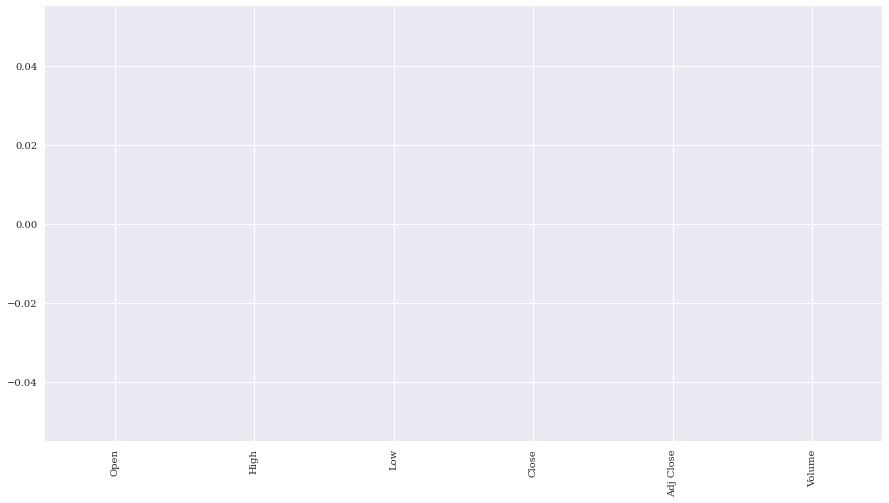

In [324]:
dataset_missing_count = data.isnull().sum() # Values of NaN is missing data
plt.rcParams['figure.figsize'] = (15,8)
dataset_missing_count.plot.bar()
plt.show()

In [331]:
data.mean()

Open         7.699877e+01
High         7.829214e+01
Low          7.539802e+01
Close        7.688917e+01
Adj Close    7.688917e+01
Volume       5.172398e+07
dtype: float64

In [325]:
# Print five records
data.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-04-27,57.439999,58.000000,56.250000,56.490002,56.490002,62568100
2020-04-28,57.160000,57.349998,55.299999,55.509998,55.509998,80501800
2020-04-29,54.529999,54.860001,52.740002,53.660000,53.660000,110800900
2020-04-30,53.430000,54.290001,52.029999,52.389999,52.389999,65543900
2020-05-01,51.070000,51.950001,49.090000,49.880001,49.880001,69562700


In [326]:
# Do we have any empty records in our data?
# No.
np.where(pd.isnull(dataset))

(array([], dtype=int64),)

In [327]:
# Let us describe our dataset
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,252.000000,252.000000,252.000000,252.000000,252.000000,2.520000e+02
mean,76.998770,78.292143,75.398016,76.889167,76.889167,5.172398e+07
std,14.168186,14.297003,13.951638,14.138128,14.138128,2.209164e+07
min,49.820000,50.279999,48.419998,49.880001,49.880001,1.670590e+07
25%,67.119999,69.905002,66.277499,68.630001,68.630001,3.834998e+07
50%,81.529999,82.859996,79.365002,81.584999,81.584999,4.736465e+07
75%,86.852501,87.867496,85.027499,86.555002,86.555002,5.727638e+07
max,97.860001,99.230003,96.250000,97.250000,97.250000,2.053145e+08


In [329]:
# Summarize the number of unique values in each column
print(data.nunique())

Open         237
High         237
Low          231
Close        239
Adj Close    239
Volume       252
dtype: int64


In [330]:
# Show dtypes
print(data.dtypes)

Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object


#Pre-processing the data

In [333]:
# Creating new Labels 
data['Increase_Decrease_L'] = np.where(data['Volume'].shift(-1) > data['Volume'],'Increase','Decrease')
data['Buy_Sell_on_Open_L'] = np.where(data['Open'].shift(-1) > data['Open'],'Buy','Sell')
data['Buy_Sell_L'] = np.where(data['Adj Close'].shift(-1) > data['Adj Close'],'Buy','Sell')
data.head()

,Open,High,Low,Close,Adj Close,Volume,Increase_Decrease_L,Buy_Sell_on_Open_L,Buy_Sell_L
Date,,,,,,,,,
2020-04-27,57.439999,58.000000,56.250000,56.490002,56.490002,62568100,Increase,Sell,Sell
2020-04-28,57.160000,57.349998,55.299999,55.509998,55.509998,80501800,Increase,Sell,Sell
2020-04-29,54.529999,54.860001,52.740002,53.660000,53.660000,110800900,Decrease,Sell,Sell
2020-04-30,53.430000,54.290001,52.029999,52.389999,52.389999,65543900,Increase,Sell,Sell
2020-05-01,51.070000,51.950001,49.090000,49.880001,49.880001,69562700,Decrease,Sell,Buy


**Defining categorical and numerical data**

In [334]:
# Creating more string Labels 
data['Increase_Decrease_L'] = np.where(data['Volume'].shift(-1) > data['Volume'],'Increase','Decrease')
data['Buy_Sell_on_Open_L'] = np.where(data['Open'].shift(-1) > data['Open'],'Buy','Sell')
data['Buy_Sell_L'] = np.where(data['Adj Close'].shift(-1) > data['Adj Close'],'Buy','Sell')
data.head()

,Open,High,Low,Close,Adj Close,Volume,Increase_Decrease_L,Buy_Sell_on_Open_L,Buy_Sell_L
Date,,,,,,,,,
2020-04-27,57.439999,58.000000,56.250000,56.490002,56.490002,62568100,Increase,Sell,Sell
2020-04-28,57.160000,57.349998,55.299999,55.509998,55.509998,80501800,Increase,Sell,Sell
2020-04-29,54.529999,54.860001,52.740002,53.660000,53.660000,110800900,Decrease,Sell,Sell
2020-04-30,53.430000,54.290001,52.029999,52.389999,52.389999,65543900,Increase,Sell,Sell
2020-05-01,51.070000,51.950001,49.090000,49.880001,49.880001,69562700,Decrease,Sell,Buy


In [335]:
# Defining more new columns
data['Open_Close'] = (data['Open'] - data['Adj Close'])/data['Open']
data['High_Low'] = (data['High'] - data['Low'])/data['Low']
data['Increase_Decrease'] = np.where(data['Volume'].shift(-1) > data['Volume'],1,0)
data['Buy_Sell_on_Open'] = np.where(data['Open'].shift(-1) > data['Open'],1,0)
data['Buy_Sell'] = np.where(data['Adj Close'].shift(-1) > data['Adj Close'],1,0)
data['Returns'] = data['Adj Close'].pct_change()
data = data.dropna()
data.head()

,Open,High,Low,Close,Adj Close,Volume,Increase_Decrease_L,Buy_Sell_on_Open_L,Buy_Sell_L,Open_Close,High_Low,Increase_Decrease,Buy_Sell_on_Open,Buy_Sell,Returns
Date,,,,,,,,,,,,,,,
2020-04-28,57.160000,57.349998,55.299999,55.509998,55.509998,80501800,Increase,Sell,Sell,0.028866,0.037071,1,0,0,-0.017348
2020-04-29,54.529999,54.860001,52.740002,53.660000,53.660000,110800900,Decrease,Sell,Sell,0.015955,0.040197,0,0,0,-0.033327
2020-04-30,53.430000,54.290001,52.029999,52.389999,52.389999,65543900,Increase,Sell,Sell,0.019465,0.043437,1,0,0,-0.023668
2020-05-01,51.070000,51.950001,49.090000,49.880001,49.880001,69562700,Decrease,Sell,Buy,0.023301,0.058260,0,0,1,-0.047910
2020-05-04,49.820000,52.610001,49.730000,52.560001,52.560001,62590600,Decrease,Buy,Sell,-0.054998,0.057913,0,1,0,0.053729


In [336]:
# Let us separate the features and labels
data_feat = data.drop(columns=["Buy_Sell"],axis=1)
data_label = data["Buy_Sell"]

In [337]:
# First let's take a look at all the columns
list(data_feat.columns)

['Open',
 'High',
 'Low',
 'Close',
 'Adj Close',
 'Volume',
 'Increase_Decrease_L',
 'Buy_Sell_on_Open_L',
 'Buy_Sell_L',
 'Open_Close',
 'High_Low',
 'Increase_Decrease',
 'Buy_Sell_on_Open',
 'Returns']

In [338]:
# Create categorical_columns
# Create continuous_columns
categorical_columns = [col for col in data_feat.columns if len(data_feat[col].unique())==2 or data_feat[col].dtype=='O']
continuous_columns = [col for col in data_feat.columns if len(data_feat[col].unique())>2 and (data_feat[col].dtype=='int64' or data_feat[col].dtype=='float64')]

In [339]:
print('='*123)
#print categorical columns
print("Categorical Variables:", categorical_columns)
print('='*123)
#print continuous columns
print("Continuous Variables:", continuous_columns)
print('='*123)

Categorical Variables: ['Increase_Decrease_L', 'Buy_Sell_on_Open_L', 'Buy_Sell_L', 'Increase_Decrease', 'Buy_Sell_on_Open']
Continuous Variables: ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Open_Close', 'High_Low', 'Returns']


#Exploring the data

**Applied Statisctical models**

In [340]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm
import math
import warnings
warnings.filterwarnings("ignore")
import fix_yahoo_finance as yf
yf.pdr_override()

In [341]:
symbol = 'AMG'
market = '^GSPC'
start = '2020-06-01'
end = '2021-06-01'

# Reads stock data as dataframe
data = yf.download(symbol,start,end)

#Reads market data as dataframe
dfm = yf.download(market,start,end)

# View first five rows
data.head()

[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-06-01,66.930000,68.699997,66.430000,68.279999,68.252602,415600
2020-06-02,69.389999,69.940002,68.059998,69.720001,69.692024,677200
2020-06-03,71.430000,75.150002,71.279999,74.489998,74.460114,544400
2020-06-04,74.050003,76.830002,72.559998,76.400002,76.369339,611900
2020-06-05,81.680000,82.449997,77.669998,78.139999,78.108643,473400


In [342]:
data.shape

(252, 6)

In [343]:
dfm.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-06-01,3038.780029,3062.179932,3031.540039,3055.729980,3055.729980,4673410000
2020-06-02,3064.780029,3081.070068,3051.639893,3080.820068,3080.820068,5187230000
2020-06-03,3098.899902,3130.939941,3098.899902,3122.870117,3122.870117,5989560000
2020-06-04,3111.560059,3128.909912,3090.409912,3112.350098,3112.350098,6428130000
2020-06-05,3163.840088,3211.719971,3163.840088,3193.929932,3193.929932,8617590000


In [344]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,252.000000,252.000000,252.000000,252.000000,252.000000,2.520000e+02
mean,103.736032,105.341905,102.250198,103.877302,103.861602,4.010286e+05
std,35.236061,35.687786,34.773336,35.265520,35.271382,1.736531e+05
min,62.970001,64.519997,62.189999,63.380001,63.363873,9.660000e+04
25%,72.449999,73.872499,71.597500,72.692503,72.674003,2.830000e+05
50%,89.384998,90.599998,87.724998,89.504998,89.493595,3.608500e+05
75%,143.140003,145.487499,141.382496,143.102497,143.094059,4.690750e+05
max,173.770004,176.839996,172.770004,174.860001,174.849686,1.412300e+06


In [345]:
new_df = pd.DataFrame({symbol : data['Adj Close'], market : dfm['Adj Close']}, index=data.index)

In [346]:
new_df.describe()

,AMG,^GSPC
count,252.000000,252.000000
mean,103.861602,3628.530963
std,35.271382,342.934057
min,63.363873,3002.100098
25%,72.674003,3348.974915
50%,89.493595,3632.529907
75%,143.094059,3909.609986
max,174.849686,4232.600098


In [347]:
# Computes returns
new_df[['stock_returns','market_returns']] = new_df[[symbol,market]] / new_df[[symbol,market]].shift(1) -1
new_df = new_df.dropna()
covmat = np.cov(new_df["stock_returns"],new_df["market_returns"])

In [348]:
covmat

array([[0.00061648, 0.00013984],
       [0.00013984, 0.00011779]])

**Computes Alpha and Beta**

In [349]:
# Computes Alpha and Beta
beta = covmat[0,1]/covmat[1,1]
alpha= np.mean(new_df["stock_returns"])-beta*np.mean(new_df["market_returns"])
print('Beta:', beta)
print('Alpha:', alpha)

Beta: 1.18720989736083
Alpha: 0.002219686873934002


In [350]:
close = data['Adj Close']

**Mean**

In [351]:
# Mean is the average
mean = np.mean(close)
mean

103.86160161904768

**Median**

In [352]:
# Median is the value of middlemost value
median = np.median(close)
median

89.493595

**Mode**

In [353]:
# Mode is the most frequent value
mode = stats.mode(close)
print("The modal value is {} with a count of {}".format(mode.mode[0], mode.count[0]))

The modal value is 70.712006 with a count of 2


**Range**

In [354]:
# Range is a measure of how spread apart the values are
range_of_stock = np.ptp(close)
range_of_stock

111.48581300000002

**Variance**

In [355]:
# Variance is a measure of how variable the data is
import numpy as np
variance = np.var(close)
variance

1239.1335732855057

**Standard deviation**

In [356]:
# Computes the amount of variation or dispersion of a set of values. 
standard_deviation = np.std(close)
standard_deviation

35.20132914089333

**Standard error**

In [357]:
# Computes the variability between the sample obtained 
# from multiple samples of the same population
standard_error = stats.sem(close)
standard_error

2.221888193533546

**Z-score**

In [358]:
# Computes how many standard deviations an element is from the mean
z = np.abs(stats.zscore(close))
#print(z)

**Correlations between Low and High**

In [359]:
# Contingency Table shows correlations between two variables
data_crosstab = pd.crosstab(data['High'], 
                            data['Low'],  
                               margins = False) 

In [360]:
print(data_crosstab)

Low         62.189999   62.950001   ...  172.669998  172.770004
High                                ...                        
64.519997            1           0  ...           0           0
65.169998            0           1  ...           0           0
66.040001            0           0  ...           0           0
66.110001            0           0  ...           0           0
66.529999            0           0  ...           0           0
...                ...         ...  ...         ...         ...
171.110001           0           0  ...           0           0
173.940002           0           0  ...           0           0
175.149994           0           0  ...           0           0
176.110001           0           0  ...           1           0
176.839996           0           0  ...           0           1

[246 rows x 243 columns]


**Scatter plot of y vs. x**

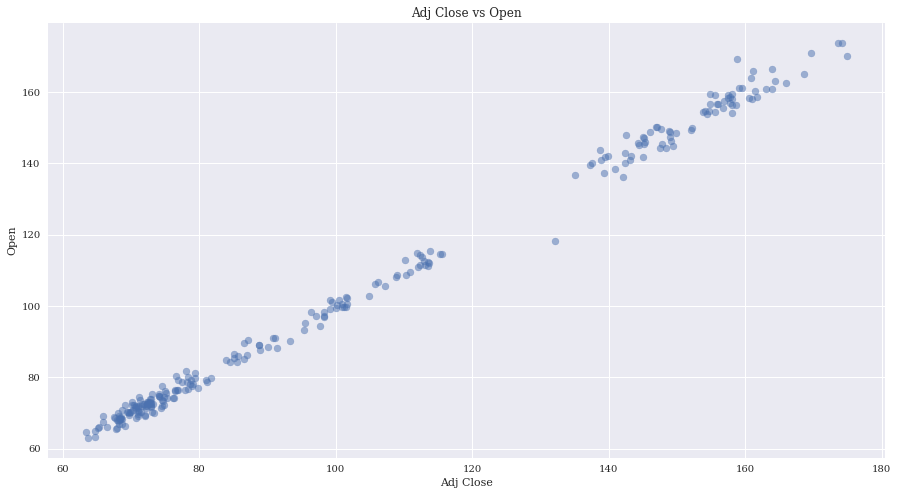

In [361]:
plt.scatter(data['Adj Close'], data['Open'], alpha=0.5)
plt.title('Adj Close vs Open')
plt.xlabel('Adj Close')
plt.ylabel('Open')
plt.show()

In [362]:
from sklearn.linear_model import LinearRegression

In [363]:
len(data)

252

**Linear Regression Model**

In [364]:
# Computes the relation between 'Adj Close' values 
# and corresponding 'Open' values
X = np.array(data['Open']).reshape(252,-1)
y = np.array(data['Adj Close'])
LR = LinearRegression().fit(X, y)


In [365]:
# Computes LR score 
LR.score(X, y)

0.996151105600662

In [366]:
LR.coef_

array([0.99907416])

In [367]:
LR.intercept_

0.2216126249287953

In [368]:
y_pred=LR.predict(X)

In [369]:
y_pred

array([ 67.08964638,  69.54736783,  71.58548012,  74.20305742,
        81.82599029,  80.06761777,  79.29833466,  80.56715485,
        73.32386716,  74.08316553,  70.17678255,  77.59990358,
        74.49278194,  73.46373755,  75.87150928,  74.58270261,
        76.27114094,  74.08316553,  72.36475697,  73.8134195 ,
        72.18492362,  72.0850172 ,  74.56272512,  73.24393923,
        74.93237757,  73.30388968,  72.96420047,  72.34477848,
        69.29759928,  73.21396901,  72.38474245,  72.02507575,
        72.12498117,  72.01508301,  70.53644925,  70.54644199,
        72.57456154,  71.56550263,  72.43469216,  70.49648528,
        70.41656534,  70.24671674,  68.61822885,  68.53830092,
        69.29759928,  68.00879261,  68.83802617,  70.46651506,
        69.65726698,  72.67446796,  74.93237757,  75.4918561 ,
        72.66448221,  71.89519111,  73.0441274 ,  72.61452551,
        72.74440215,  70.54644199,  69.14773716,  69.38751996,
        71.70537201,  71.04597907,  70.72627634,  71.74

**Monte Carlo method**

In [370]:
# Evaluation of Elementary Probability Theory, which computes the outcome that could happen
data['Returns'] = data['Adj Close'].pct_change()
data['Returns'] = data['Returns'].dropna()
df = data.dropna()

In [371]:
values = []
S = df['Returns'][-1] #Starting stock price 
T = 252 #Number of trading days
mu = df['Returns'].mean() #Mean
sigma = df['Returns'].std()*math.sqrt(252) #Volatility

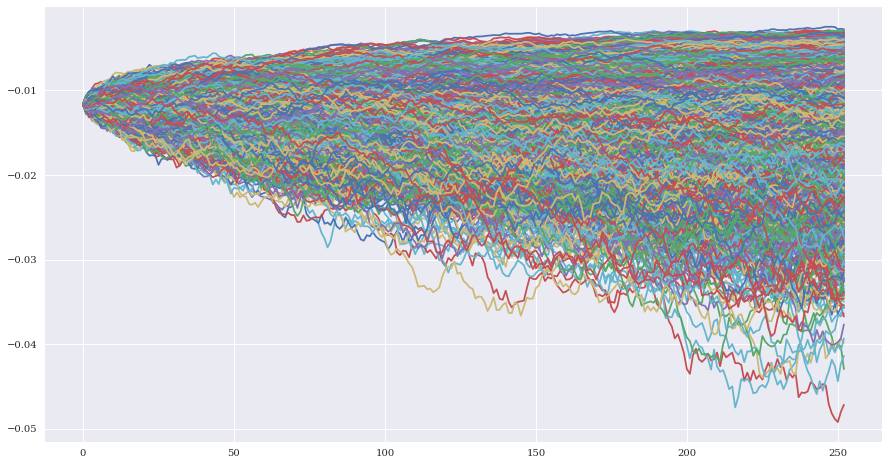

In [372]:
for i in range(10000):
    # Create list of daily returns using random normal distribution
    daily_returns=np.random.normal(mu/T,sigma/math.sqrt(T),T)+1
    
    # Set starting price and create price series generated by above random daily returns
    price_list = [S]
    
    for x in daily_returns:
        price_list.append(price_list[-1]*x)

    # Plot the data
    plt.plot(price_list)
plt.show()

**Probability Density Function**

In [373]:
values = df['Returns'][1:]
x = np.linspace(values.min(), values.max(), len(values))
loc, scale = stats.norm.fit(values)
param_density = stats.norm.pdf(x, loc=loc, scale=scale)
label = 'mean=%.4f, std=%.4f' % (loc, scale)


Text(0.5, 1.0, 'Probability Density Function')

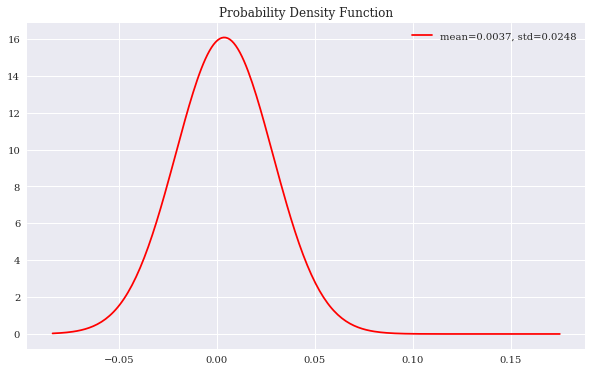

In [374]:
fig, ax = plt.subplots(figsize=(10, 6))
#x.hist(values, bins=30, normed=True)
ax.plot(x, param_density, 'r-', label=label)
ax.legend(loc='best')
ax.set_title("Probability Density Function")

**Stock Daily Returns**

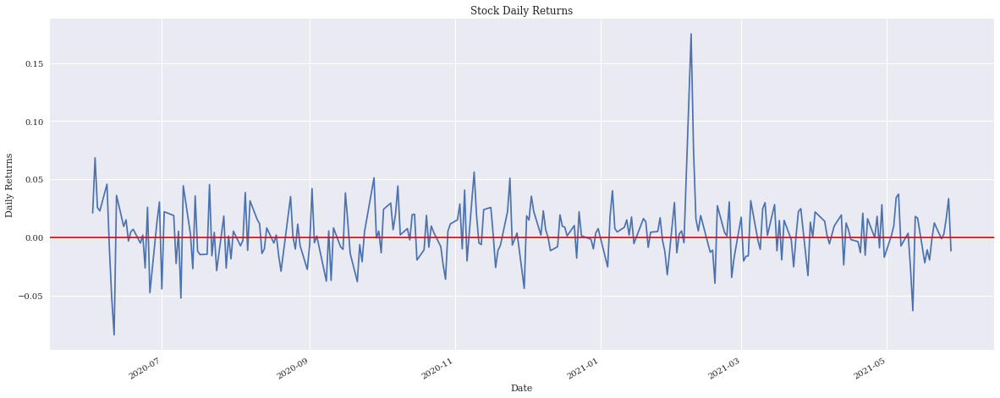

In [375]:
# Log return goes up and down during the period
df['Returns'].plot(figsize=(20, 8))
plt.title("Stock Daily Returns")
plt.axhline(0, color='red')
plt.ylabel('Daily Returns')
plt.show()

**Distribution plot**

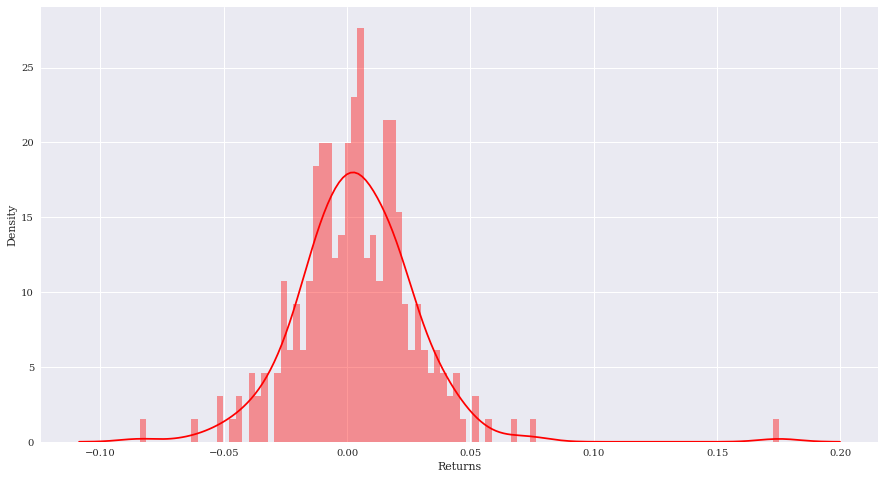

In [376]:
sns.distplot(df['Returns'].dropna(),bins=100, color='red')

**Cumulative Probability Distribution**

In [377]:
#Cumulative Probability Distribution
values = df['Returns'][1:]
x = np.linspace(values.min(), values.max(), len(values))
loc, scale = stats.norm.fit(values)
param_density = stats.norm.cdf(x, loc=loc, scale=scale)
label = 'mean=%.4f, std=%.4f' % (loc, scale)


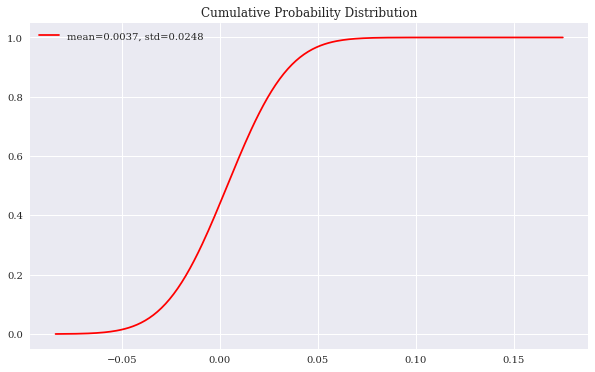

In [378]:
fig, ax = plt.subplots(figsize=(10, 6))
#ax.hist(values, bins=30, normed=True)
ax.plot(x, param_density, 'r-', label=label)
ax.legend(loc='best')
ax.set_title("Cumulative Probability Distribution")
print()

**Binomial Distribution**

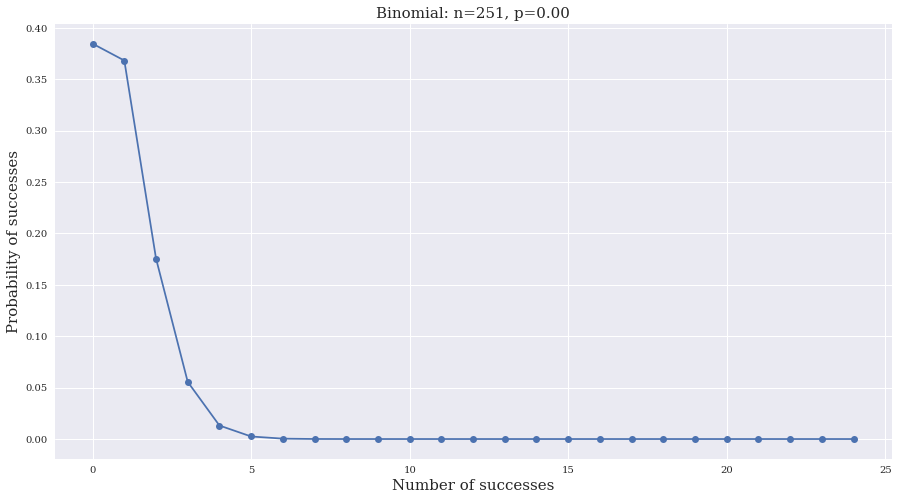

In [379]:
from scipy.stats import binom

n = len(df['Returns'])
p = df['Returns'].mean()
k = np.arange(0,25)
binomial = binom.pmf(k,n,p)

plt.plot(k, binomial, 'o-')
plt.title("Binomial: n=%i, p=%.2f" % (n,p), fontsize=15)
plt.xlabel("Number of successes", fontsize=15)
plt.ylabel("Probability of successes", fontsize=15)
plt.show()

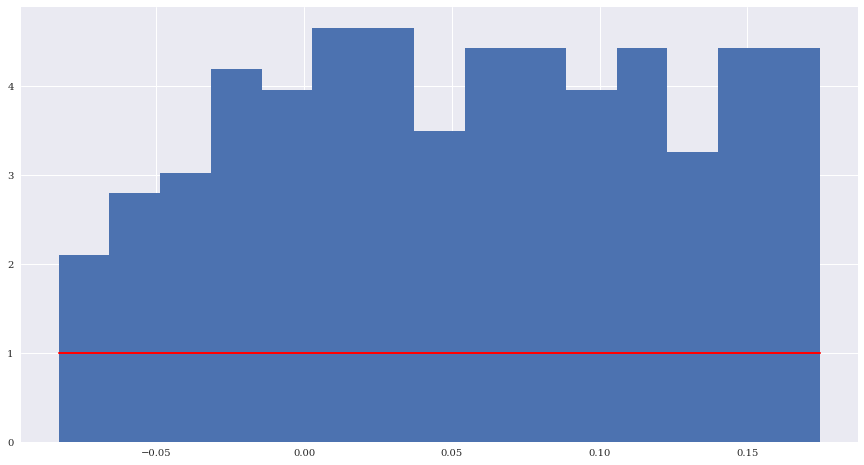

In [380]:
#Returns the minimum, maximum values for the requested axis.
import matplotlib.pyplot as plt
s = np.random.uniform(values.min(), values.max(), len(values))
count, bins, ignored = plt.hist(s, 15, density=True)
plt.plot(bins, np.ones_like(bins), linewidth=2, color='r')
plt.show()

**Binom simulation**

Mean: 0.969300
SD: 0.986841


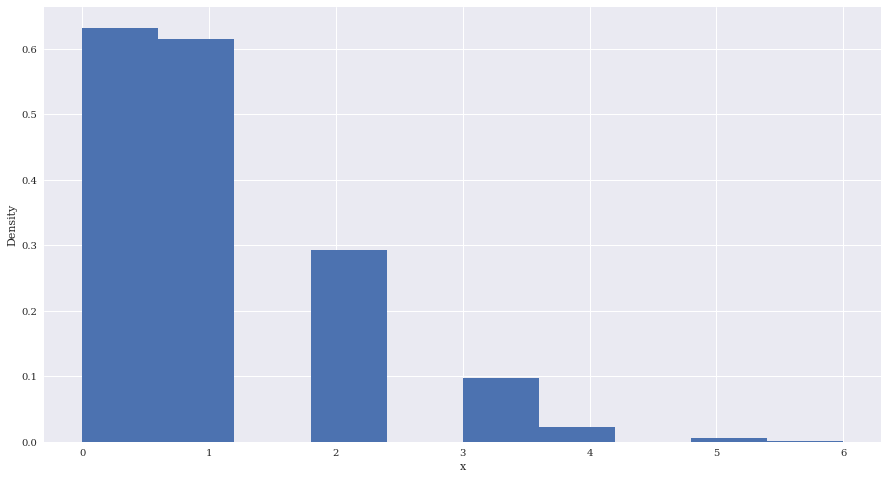

In [381]:
binom_sim = binom.rvs(n = n, p = p, size=10000)
print("Mean: %f" % np.mean(binom_sim))
print("SD: %f" % np.std(binom_sim, ddof=1))
plt.hist(binom_sim, bins = 10, density =True)
plt.xlabel("x")
plt.ylabel("Density")
plt.show()

**Poisson Distribution**

In [382]:
rate = 3 # Error Rate
n = np.arange(0,10) # Number of Trials
y = stats.poisson.pmf(n, rate)
y

array([0.04978707, 0.14936121, 0.22404181, 0.22404181, 0.16803136,
       0.10081881, 0.05040941, 0.02160403, 0.00810151, 0.0027005 ])

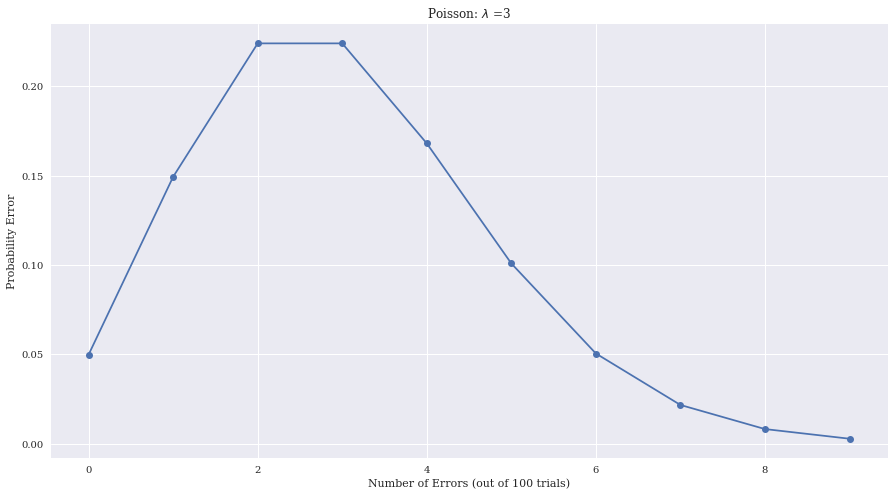

In [383]:
plt.plot(n, y, 'o-')
plt.title('Poisson: $\lambda$ =%i' % rate)
plt.ylabel('Probability Error')
plt.xlabel('Number of Errors (out of 100 trials)')
plt.show()

**Simulating Poisson Random Variables**

Mean: 3.010000
Standard Deviation: 1.666636


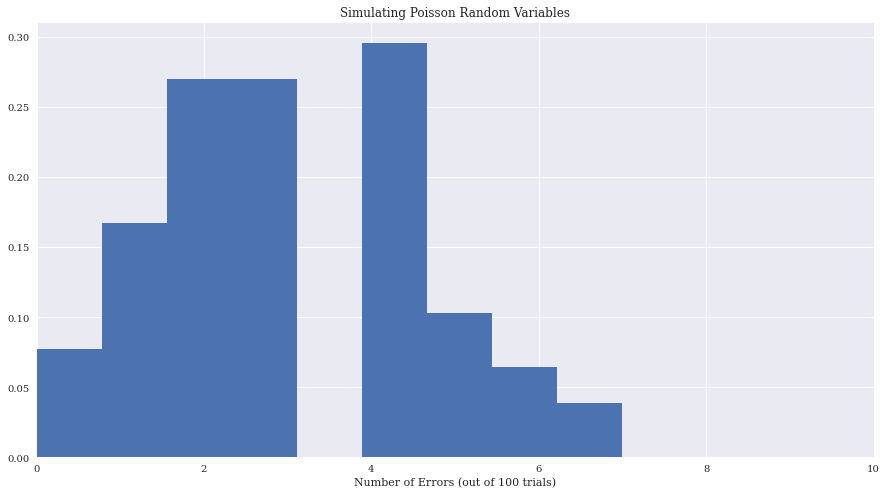

In [384]:
data = stats.poisson.rvs(mu=3, loc=0, size=100)
print("Mean: %f" % np.mean(data))
print("Standard Deviation: %f" % np.std(data, ddof=1))

plt.hist(data, bins = 9, density =True)
plt.xlim(0,10)
plt.xlabel('Number of Errors (out of 100 trials)')
plt.title('Simulating Poisson Random Variables')
plt.show()

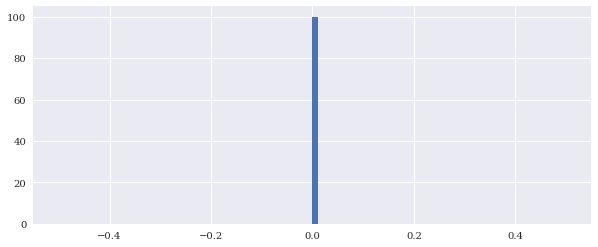

In [385]:
plt.rcParams['figure.figsize'] = 10, 4
data = np.zeros((1000))
l = plt.hist(data, bins = 100, density =True)

 **Beta Distribution**

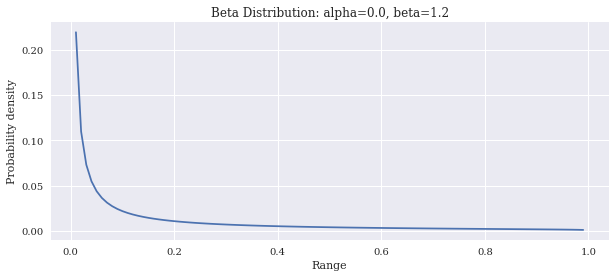

In [386]:
# Beta Distribution
alpha = alpha
beta = beta
x = np.arange(0, 1, 0.01)
y = stats.beta.pdf(x, alpha, beta)
plt.plot(x, y)
plt.title('Beta Distribution: alpha=%.1f, beta=%.1f' % (alpha,beta))
plt.xlabel('Range')
plt.ylabel('Probability density')
plt.show()

**Exponential Distribution**

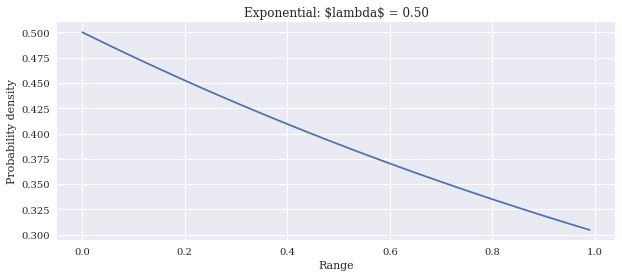

In [387]:
lambd = 0.5 # lambda
x = np.arange(0, 1, 0.01)
y = lambd * np.exp(-lambd * x)
plt.plot(x, y)
plt.title('Exponential: $lambda\$ = %.2f' % lambd)
plt.xlabel("Range")
plt.ylabel("Probability density")
plt.show()

**Lognormal Distribution**

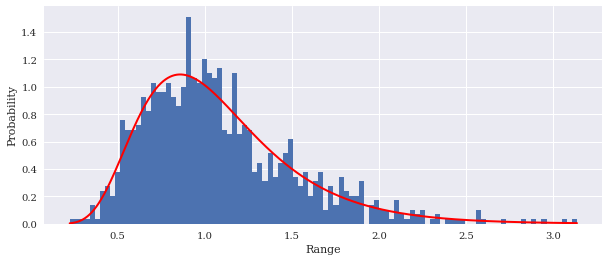

In [388]:
# Lognormal Distribution
from scipy.stats import lognorm

s = np.random.lognormal(mu, sigma, 1000)

count, bins, ignored = plt.hist(s, 100, density=True, align='mid')
x = np.linspace(min(bins), max(bins), 10000)
pdf = (np.exp(-(np.log(x) - mu)**2 / (2 * sigma**2)) / (x * sigma * np.sqrt(2 * np.pi)))

plt.plot(x, pdf, linewidth=2, color='r')
plt.xlabel('Range')
plt.ylabel('Probability')
plt.axis('tight')
plt.show()

In [389]:
# Computes Quantile 5% and 95%
print('5% quantile ', norm.ppf(0.05, mu, sigma))
# 95% quantile
print('95% quantile ', norm.ppf(0.95, mu, sigma))

5% quantile  -0.6445145521502346
95% quantile  0.6521142618878563


**Statistical Hypothesis Tests**

In [390]:
mu = df['Returns'].mean()
sigma = df['Returns'].std(ddof=1)
n = df['Returns'].shape[0]

# if sample size n is large enough, we can use z-distribution, instead of t-distribtuion
# mu = 0 under the null hypothesis
zhat = (mu - 0)/(sigma/n**0.5)
print(zhat)

2.4246313977016154


In [391]:
# Sets decision criteria and confidence level
alpha = 0.05
zleft = norm.ppf(alpha/2, 0, 1)
zright = -zleft  # z-distribution is symmetric 
print(zleft, zright)

-1.9599639845400545 1.9599639845400545


**Decision to reject H0 or not**

In [392]:
# Decision to reject H0 or not
print('At significant level of {}, shall we reject: {}'.format(alpha, zhat>zright or zhat<zleft))

At significant level of 0.05, shall we reject: True


**One Tail Test**

In [393]:
# Test one tail
mu = df['Returns'].mean()
sigma = df['Returns'].std(ddof=1)
n = df['Returns'].shape[0]

# if sample size n is large enough, we can use z-distribution, instead of t-distribtuion
# mu = 0 under the null hypothesis
zhat = (mu - 0)/(sigma/n**0.5)
print(zhat)

2.4246313977016154


In [394]:
print('At significant level of {}, shall we reject: {}'.format(alpha, zhat>zright))

At significant level of 0.05, shall we reject: True


**Test for p-value**

In [395]:
# Test for p-value
p_value = 1 - norm.cdf(zhat, 0, 1)
print(p_value)

0.007661968383051554


In [396]:
print('At significant level of {}, shall we reject: {}'.format(alpha, p_value < alpha))

At significant level of 0.05, shall we reject: True


**Shapiro-Wilk Test**

In [397]:
# Shapiro-Wilk Test
from scipy.stats import shapiro
import scipy as sp
W_test, p_value = shapiro(df['Returns'])

In [398]:
# Confidence level is 95%, that is, alpha=0.05
print('Shapiro-Wilk Test')
print('-'*40)

alpha = 0.05
if p_value < alpha:  # null hypothesis: x comes from a normal distribution
    print("H0: the sample has a Gaussian distribution.")
    print("The null hypothesis can be rejected")
else:
    print("H1: the sample does not have a Gaussian distribution.")
    print("The null hypothesis cannot be rejected")

Shapiro-Wilk Test
----------------------------------------
H0: the sample has a Gaussian distribution.
The null hypothesis can be rejected


**Box-Cox Power Transformation**

In [399]:
from scipy.stats import boxcox
df['boxcox'], lam = boxcox(df['Adj Close'])
print('Lambda: %f' % lam)

Lambda: -0.968355


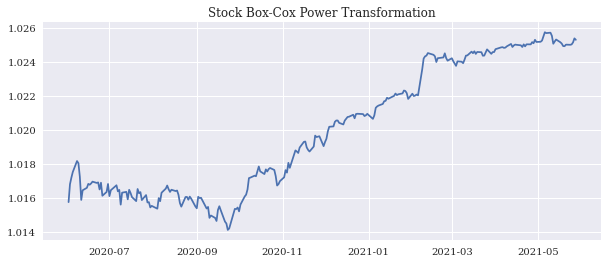

In [400]:
# Plot line
plt.title('Stock Box-Cox Power Transformation')
plt.plot(df['boxcox'])
plt.show()

**Stock Box-Cox Power Transformation histogram**

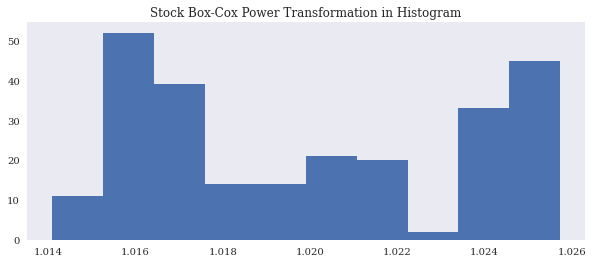

In [401]:
plt.title('Stock Box-Cox Power Transformation in Histogram')
plt.hist(df['boxcox'])
plt.grid()
plt.show()

**Mood's Test**

In [402]:
from scipy.stats import mood
stat, p_value = mood(df['Open'], df['Adj Close'])

In [403]:
print('-'*40)
print('Statistics=%.3f, p=%.3f' % (stat, p_value))
# interpret
alpha = 0.05
if p_value > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')

----------------------------------------
Statistics=-0.010, p=0.992
Same distributions (fail to reject H0)


**Mood’s median test**

In [404]:
from scipy.stats import median_test
stat, p_value, med, tbl = median_test(df['Open'], df['Adj Close'], df['Volume'])

In [405]:
print('Mood’s median test')
print('-'*40)
print('Statistics=%.3f, p=%.3f' % (stat, p_value))

# interpret
alpha = 0.05
if p_value > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')

Mood’s median test
----------------------------------------
Statistics=377.509, p=0.000
Different distributions (reject H0)


**Mood’s median test with lambda**

In [406]:
stat, p_value, med, tbl = median_test(df['Open'], df['Adj Close'], df['Volume'],lambda_="log-likelihood")
print('Mood’s median test with lambda')
print('-'*40)
print('Statistics=%.3f, p=%.3f' % (stat, p_value))

# interpret
alpha = 0.05
if p_value > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')

Mood’s median test with lambda
----------------------------------------
Statistics=480.406, p=0.000
Different distributions (reject H0)


**Kolmogorov-Smirnov Test**

In [407]:
from scipy.stats import ks_2samp
stat, p_value = ks_2samp(df['Open'], df['Adj Close'])
print('Kolmogorov-Smirnov Test')
print('-'*40)
print('Statistics=%.3f, p=%.3f' % (stat, p_value))
# interpret
alpha = 0.05
if p_value > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')

Kolmogorov-Smirnov Test
----------------------------------------
Statistics=0.024, p=1.000
Same distributions (fail to reject H0)


#Modelling the data

**Imports**

In [745]:
import fix_yahoo_finance as yf
yf.pdr_override()
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import cross_val_score 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
import matplotlib.pyplot as plt 
import seaborn as sns
plt.rc("font", size=14)
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
import matplotlib.pyplot as plt
import numpy as np # Linear algebra
import pandas as pd
from sklearn.linear_model import LinearRegression
import math
from pylab import plt, mpl
np.random.seed(100)
plt.style.use('seaborn')
mpl.rcParams['savefig.dpi'] = 300
mpl.rcParams['font.family'] = 'serif'

In [746]:
url = 'http://hilpisch.com/aiif_eikon_eod_data.csv'

In [747]:
raw = pd.read_csv(url, index_col=0, parse_dates=True)['EUR=']

In [748]:
raw.head()

Date
2010-01-01    1.4323
2010-01-04    1.4411
2010-01-05    1.4368
2010-01-06    1.4412
2010-01-07    1.4318
Name: EUR=, dtype: float64

In [749]:
raw.tail()

Date
2019-12-26    1.1096
2019-12-27    1.1175
2019-12-30    1.1197
2019-12-31    1.1210
2020-01-01    1.1210
Name: EUR=, dtype: float64

In [750]:
l = raw.resample('1M').last()

In [751]:
l.tail()

Date
2019-09-30    1.0898
2019-10-31    1.1150
2019-11-30    1.1015
2019-12-31    1.1210
2020-01-31    1.1210
Freq: M, Name: EUR=, dtype: float64

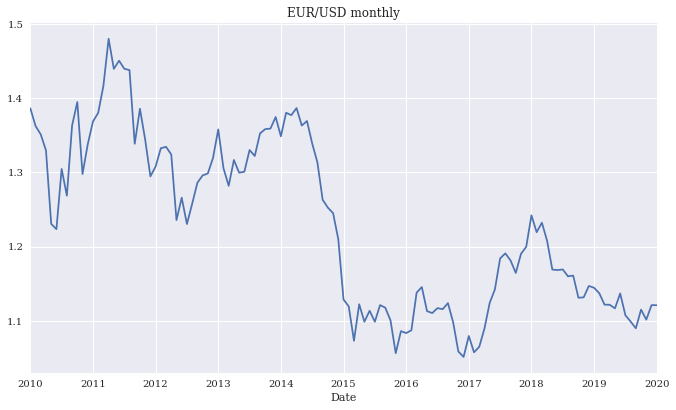

In [752]:
l.plot(figsize=(10, 6), title='EUR/USD monthly');

In [753]:
l = l.values
l -= l.mean()

In [754]:
print(l)

[        0.16         0.13         0.12         0.10         0.00
        -0.01         0.08         0.04         0.13         0.17
         0.07         0.11         0.14         0.15         0.19
         0.25         0.21         0.22         0.21         0.21
         0.11         0.16         0.11         0.07         0.08
         0.10         0.11         0.09         0.01         0.04
         0.00         0.03         0.06         0.07         0.07
         0.09         0.13         0.08         0.05         0.09
         0.07         0.07         0.10         0.09         0.12
         0.13         0.13         0.15         0.12         0.15
         0.15         0.16         0.13         0.14         0.11
         0.08         0.03         0.02         0.02        -0.02
        -0.10        -0.11        -0.16        -0.11        -0.13
        -0.12        -0.13        -0.11        -0.11        -0.13
        -0.17        -0.14        -0.15        -0.14        -0.09
        -0

In [755]:
f = np.linspace(-2, 2, len(l))

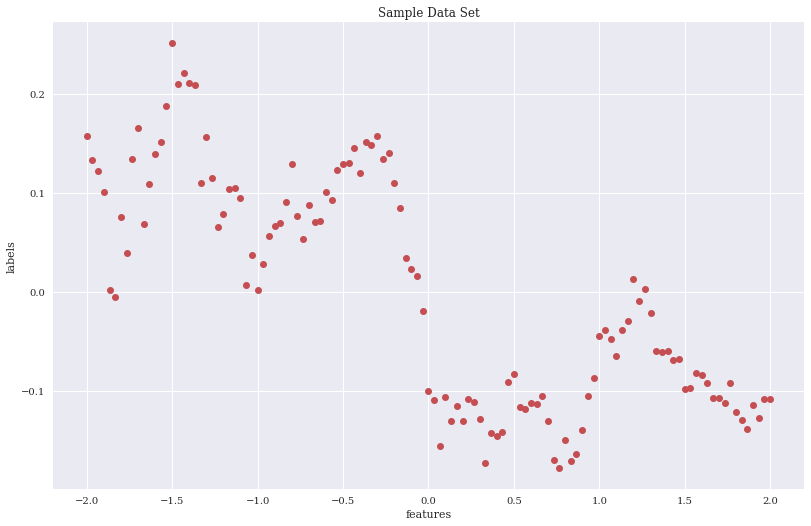

In [756]:
plt.figure(figsize=(12, 8))
plt.plot(f, l, 'ro')
plt.title('Sample Data Set')
plt.xlabel('features')
plt.ylabel('labels');

**Success**

**Steps to find the MSE**

Step 1:
Find the equation for the regression line.

\begin{equation*}   \hat{Y}_i = \hat{\beta}_0 + \hat{\beta}_1 X_i + \hat{\epsilon}_i   \end{equation*} 

Step 2: Insert X values in the equation found in step 1 in order to get the respective Y values i.e.

\begin{equation*} \hat{Y}_i \end{equation*}  



Step 3: Now subtract the new Y values (i.e. \hat{Y}_i) from the original Y values. Thus, found values are the error terms. It is also known as the vertical distance of the given point from the regression line.

 \begin{equation*}  Y_i - \hat{Y}_i  \end{equation*} 



Step 4: Square the errors found in step 3.
\begin{equation*}  {(Y_i - \hat{Y}_i)}^2  \end{equation*} 


Step 5: Sum up all the squares.
\begin{equation*}  \sum_{i=1}^{N}(Y_i - \hat{Y}_i)^2  \end{equation*} 



Step 6: Divide the value found in step 5 by the total number of observations.
\begin{equation*}  MSE = \frac{1}{N}\sum_{i=1}^{N}(Y_i - \hat{Y}_i)^2  \end{equation*} 

In [757]:
def MSE(l, p):
    return np.mean((l - p) ** 2)

In [758]:
#Least squares polynomial fit.
#Fit a polynomial p(x) = p[0] * x**deg + ... + p[deg] of degree deg
#to points (x, y). Returns a vector of coefficients p that minimises
#the squared error in the order deg, deg-1, ... 0.

reg = np.polyfit(f, l, deg=5)
reg

array([       -0.02,        -0.01,         0.11,         0.06,
              -0.21,        -0.03])

**Evaluate a polynomial at specific values**

In [759]:
''' If p is of length N, this function returns the value:

    p[0]*x**(N-1) + p[1]*x**(N-2) + ... + p[N-2]*x + p[N-1]

If x is a sequence, then p(x) is returned for each element of x.
If x is another polynomial then the composite polynomial p(x(t))
is returned. '''

p = np.polyval(reg, f)

In [760]:
# Finds MSE
MSE(l, p)

0.003416642295737103

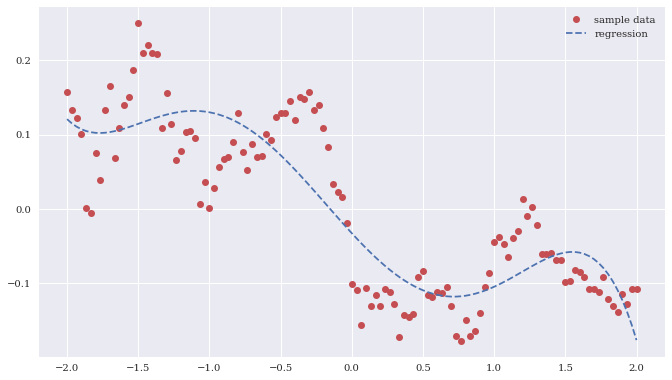

In [761]:
plt.figure(figsize=(10, 6))
plt.plot(f, l, 'ro', label='sample data')
plt.plot(f, p, '--', label='regression')
plt.legend();

**Find best MSE**

In [762]:
# Finds best MSE
%%time
for i in range(10, len(f) + 1, 20):
    reg = np.polyfit(f[:i], l[:i], deg=3)
    p = np.polyval(reg, f)
    mse = MSE(l, p)
    print(f'{i:3d} | MSE={mse}')

 10 | MSE=248628.10681655593
 30 | MSE=731.9382249304574
 50 | MSE=12.236088505004478
 70 | MSE=0.7410590619743306
 90 | MSE=0.005743061730409341
110 | MSE=0.0064928009395555765
CPU times: user 4.28 ms, sys: 0 ns, total: 4.28 ms
Wall time: 4.07 ms


**Tensorflow**

In [763]:
import logging
import tensorflow as tf
tf.random.set_seed(100)
tf.get_logger().setLevel(logging.ERROR)

In [764]:
from keras.layers import Dense
from keras.models import Sequential

In [765]:
model = Sequential()  
model.add(Dense(256, activation='relu', input_dim=1))
model.add(Dense(1, activation='linear'))
model.compile(loss='mse', optimizer='rmsprop')

In [766]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19 (Dense)             (None, 256)               512       
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 257       
Total params: 769
Trainable params: 769
Non-trainable params: 0
_________________________________________________________________


In [767]:
%time h = model.fit(f, l, epochs=1500, verbose=False)

CPU times: user 8.57 s, sys: 451 ms, total: 9.02 s
Wall time: 7 s


In [768]:
print(h.history)

{'loss': [0.02086731605231762, 0.005184106063097715, 0.003830742323771119, 0.003380037611350417, 0.002955733798444271, 0.0028274075593799353, 0.0028373831883072853, 0.0027542319148778915, 0.00270715425722301, 0.0028220340609550476, 0.0031432900577783585, 0.002721589058637619, 0.0030273154843598604, 0.0030697390902787447, 0.002635749988257885, 0.002597843762487173, 0.002597975777462125, 0.002661885693669319, 0.0032938956283032894, 0.0026760792825371027, 0.0026012547314167023, 0.0025180596858263016, 0.0026687972713261843, 0.003235810436308384, 0.002625141991302371, 0.0030611329711973667, 0.0027095950208604336, 0.002709247637540102, 0.0026093791238963604, 0.0027145198546350002, 0.0025181910023093224, 0.0027423875872045755, 0.002696880605071783, 0.0026889790315181017, 0.002574676414951682, 0.0028748095501214266, 0.0028770046774297953, 0.0024723338428884745, 0.0028901395853608847, 0.0025074530858546495, 0.002964375540614128, 0.0024859283585101366, 0.0024317947681993246, 0.003091455437242984

In [769]:
p = model.predict(f).flatten()

In [770]:
p

array([        0.09,         0.09,         0.09,         0.10,
               0.10,         0.10,         0.11,         0.11,
               0.12,         0.12,         0.12,         0.13,
               0.13,         0.13,         0.14,         0.14,
               0.15,         0.14,         0.14,         0.13,
               0.12,         0.12,         0.11,         0.11,
               0.10,         0.10,         0.09,         0.08,
               0.08,         0.07,         0.07,         0.06,
               0.07,         0.07,         0.07,         0.08,
               0.08,         0.08,         0.09,         0.09,
               0.09,         0.10,         0.10,         0.10,
               0.11,         0.11,         0.11,         0.12,
               0.12,         0.12,         0.13,         0.13,
               0.12,         0.11,         0.09,         0.06,
               0.04,         0.01,        -0.01,        -0.03,
              -0.06,        -0.08,        -0.11,       

In [771]:
MSE(l, p)

0.001175657772820758

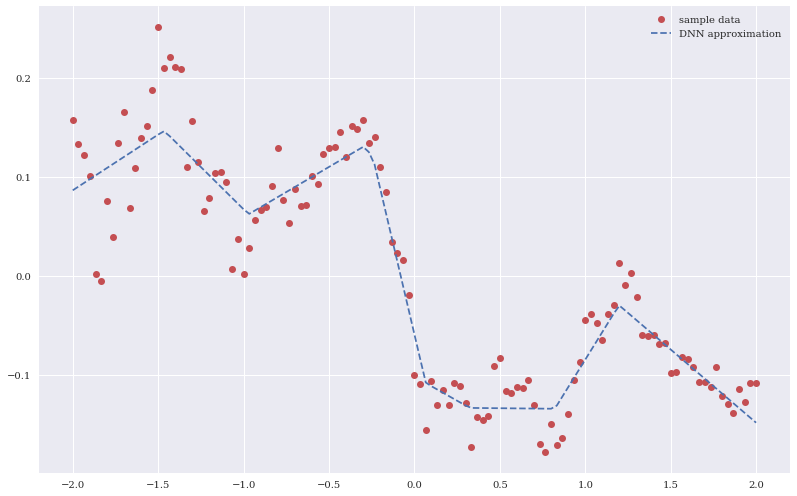

In [772]:
plt.figure(figsize=(12, 8))
plt.plot(f, l, 'ro', label='sample data')
plt.plot(f, p, '--', label='DNN approximation')
plt.legend();

In [773]:
import pandas as pd

In [774]:
res = pd.DataFrame(h.history)

In [775]:
res.tail()

,loss
1495,0.001214
1496,0.001451
1497,0.001613
1498,0.001410
1499,0.001682


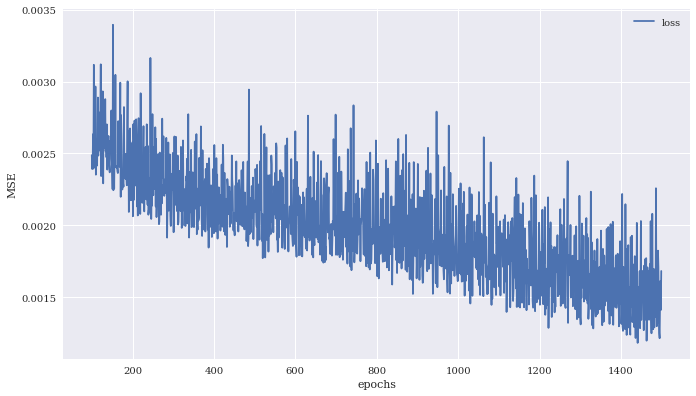

In [776]:
res.iloc[100:].plot(figsize=(10, 6))
plt.ylabel('MSE')
plt.xlabel('epochs');

**Capacity**

In [777]:
reg = {}
for d in range(1, 12, 2):
    reg[d] = np.polyfit(f, l, deg=d)
    p = np.polyval(reg[d], f)
    mse = MSE(l, p)
    print(f'{d:2d} | MSE={mse}')

 1 | MSE=0.005322474034260403
 3 | MSE=0.004353110724143185
 5 | MSE=0.003416642295737103
 7 | MSE=0.002738950177235401
 9 | MSE=0.0014119616263308346
11 | MSE=0.0012651237868752398


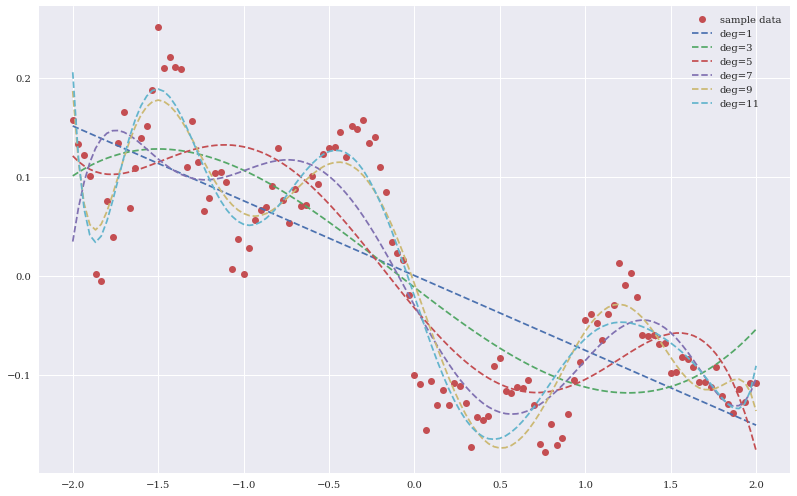

In [778]:
plt.figure(figsize=(12, 8))
plt.plot(f, l, 'ro', label='sample data')
for d in reg:
    p = np.polyval(reg[d], f)
    plt.plot(f, p, '--', label=f'deg={d}')
plt.legend();

**DNN approximation**

In [779]:
def create_dnn_model(hl=1, hu=256):
    ''' Function to create Keras DNN model.
    
    Parameters
    ==========
    hl: int
        number of hidden layers
    hu: int
        number of hidden units (per layer)
    '''
    model = Sequential()
    for _ in range(hl):
        model.add(Dense(hu, activation='relu', input_dim=1))
    model.add(Dense(1, activation='linear'))
    model.compile(loss='mse', optimizer='rmsprop')
    return model

In [780]:
model = create_dnn_model(3)

In [781]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_21 (Dense)             (None, 256)               512       
_________________________________________________________________
dense_22 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_23 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_24 (Dense)             (None, 1)                 257       
Total params: 132,353
Trainable params: 132,353
Non-trainable params: 0
_________________________________________________________________


In [782]:
%time model.fit(f, l, epochs=2500, verbose=False)

CPU times: user 39.8 s, sys: 1.89 s, total: 41.7 s
Wall time: 27.2 s


In [783]:
p = model.predict(f).flatten()

In [784]:
MSE(l, p)

0.00043048854841060363

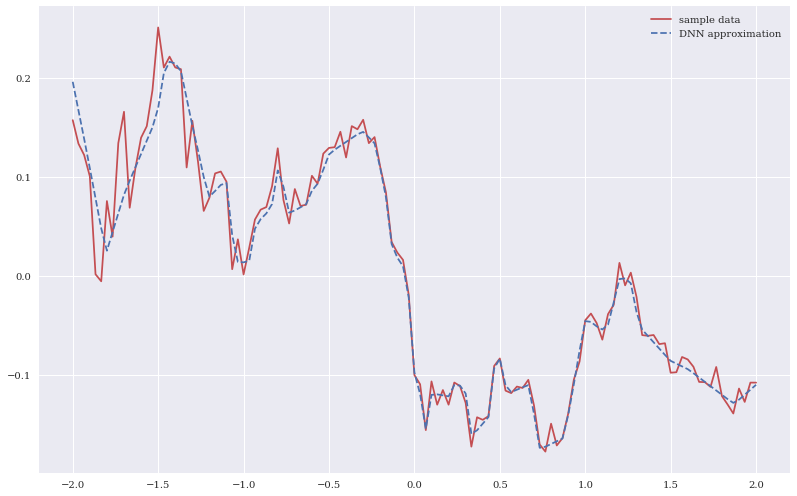

In [785]:
plt.figure(figsize=(12, 8))
plt.plot(f, l, 'r', label='sample data')
plt.plot(f, p, '--', label='DNN approximation')
plt.legend();

**Evaluation**

In [786]:
te = int(0.25 * len(f))
va = int(0.25 * len(f))

In [787]:
np.random.seed(100)
ind = np.arange(len(f))
np.random.shuffle(ind)

In [788]:
ind_te = np.sort(ind[:te])
ind_va = np.sort(ind[te:te + va])
ind_tr = np.sort(ind[te + va:])

In [789]:
f_te = f[ind_te]
f_va = f[ind_va]
f_tr = f[ind_tr]

In [790]:
l_te = l[ind_te]
l_va = l[ind_va]
l_tr = l[ind_tr]

In [791]:
reg = {}
mse = {}
for d in range(1, 22, 4):
    reg[d] = np.polyfit(f_tr, l_tr, deg=d)
    p = np.polyval(reg[d], f_tr)
    mse_tr = MSE(l_tr, p)
    p = np.polyval(reg[d], f_va)
    mse_va = MSE(l_va, p)
    mse[d] = (mse_tr, mse_va)
    print(f'{d:2d} | MSE_tr={mse_tr:7.5f} | MSE_va={mse_va:7.5f}')

 1 | MSE_tr=0.00574 | MSE_va=0.00492
 5 | MSE_tr=0.00375 | MSE_va=0.00273
 9 | MSE_tr=0.00132 | MSE_va=0.00243
13 | MSE_tr=0.00094 | MSE_va=0.00183
17 | MSE_tr=0.00060 | MSE_va=0.00153
21 | MSE_tr=0.00046 | MSE_va=0.00837


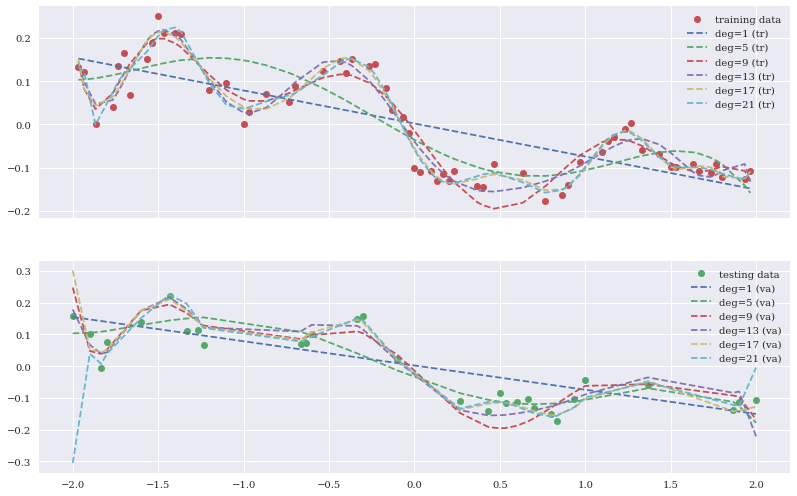

In [792]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
ax[0].plot(f_tr, l_tr, 'ro', label='training data')
ax[1].plot(f_va, l_va, 'go', label='testing data')
for d in reg:
    p = np.polyval(reg[d], f_tr)
    ax[0].plot(f_tr, p, '--', label=f'deg={d} (tr)')
    p = np.polyval(reg[d], f_va)
    plt.plot(f_va, p, '--', label=f'deg={d} (va)')
ax[0].legend()
ax[1].legend();

**DNN prediction**

In [793]:
from keras.callbacks import EarlyStopping

In [794]:
model = create_dnn_model(2, 256)

In [795]:
callbacks = [EarlyStopping(monitor='loss',
                           patience=100,
                          restore_best_weights=True)]

In [796]:
%%time
h = model.fit(f_tr, l_tr, epochs=3000, verbose=False,
          validation_data=(f_va, l_va),
          callbacks=callbacks)

CPU times: user 26.6 s, sys: 880 ms, total: 27.5 s
Wall time: 25.5 s


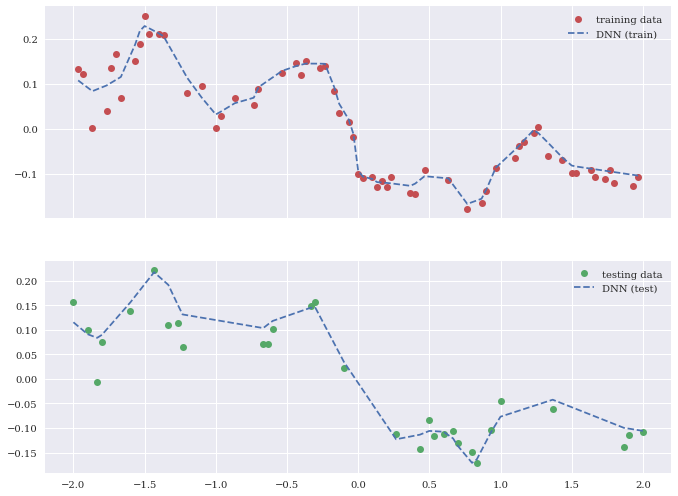

In [797]:
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(10, 8))
ax[0].plot(f_tr, l_tr, 'ro', label='training data')
p = model.predict(f_tr)
ax[0].plot(f_tr, p, '--', label=f'DNN (train)')
ax[0].legend()
ax[1].plot(f_va, l_va, 'go', label='testing data')
p = model.predict(f_va)
ax[1].plot(f_va, p, '--', label=f'DNN (test)')
ax[1].legend();

In [798]:
res = pd.DataFrame(h.history)

In [799]:
res.tail()

,loss,val_loss
1117,0.000706,0.001122
1118,0.000577,0.001058
1119,0.000594,0.000841
1120,0.000586,0.000710
1121,0.000523,0.000992


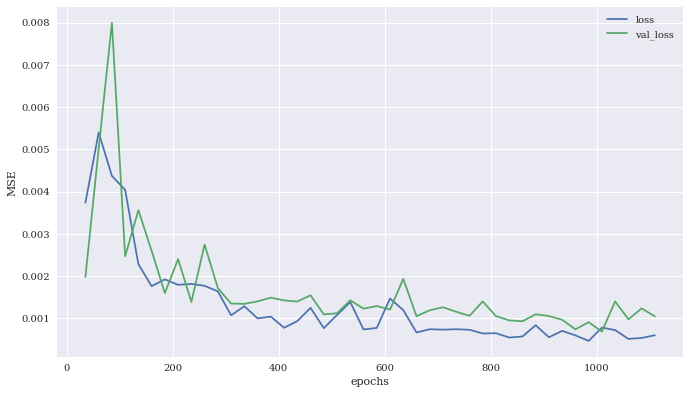

In [800]:
res.iloc[35::25].plot(figsize=(10, 6))
plt.ylabel('MSE')
plt.xlabel('epochs');

In [801]:
p_ols = np.polyval(reg[5], f_te)
p_dnn = model.predict(f_te).flatten()

In [802]:
MSE(l_te, p_ols)

0.00389603467710283

In [803]:
MSE(l_te, p_dnn)

0.000618467451649591

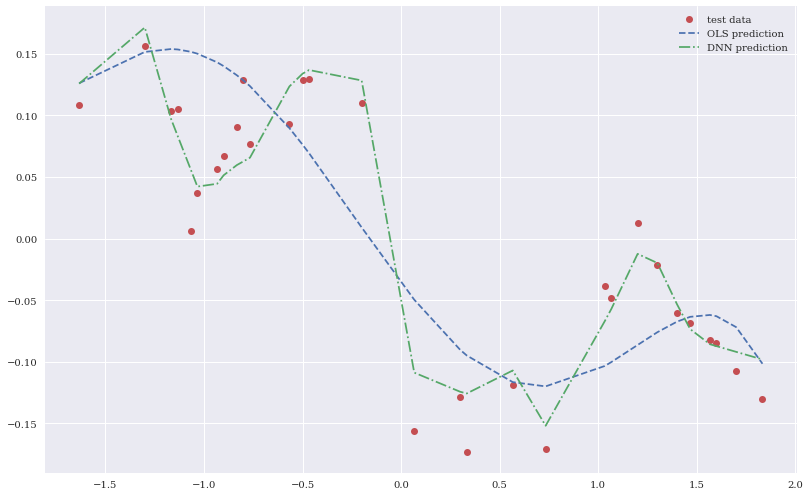

In [804]:
plt.figure(figsize=(12, 8))
plt.plot(f_te, l_te, 'ro', label='test data')
plt.plot(f_te, p_ols, '--', label='OLS prediction')
plt.plot(f_te, p_dnn, '-.', label='DNN prediction');
plt.legend();

**Bias & Variance**

In [805]:
f_tr = f[:20:2]
l_tr = l[:20:2]

In [806]:
f_va = f[1:20:2]
l_va = l[1:20:2]

In [807]:
reg_b = np.polyfit(f_tr, l_tr, deg=1)

In [808]:
reg_v = np.polyfit(f_tr, l_tr, deg=9, full=True)[0]

In [809]:
f_ = np.linspace(f_tr.min(), f_va.max(), 75)

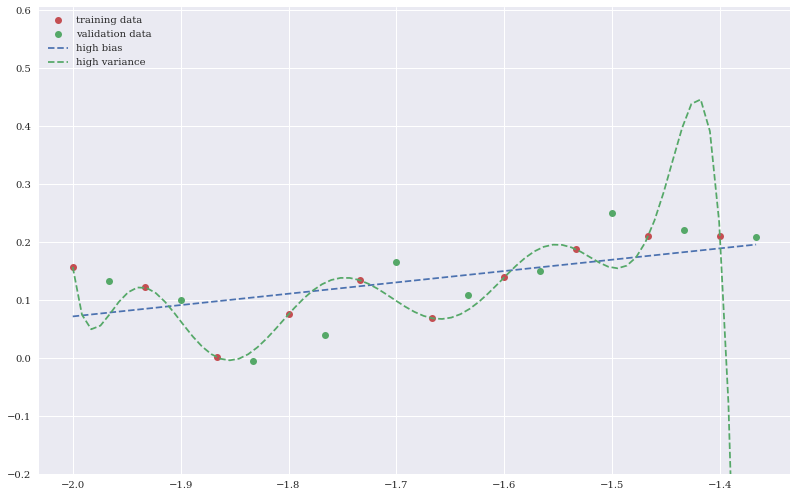

In [810]:
plt.figure(figsize=(12, 8))
plt.plot(f_tr, l_tr, 'ro', label='training data')
plt.plot(f_va, l_va, 'go', label='validation data')
plt.plot(f_, np.polyval(reg_b, f_), '--', label='high bias')
plt.plot(f_, np.polyval(reg_v, f_), '--', label='high variance')
plt.ylim(-0.2)
plt.legend(loc=2);

In [811]:
from sklearn.metrics import r2_score

In [812]:
def evaluate(reg, f, l):
    p = np.polyval(reg, f)
    bias = np.abs(l - p).mean()
    var = p.var()
    msg = f'MSE={MSE(l, p):.4f} | R2={r2_score(l, p):9.4f} | '
    msg += f'bias={bias:.4f} | var={var:.4f}'
    print(msg)

In [813]:
evaluate(reg_b, f_tr, l_tr)

MSE=0.0026 | R2=   0.3484 | bias=0.0423 | var=0.0014


In [814]:
evaluate(reg_v, f_tr, l_tr)

MSE=0.0000 | R2=   1.0000 | bias=0.0000 | var=0.0040


In [815]:
evaluate(reg_v, f_va, l_va)

MSE=0.8753 | R2=-149.2853 | bias=0.3565 | var=0.7540


**Cross-Validation**

In [816]:
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

In [817]:
def PolynomialRegression(degree=None, **kwargs):
    return make_pipeline(PolynomialFeatures(degree),
                        LinearRegression(**kwargs))

In [818]:
np.set_printoptions(suppress=True,
        formatter={'float': lambda x: f'{x:12.2f}'})

In [819]:
print('\nCross-validation scores')
print(74 * '=')
for deg in range(0, 10, 1):
    model = PolynomialRegression(deg)
    cvs = cross_val_score(model, f.reshape(-1, 1), l, cv=5)
    print(f'deg={deg} | ' + str(cvs.round(2)))


Cross-validation scores
deg=0 | [       -6.07        -7.34        -0.09        -6.32        -8.69]
deg=1 | [       -0.28        -1.40         0.16        -1.66        -4.62]
deg=2 | [       -3.48        -2.45         0.19        -1.57       -12.94]
deg=3 | [       -0.00        -1.24         0.32        -0.48       -43.62]
deg=4 | [     -222.81        -2.88         0.37        -0.32      -496.61]
deg=5 | [     -143.67        -5.85         0.49         0.12     -1241.04]
deg=6 | [    -4038.96       -14.71         0.49        -0.33      -317.32]
deg=7 | [    -9937.83       -13.98         0.64         0.22    -18725.61]
deg=8 | [    -3514.36       -11.22        -0.15        -6.29   -298744.18]
deg=9 | [    -7454.15        -0.91         0.15        -0.41    -13580.75]


In [820]:
np.random.seed(100)
tf.random.set_seed(100)
from keras.wrappers.scikit_learn import KerasRegressor

In [821]:
model = KerasRegressor(build_fn=create_dnn_model,
                      verbose=False, epochs=1000,
                      hl=1, hu=36)

In [822]:
%time cross_val_score(model, f, l, cv=5)

CPU times: user 25.8 s, sys: 1.56 s, total: 27.4 s
Wall time: 25.4 s


array([       -0.02,        -0.01,        -0.00,        -0.00,
              -0.08])

**NetworkX to study graphs and networks**

In [823]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

# fix_yahoo_finance is used to fetch data 
import fix_yahoo_finance as yf
yf.pdr_override()

In [824]:
stock_name = 'AMD'
start = '2020-06-21' 
end = '2021-06-21'
dataset = yf.download(stock_name, start, end)
dataset = dataset.reset_index()

[*********************100%***********************]  1 of 1 downloaded


In [825]:
dataset.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2020-06-22,54.669998,55.169998,53.740002,54.759998,54.759998,44704800
1,2020-06-23,55.049999,55.369999,53.869999,53.990002,53.990002,48089000
2,2020-06-24,53.939999,54.740002,51.919998,52.389999,52.389999,53535500
3,2020-06-25,52.560001,52.700001,50.540001,51.930000,51.930000,51129600
4,2020-06-26,51.849998,51.950001,49.450001,50.099998,50.099998,65485700


In [826]:
dataset['Increase_Decrease'] = np.where(dataset['Volume'].shift(-1) > dataset['Volume'],1,0)
dataset['Buy_Sell_on_Open'] = np.where(dataset['Open'].shift(-1) > dataset['Open'],1,0)
dataset['Buy_Sell'] = np.where(dataset['Adj Close'].shift(-1) > dataset['Adj Close'],1,0)
dataset['Open_Close'] = (dataset['Open'] - dataset['Adj Close'])/dataset['Open']
dataset['High_Low'] = (dataset['High'] - dataset['Low'])/dataset['Low']
dataset['Returns'] = dataset['Adj Close'].pct_change()
dataset = dataset.dropna()

In [827]:
dataset['Returns_O'] = dataset['Open'].pct_change()
dataset['Returns_H'] = dataset['High'].pct_change()
dataset['Returns_L'] = dataset['Low'].pct_change()
dataset['Returns_V'] = dataset['Volume'].pct_change()
dataset = dataset.dropna()

In [828]:
import networkx as nx

In [829]:

data = dataset[['Open', 'High', 'Low', 'Adj Close']]
G = nx.cycle_graph(data)
A = nx.adjacency_matrix(G)
print(A.todense())

[[0 1 0 1]
 [1 0 1 0]
 [0 1 0 1]
 [1 0 1 0]]


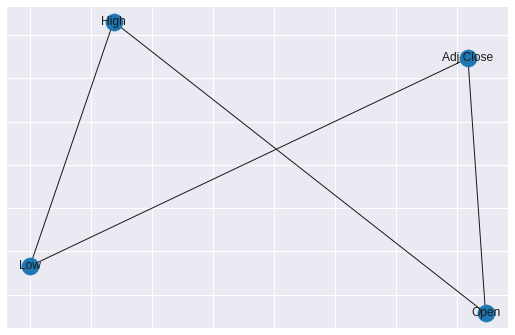

In [830]:
nx.draw_networkx(G)
plt.show()

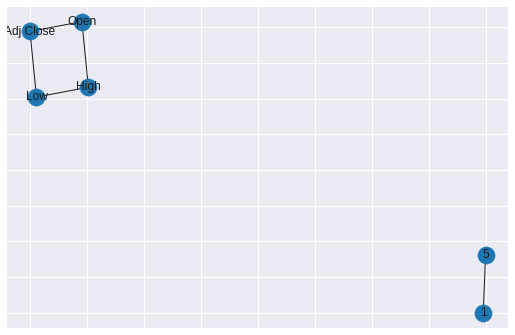

In [831]:
G.add_edge(1,5)
nx.draw_networkx(G)
plt.show()

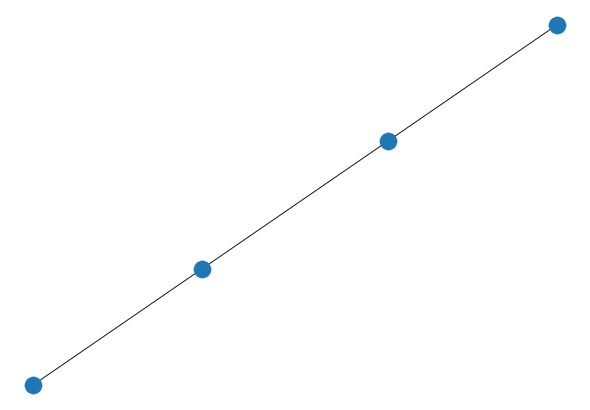

In [832]:
G = nx.path_graph(data)
nx.draw(G)
plt.show()

In [833]:
# https://medium.com/@ValeriaCortezVD/visualising-stocks-correlations-with-networkx-88f2ee25362e
cor_matrix = dataset.corr()

In [834]:

cor_matrix

,Open,High,Low,Close,Adj Close,Volume,Increase_Decrease,Buy_Sell_on_Open,Buy_Sell,Open_Close,High_Low,Returns,Returns_O,Returns_H,Returns_L,Returns_V
Open,1.000000,0.991886,0.992461,0.981588,0.981588,-0.171663,0.058437,-0.122273,-0.096294,0.151362,-0.161520,-0.132164,0.031820,-0.073020,-0.055454,-0.041202
High,0.991886,1.000000,0.991947,0.993048,0.993048,-0.111840,0.032728,-0.062074,-0.106699,0.049880,-0.094880,-0.047604,0.018887,0.002249,-0.022837,0.027911
Low,0.992461,0.991947,1.000000,0.991875,0.991875,-0.197444,0.068543,-0.052251,-0.100002,0.061307,-0.218991,-0.053694,0.041740,-0.018639,0.014570,-0.042124
Close,0.981588,0.993048,0.991875,1.000000,1.000000,-0.140658,0.036871,0.010364,-0.120497,-0.038268,-0.146898,0.033408,0.023384,0.031036,0.025267,0.019045
Adj Close,0.981588,0.993048,0.991875,1.000000,1.000000,-0.140658,0.036871,0.010364,-0.120497,-0.038268,-0.146898,0.033408,0.023384,0.031036,0.025267,0.019045
Volume,-0.171663,-0.111840,-0.197444,-0.140658,-0.140658,1.000000,-0.307250,0.007501,-0.059191,-0.205568,0.711373,0.281390,0.096103,0.339291,0.090560,0.556810
Increase_Decrease,0.058437,0.032728,0.068543,0.036871,0.036871,-0.307250,1.000000,-0.074399,0.083493,0.126769,-0.292151,-0.103079,0.055021,-0.029032,0.041238,-0.200287
Buy_Sell_on_Open,-0.122273,-0.062074,-0.052251,0.010364,0.010364,0.007501,-0.074399,1.000000,0.036396,-0.681392,-0.066388,0.574133,-0.054536,0.260598,0.289917,0.086255
Buy_Sell,-0.096294,-0.106699,-0.100002,-0.120497,-0.120497,-0.059191,0.083493,0.036396,1.000000,0.136855,-0.047938,-0.129470,-0.025198,-0.071285,-0.068601,-0.002108
Open_Close,0.151362,0.049880,0.061307,-0.038268,-0.038268,-0.205568,0.126769,-0.681392,0.136855,1.000000,-0.106726,-0.876561,0.050340,-0.555029,-0.415941,-0.345072


In [835]:
stocks = cor_matrix.index.values
cor_matrix = np.asmatrix(cor_matrix)

In [836]:
# Crates graph using the data of the correlation matrix
G = nx.from_numpy_matrix(cor_matrix)

# relabels the nodes to match the  stocks names
G = nx.relabel_nodes(G,lambda x: stocks[x])

# edges with their corresponding weights
G.edges(data=True)

EdgeDataView([('Open', 'Open', {'weight': 1.0}), ('Open', 'High', {'weight': 0.9918863682096388}), ('Open', 'Low', {'weight': 0.9924607677288867}), ('Open', 'Close', {'weight': 0.981588294782447}), ('Open', 'Adj Close', {'weight': 0.981588294782447}), ('Open', 'Volume', {'weight': -0.17166298778950295}), ('Open', 'Increase_Decrease', {'weight': 0.05843695093311897}), ('Open', 'Buy_Sell_on_Open', {'weight': -0.12227290716431016}), ('Open', 'Buy_Sell', {'weight': -0.09629418091044922}), ('Open', 'Open_Close', {'weight': 0.1513618279702572}), ('Open', 'High_Low', {'weight': -0.16152005449468554}), ('Open', 'Returns', {'weight': -0.132164054015916}), ('Open', 'Returns_O', {'weight': 0.031820335931053045}), ('Open', 'Returns_H', {'weight': -0.07301967838553274}), ('Open', 'Returns_L', {'weight': -0.05545365838392177}), ('Open', 'Returns_V', {'weight': -0.041201784571549785}), ('High', 'High', {'weight': 1.0}), ('High', 'Low', {'weight': 0.9919466808183242}), ('High', 'Close', {'weight': 0.9

In [837]:
def create_corr_network_1(G):
    #crates a list for edges and for the weights
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())

    #positions
    positions=nx.circular_layout(G)
    
    #Figure size
    plt.figure(figsize=(15,15))

    #draws nodes
    nx.draw_networkx_nodes(G,positions,node_color='#DA70D6',
                           node_size=500,alpha=0.8)
    
    #Styling for labels
    nx.draw_networkx_labels(G, positions, font_size=10, 
                            font_family='sans-serif')
        
    #draws the edges
    nx.draw_networkx_edges(G, positions,style='solid')
    
    # displays the graph without axis
    plt.axis('off')
    #saves image
    plt.savefig("StockNetworkX.png", format="PNG")
    plt.show() 


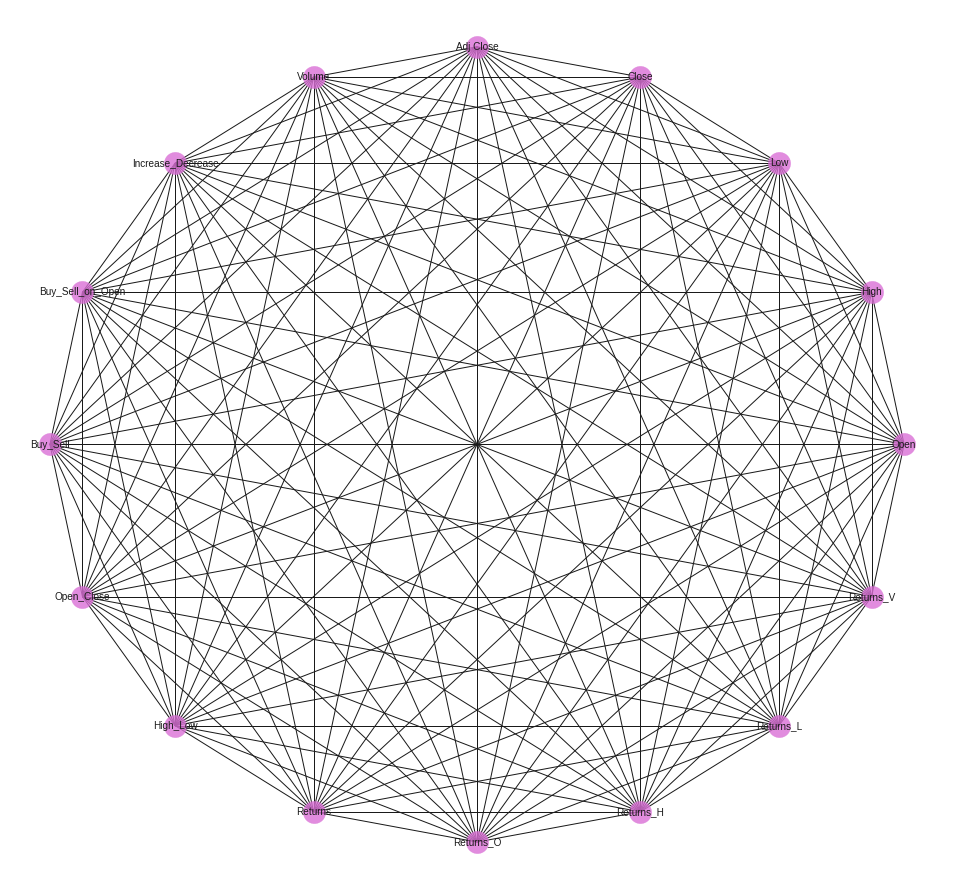

In [838]:
create_corr_network_1(G)

**Modelling end-of-day (EOD) data**

In [839]:
# Imports the pandas package.
import pandas as pd 
#Retrieves end-of-day (EOD) data and stores it in a DataFrame object.
raw = pd.read_csv('http://hilpisch.com/pyalgo_eikon_eod_data.csv',
 index_col=0, parse_dates=True).dropna()

In [840]:
# Exports DataFrame to a CSV file
raw.to_csv(r'C:\Users\Youssouf\Desktop\Applied Data Science Folder\Demystifying Python\EOD_data.csv', index = False)

In [841]:
raw.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2010-01-04 to 2019-12-31
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL.O  2516 non-null   float64
 1   MSFT.O  2516 non-null   float64
 2   INTC.O  2516 non-null   float64
 3   AMZN.O  2516 non-null   float64
 4   GS.N    2516 non-null   float64
 5   SPY     2516 non-null   float64
 6   .SPX    2516 non-null   float64
 7   .VIX    2516 non-null   float64
 8   EUR=    2516 non-null   float64
 9   XAU=    2516 non-null   float64
 10  GDX     2516 non-null   float64
 11  GLD     2516 non-null   float64
dtypes: float64(12)
memory usage: 255.5 KB


In [842]:
#Currency symbol
symbol = 'EUR='

In [843]:
#The time series data for the specified symbol is selected from the original DataFrame.
data = pd.DataFrame(raw[symbol]) 

In [844]:
#Renames the single column to price
data.rename(columns={symbol: 'price'}, inplace=True) 
data.head()

,price
Date,
2010-01-04,1.4411
2010-01-05,1.4368
2010-01-06,1.4412
2010-01-07,1.4318
2010-01-08,1.4412


In [845]:
# No change required to implement the regression-based prediction approach. 
# Just the data object needs to be replaced
lags = 5
cols = []
for lag in range(1, lags + 1):
 col = f'lag_{lag}'
 data[col] = data['price'].shift(lag) # Takes the price column and shifts it by lag
 cols.append(col)
 data.dropna(inplace=True)
 data

In [846]:
reg = np.linalg.lstsq(data[cols], data['price'],
 rcond=None)[0]

In [847]:
#Computes the prediction values as the dot product.
data['prediction'] = np.dot(data[cols], reg)

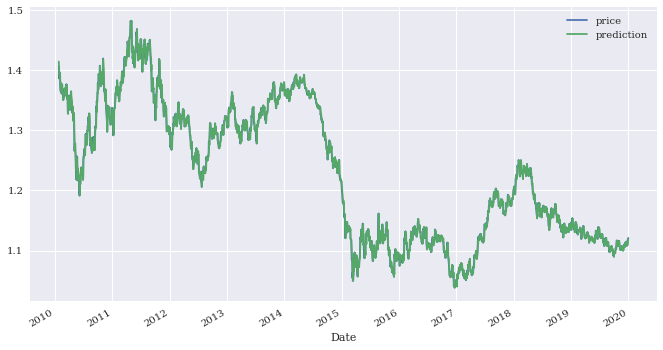

In [848]:
#Plots the price and prediction columns.
data[['price', 'prediction']].plot(figsize=(10, 6));

 Plot hows predicted values based on linear regression (five lags)

In [849]:
m = np.zeros((lags + 1, len(data) - lags)) 

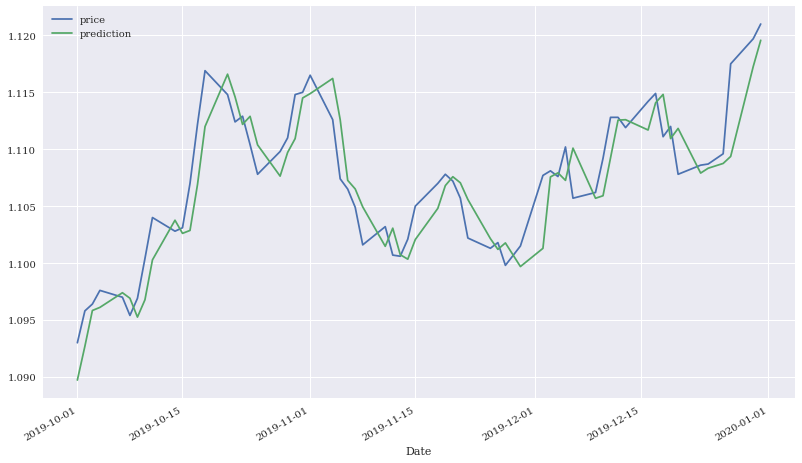

In [850]:
#Zooming in 
data[['price', 'prediction']].loc['2019-10-1':].plot(
 figsize=(12, 8))

EUR/USD exchange rate and predicted values based on linear regression (five lags, three months only). Is the direction is forecasted correctly or not? Yes, the direction is forecasted correctly.

**Predicting future returns**

In [851]:
#Computes the log returns.
data['return'] = np.log(data['price'] /
 data['price'].shift(1))

In [852]:
#Deletes all lines with NaN values.
data.dropna(inplace=True)

In [853]:
#Takes the returns column for the lagged data
cols = []
for lag in range(1, lags + 1):
 col = f'lag_{lag}'
 data[col] = data['return'].shift(lag)
 cols.append(col)
 data.dropna(inplace=True)

In [854]:
reg = np.linalg.lstsq(data[cols], data['return'],
 rcond=None)[0]
reg

array([       -0.02,         0.01,        -0.03,         0.01,
              -0.01])

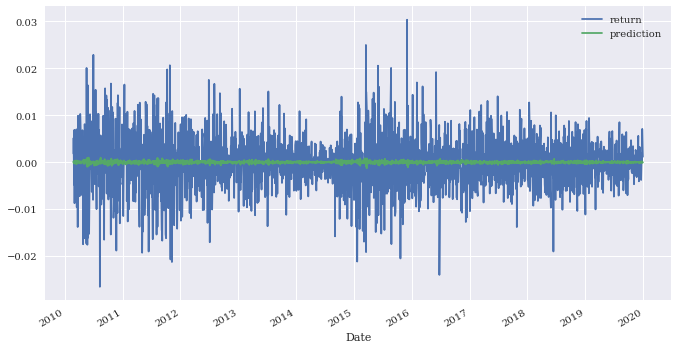

In [855]:
data['prediction'] = np.dot(data[cols], reg)
data[['return', 'prediction']].iloc[lags:].plot(figsize=(10, 6));

EUR/USD log returns and predicted values based on linear regression (five lags)

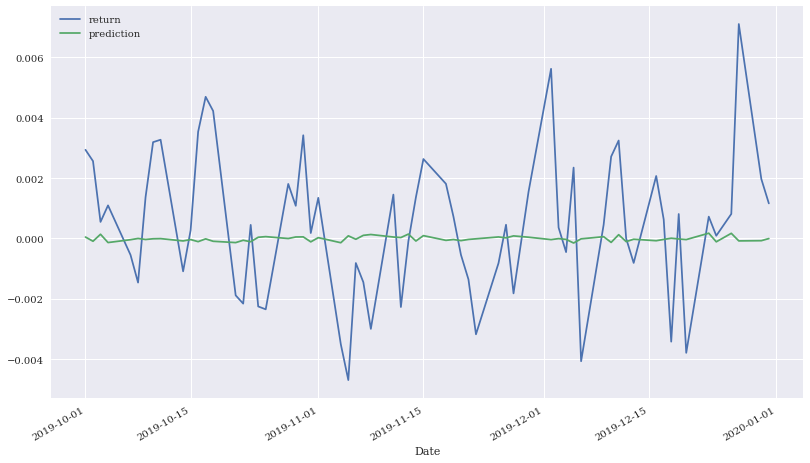

In [856]:
#Zooming in 
data[['return', 'prediction']].loc['2019-10-1':].plot(
 figsize=(12, 8))

In [857]:
#Computes the product of the market and predicted return. 
#Takes the sign of the results and counts the values.
hits = np.sign(data['return'] *
 data['prediction']).value_counts() 
hits #Prints out the counts for the two possible values.

-1.0    1239
 1.0    1233
 0.0      13
dtype: int64

In [858]:
#Computes the hit ratio defined as the number of 
#correct predictions given all predictions.
hits.values[0] / sum(hits)

0.49859154929577465

**Predicting market direction**

In [859]:
#This directly uses the sign of the return to be predicted for the regression.
reg = np.linalg.lstsq(data[cols], np.sign(data['return']),
 rcond=None)[0] 
reg # print regression

array([       -5.60,        -2.23,        -4.82,        -3.32,
              -2.54])

In [860]:
#For the prediction step, only the sign is relevant.
data['prediction'] = np.sign(np.dot(data[cols], reg))

In [861]:
data['prediction'].value_counts()

 1.0    1278
-1.0    1207
Name: prediction, dtype: int64

In [862]:
hits = np.sign(data['return'] *
 data['prediction']).value_counts()
hits

 1.0    1291
-1.0    1181
 0.0      13
dtype: int64

In [863]:
# Model accuracy evaluation
hits.values[0] / sum(hits)

0.5195171026156942

**Evenly spacing sample data['price'] with calculated intervals**

In [864]:
#Return evenly spaced numbers over a specified interval.
def f(x):
    return 2 * x ** 2 - x ** 3 / 3

In [865]:
x=data['price']
x

Date
2010-02-18    1.3614
2010-02-19    1.3615
2010-02-22    1.3597
2010-02-23    1.3505
2010-02-24    1.3530
               ...  
2019-12-24    1.1087
2019-12-26    1.1096
2019-12-27    1.1175
2019-12-30    1.1197
2019-12-31    1.1210
Name: price, Length: 2485, dtype: float64

In [866]:
y = f(x)
y

Date
2010-02-18    2.865742
2010-02-19    2.866102
2010-02-22    2.859638
2010-02-23    2.826664
2010-02-24    2.835613
                ...   
2019-12-24    2.004154
2019-12-26    2.007040
2019-12-27    2.032432
2019-12-30    2.039523
2019-12-31    2.043717
Name: price, Length: 2485, dtype: float64

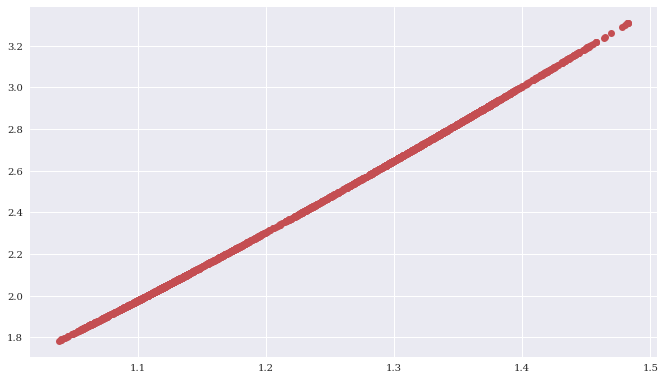

In [867]:
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'ro');

In [868]:
beta = np.cov(x, y, ddof=0)[0, 1] / np.var(x)
beta

3.4136126675603906

In [869]:
alpha = y.mean() - beta * x.mean()
alpha

-1.7835945307236956

In [870]:
y_ = alpha + beta * x
y_

Date
2010-02-18    2.863698
2010-02-19    2.864039
2010-02-22    2.857895
2010-02-23    2.826489
2010-02-24    2.835023
                ...   
2019-12-24    2.001078
2019-12-26    2.004150
2019-12-27    2.031118
2019-12-30    2.038628
2019-12-31    2.043065
Name: price, Length: 2485, dtype: float64

In [871]:
MSE = ((y - y_) ** 2).mean()
MSE

5.7836163317151794e-05

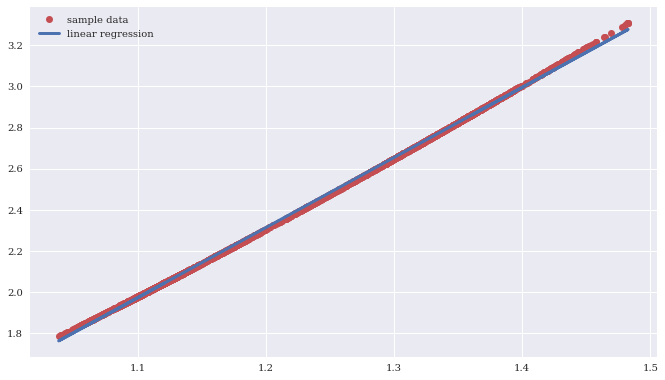

In [872]:
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'ro', label='sample data')
plt.plot(x, y_, lw=3.0, label='linear regression')
plt.legend();

deg=1 | MSE=0.00006
deg=2 | MSE=0.00000
deg=3 | MSE=0.00000


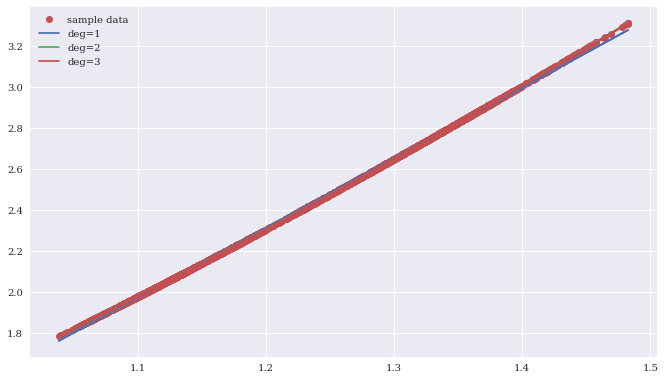

In [873]:
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'ro', label='sample data')
for deg in [1, 2, 3]:
    reg = np.polyfit(x, y, deg=deg)
    y_ = np.polyval(reg, x)
    MSE = ((y - y_) ** 2).mean()
    print(f'deg={deg} | MSE={MSE:.5f}')
    plt.plot(x, np.polyval(reg, x), label=f'deg={deg}')
plt.legend();

In [874]:
reg

array([       -0.33,         2.00,        -0.00,         0.00])

In [875]:
#Return evenly spaced numbers over a specified interval.
def f(x):
    return 2 * x ** 2 - x ** 3 / 3

In [876]:
# Returns num evenly spaced samples, calculated over the
# interval [start=(data['price'], stop=2].
# The endpoint of the interval can optionally be excluded.
x = np.linspace(data['price'],2)
x

array([[        1.36,         1.36,         1.36, ...,         1.12,
                1.12,         1.12],
       [        1.37,         1.37,         1.37, ...,         1.14,
                1.14,         1.14],
       [        1.39,         1.39,         1.39, ...,         1.15,
                1.16,         1.16],
       ...,
       [        1.97,         1.97,         1.97, ...,         1.96,
                1.96,         1.96],
       [        1.99,         1.99,         1.99, ...,         1.98,
                1.98,         1.98],
       [        2.00,         2.00,         2.00, ...,         2.00,
                2.00,         2.00]])

In [877]:
y = f(x)
y

array([[        2.87,         2.87,         2.86, ...,         2.03,
                2.04,         2.04],
       [        2.91,         2.91,         2.91, ...,         2.09,
                2.10,         2.10],
       [        2.96,         2.96,         2.95, ...,         2.15,
                2.16,         2.16],
       ...,
       [        5.23,         5.23,         5.23, ...,         5.19,
                5.19,         5.19],
       [        5.28,         5.28,         5.28, ...,         5.26,
                5.26,         5.26],
       [        5.33,         5.33,         5.33, ...,         5.33,
                5.33,         5.33]])

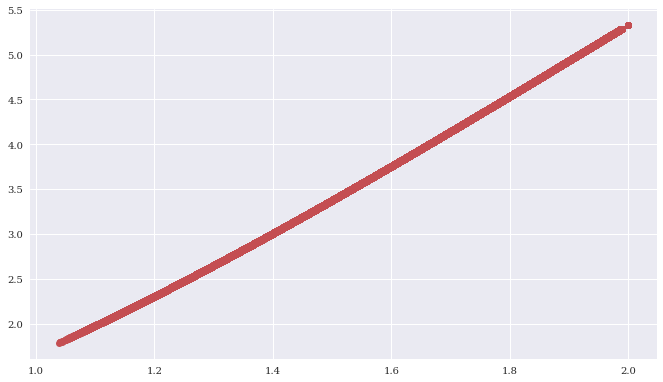

In [878]:
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'ro');

In [879]:
beta = np.cov(x, y, ddof=0)[0, 1] / np.var(x)
beta

0.22090527220959194

In [880]:
alpha = y.mean() - beta * x.mean()
alpha

3.4755558432685483

In [881]:
y_ = alpha + beta * x

In [882]:
MSE = ((y - y_) ** 2).mean()
MSE

0.7144242212923845

<bound method _AxesBase.draw of <matplotlib.axes._axes.Axes object at 0x7fb2512b8390>>

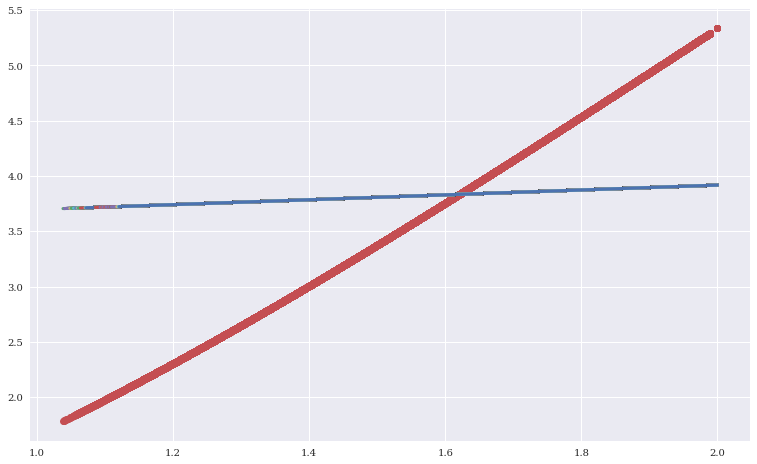

In [883]:
fig = plt.figure(1, figsize=(10, 6), frameon=False )#, dpi=10
fig.add_axes([0, 0, 1, 1])
ax = plt.gca()
ax.plot(x, y, 'ro', label='price')
ax.plot(x, y_, lw=3.0, label='linear regression')
ax.draw

Figure showing sign of a bearing market but more analysis is required to be certain we are heading for a crossover.

In [884]:
# Create an array with the same properties as x and will fill it with average mean squared error.
#y = np.full_like(x, MSE)
#y

In [885]:
# Reshapes x
x = x.reshape(-1,)
x.shape

(124250,)

In [886]:
# Reshapes y
y = y.reshape(-1,)
y.shape

(124250,)

deg=1 | MSE=0.00059
deg=2 | MSE=0.00002
deg=3 | MSE=0.00000


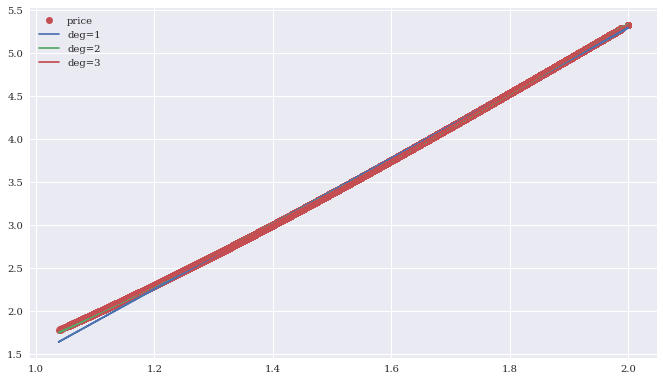

In [887]:
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'ro', label='price')
for deg in [1, 2, 3]:
    reg = np.polyfit(x, y, deg=deg)
    y_ = np.polyval(reg, x)
    MSE = ((y - y_) ** 2).mean()
    print(f'deg={deg} | MSE={MSE:.5f}')
    plt.plot(x, np.polyval(reg, x), label=f'deg={deg}')
plt.legend();

**errorbar**

<function matplotlib.pyplot.draw>

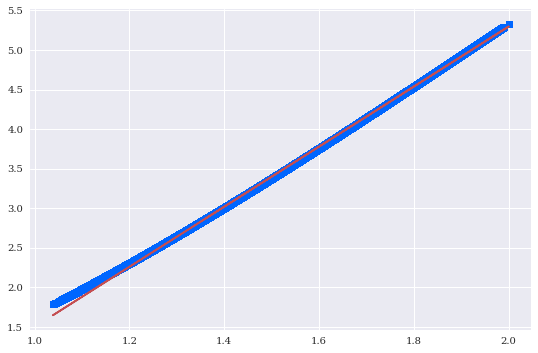

In [888]:
plt.rc('font', family='serif', size=13)
m, b = np.polyfit(x, y, 1)
plt.plot(x,y,'s',color='#0066FF')
plt.plot(x, m*x + b, 'r-') #Should break here
plt.errorbar(x,y,xerr=0,yerr=0,linestyle="None",color='black')
#plt.xlim(0.2,1)
#plt.ylim(0,0.8)
plt.draw
#plt.show()

Error bar should be placed around : 0.71%

In [889]:
# Repeat the code above with very little modification.
# Returns num evenly spaced samples, calculated over the
# interval [start=(-2, data['price'], stop=5].
# The endpoint of the interval can optionally be excluded.
x = np.linspace(-2, data['price'])
x

array([[       -2.00,        -2.00,        -2.00, ...,        -2.00,
               -2.00,        -2.00],
       [       -1.93,        -1.93,        -1.93, ...,        -1.94,
               -1.94,        -1.94],
       [       -1.86,        -1.86,        -1.86, ...,        -1.87,
               -1.87,        -1.87],
       ...,
       [        1.22,         1.22,         1.22, ...,         0.99,
                0.99,         0.99],
       [        1.29,         1.29,         1.29, ...,         1.05,
                1.06,         1.06],
       [        1.36,         1.36,         1.36, ...,         1.12,
                1.12,         1.12]])

In [890]:
y = f(x)
y

array([[       10.67,        10.67,        10.67, ...,        10.67,
               10.67,        10.67],
       [        9.86,         9.86,         9.86, ...,         9.92,
                9.92,         9.92],
       [        9.09,         9.09,         9.10, ...,         9.20,
                9.20,         9.20],
       ...,
       [        2.39,         2.39,         2.38, ...,         1.64,
                1.64,         1.65],
       [        2.62,         2.62,         2.62, ...,         1.83,
                1.84,         1.84],
       [        2.87,         2.87,         2.86, ...,         2.03,
                2.04,         2.04]])

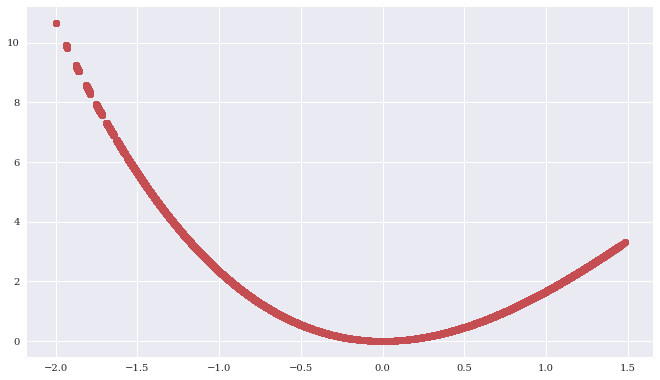

In [891]:
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'ro');

In [892]:
beta = np.cov(x, y, ddof=0)[0, 1] / np.var(x)
beta

0.0

In [893]:
alpha = y.mean() - beta * x.mean()
alpha

2.480161840794146

In [894]:
y_ = alpha + beta * x

In [895]:
MSE = ((y - y_) ** 2).mean()
MSE

8.288766912949832

In [896]:
# Creates an array with the same properties as x and will fill it with average mean squared error.
#y = np.full_like(x, MSE)


<bound method _AxesBase.draw of <matplotlib.axes._axes.Axes object at 0x7fb26f43b750>>

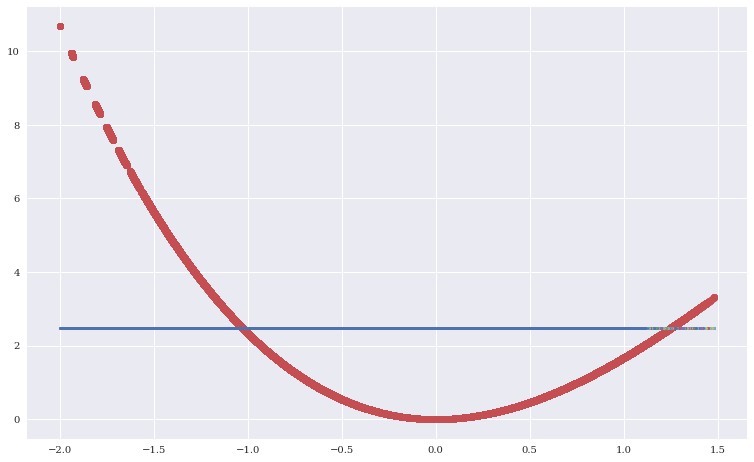

In [897]:
fig = plt.figure(1, figsize=(10, 6), frameon=False )#dpi=10
fig.add_axes([0, 0, 1, 1])
ax = plt.gca()
ax.plot(x, y, 'ro', label='price')
ax.plot(x, y_, lw=3.0, label='linear regression')
ax.draw

In [898]:
# Reshapes x
x = x.reshape(-1,)
# Reshapes y
y = y.reshape(-1,)
x.shape, y.shape

((124250,), (124250,))

deg=1 | MSE=3.83848
deg=2 | MSE=0.05516
deg=3 | MSE=0.00000


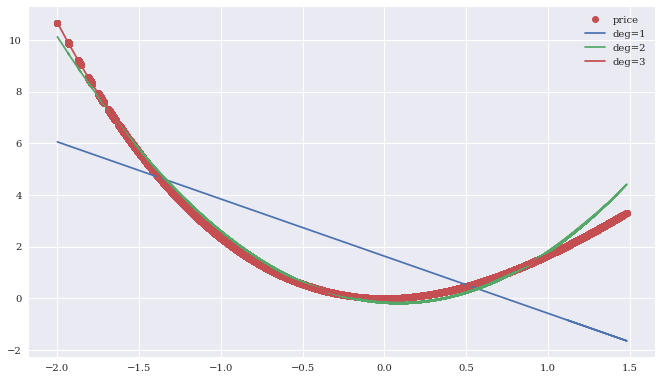

In [899]:
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'ro', label='price')
for deg in [1, 2, 3]:
    reg = np.polyfit(x, y, deg=deg)
    y_ = np.polyval(reg, x)
    MSE = ((y - y_) ** 2).mean()
    print(f'deg={deg} | MSE={MSE:.5f}')
    plt.plot(x, np.polyval(reg, x), label=f'deg={deg}')
plt.legend();

Figure showing small but progrossive sign of bull market. We can't be certain thatis the case.

In [900]:
reg

array([       -0.33,         2.00,        -0.00,        -0.00])

**Forecasting using LSTM-ARIMA model**

In [901]:
!pip install chart_studio

In [902]:
#Import relevant libraries
import warnings
import itertools
import pandas as pd
pd.core.common.is_list_like = pd.api.types.is_list_like
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from pandas_datareader import data, wb
import fix_yahoo_finance as yf
yf.pdr_override()
from datetime import datetime
import seaborn as sns
import cufflinks
import plotly
#from plotly.plotly import plot_mpl
plt.style.use('fivethirtyeight')
import pandas as pd
pd.core.common.is_list_like = pd.api.types.is_list_like
from pandas_datareader import data, wb
import fix_yahoo_finance as yf
yf.pdr_override()

from datetime import datetime
import seaborn as sns
import cufflinks
import plotly
#from plotly.plotly import plot_mpl
import chart_studio.plotly as py
import plotly.graph_objs as go

In [903]:

#Use Power Assets Holdings Ltd as an example

stock = "0006"
stock = f"{stock}.HK"
stock

'0006.HK'

[*********************100%***********************]  1 of 1 downloaded


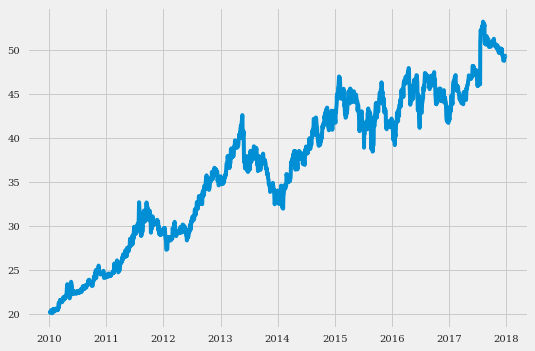

In [904]:
## Fetches stock market data 

start = datetime(2010,1,4)
end = datetime(2017,12,31)

ticker = data.get_data_yahoo(stock, start, end)
ticker.head()

df = pd.DataFrame(index=ticker.index)
df['Adj Close'] = ticker['Adj Close']

#Plot data

plt.plot(df["Adj Close"], label = "Adj Close")

In [905]:
#
data = df
data.index = pd.to_datetime(data.index)

In [906]:
#Group price data by monthly average
data = data['Adj Close'].resample('MS').mean()
data = data.fillna(data.bfill())

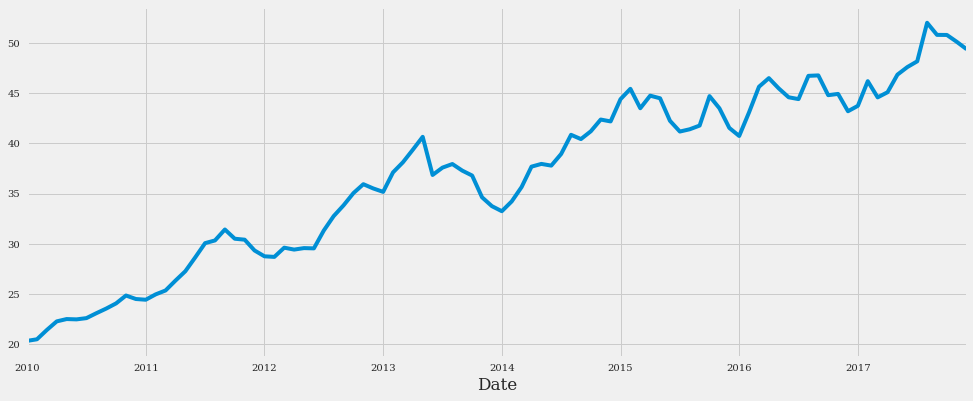

In [907]:
#plot data
data.plot(figsize=(15, 6))
plt.show()

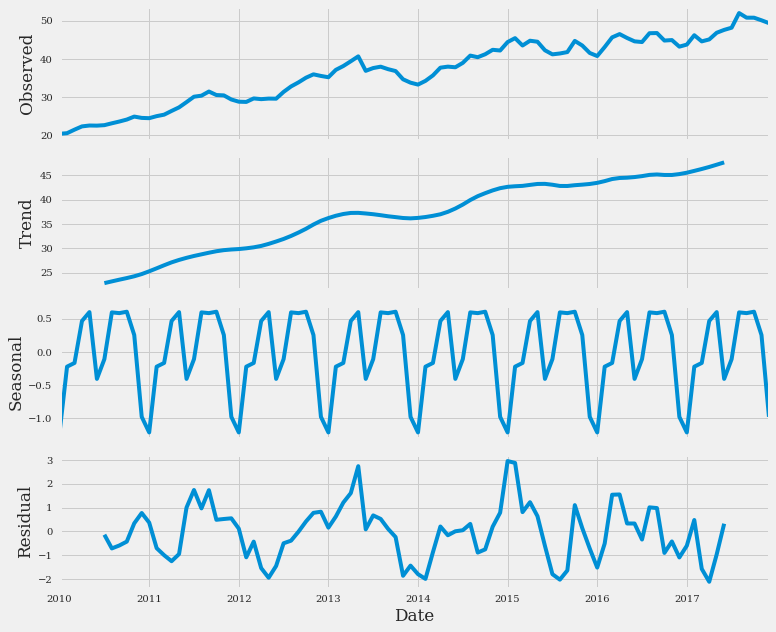

In [908]:
from pylab import rcParams
rcParams['figure.figsize'] = 11, 9

decomposition = sm.tsa.seasonal_decompose(data, model='additive')
fig = decomposition.plot()
plt.show()

In [909]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [910]:
warnings.filterwarnings("ignore") # specify to ignore warning messages
AIC_list = pd.DataFrame({}, columns=['param','param_seasonal','AIC'])
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(data,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=True,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results.aic))
            temp = pd.DataFrame([[ param ,  param_seasonal , results.aic ]], columns=['param','param_seasonal','AIC'])
            AIC_list = AIC_list.append( temp, ignore_index=True)  # DataFrame append 는 일반 list append 와 다르게 이렇게 지정해주어야한다.
            del temp

        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12) - AIC:971.4805181804513
ARIMA(0, 0, 0)x(0, 0, 1, 12) - AIC:880.9874544816507
ARIMA(0, 0, 0)x(0, 1, 0, 12) - AIC:508.68691011796875
ARIMA(0, 0, 0)x(0, 1, 1, 12) - AIC:509.68794646284596
ARIMA(0, 0, 0)x(1, 0, 0, 12) - AIC:631.4059281822355
ARIMA(0, 0, 0)x(1, 0, 1, 12) - AIC:632.3662389893589
ARIMA(0, 0, 0)x(1, 1, 0, 12) - AIC:508.5162410214266
ARIMA(0, 0, 0)x(1, 1, 1, 12) - AIC:484.34686431912854
ARIMA(0, 0, 1)x(0, 0, 0, 12) - AIC:847.0518796960398
ARIMA(0, 0, 1)x(0, 0, 1, 12) - AIC:756.0013260189838
ARIMA(0, 0, 1)x(0, 1, 0, 12) - AIC:420.8292935398823
ARIMA(0, 0, 1)x(0, 1, 1, 12) - AIC:422.4497475587616
ARIMA(0, 0, 1)x(1, 0, 0, 12) - AIC:526.9973541954241
ARIMA(0, 0, 1)x(1, 0, 1, 12) - AIC:528.4945410491896
ARIMA(0, 0, 1)x(1, 1, 0, 12) - AIC:422.05528530542193
ARIMA(0, 0, 1)x(1, 1, 1, 12) - AIC:404.41383119443265
ARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:318.77452819920745
ARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:319.8249470468247
ARIMA(0, 1, 0)x(0, 1, 0, 12) - AIC:326.2

In [911]:
m = np.amin(AIC_list['AIC'].values) # Find minimum value in AIC
l = AIC_list['AIC'].tolist().index(m) # Find index number for lowest AIC
Min_AIC_list = AIC_list.iloc[l,:]

In [912]:
model = sm.tsa.statespace.SARIMAX(data,
                                order=Min_AIC_list['param'],
                                seasonal_order=Min_AIC_list['param_seasonal'],
                                enforce_stationarity=True,
                                enforce_invertibility=False)

In [913]:
results = model.fit()

### Min_AIC_list ### 
param                 (0, 1, 0)
param_seasonal    (1, 1, 1, 12)
AIC                      284.41
Name: 23, dtype: object
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.2851      0.167     -1.707      0.088      -0.613       0.042
ma.S.L12      -0.6239      0.200     -3.114      0.002      -1.017      -0.231
sigma2         1.4707      0.214      6.862      0.000       1.051       1.891


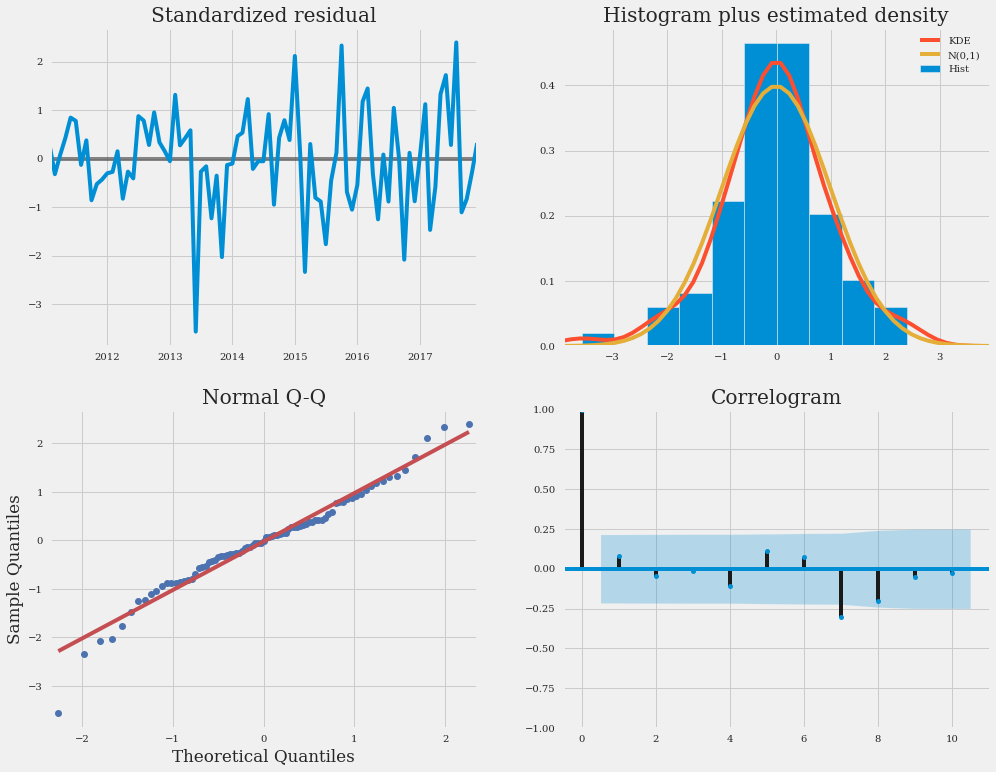

In [914]:
print("### Min_AIC_list ### \n{}".format(Min_AIC_list))

print(results.summary().tables[1])

results.plot_diagnostics(figsize=(15, 12))
plt.show()

In [915]:
#parameters that provide lowest AIC score is adopted

model = sm.tsa.statespace.SARIMAX(data,
                                order=(0,1,1),
                                seasonal_order=(1,1,1,12),
                                enforce_stationarity=True,
                                enforce_invertibility=False)
results = model.fit()

print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.0933      0.160      0.583      0.560      -0.221       0.407
ar.S.L12      -0.2897      0.179     -1.621      0.105      -0.640       0.061
ma.S.L12      -0.5905      0.211     -2.798      0.005      -1.004      -0.177
sigma2         1.4752      0.211      6.993      0.000       1.062       1.889


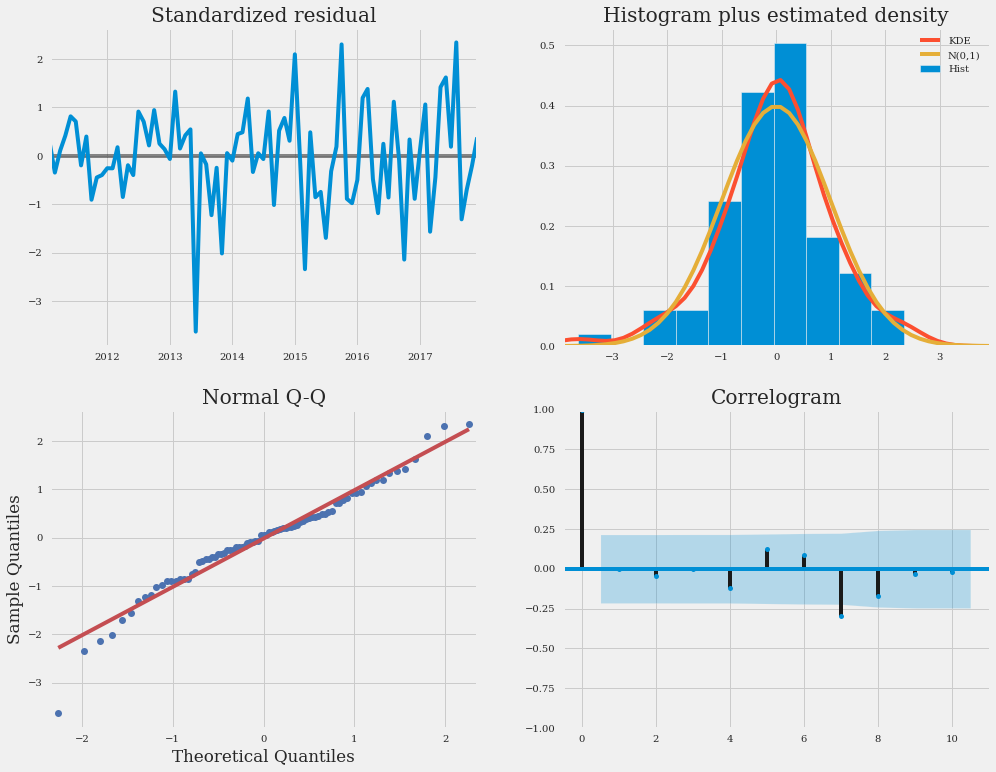

In [916]:
results.plot_diagnostics(figsize=(15, 12))
plt.show()

In [917]:
pred = results.get_prediction(start=pd.to_datetime('2017-06-01'),dynamic=False)
pred_ci = pred.conf_int()

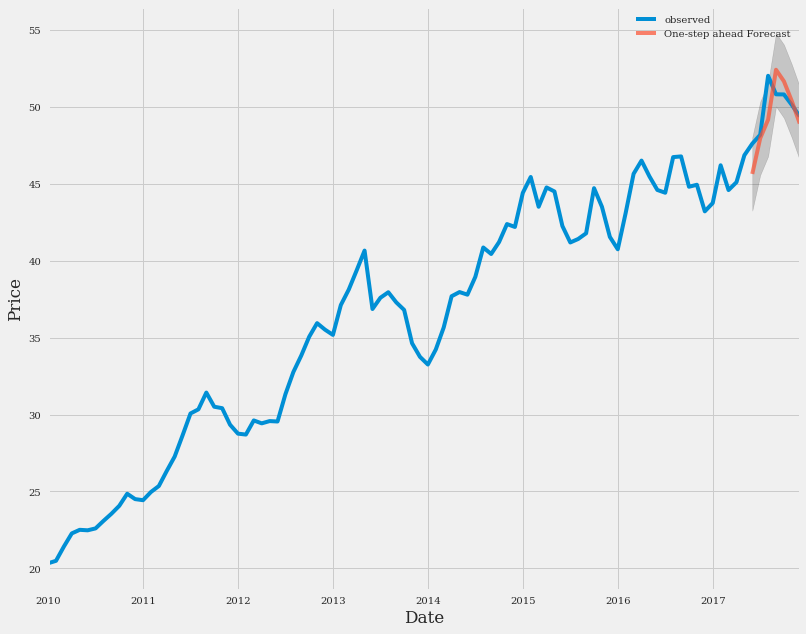

In [918]:
#plot prediction results

plt.figure(figsize =(12,10))
ax = data['2000':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Price')
plt.legend()

plt.show()

In [919]:
#Calculate mean squared error

data_forecasted = pred.predicted_mean
data_truth = data['2000-01-04':]

# Compute the mean square error
mse = ((data_forecasted - data_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

The Mean Squared Error of our forecasts is 2.23


In [920]:
# Get forecast 10 steps ahead in future
pred_uc = results.get_forecast(steps=10)

# Get confidence intervals of forecasts
pred_ci = pred_uc.conf_int(alpha = 0.05)
print(pred_ci)

            lower Adj Close  upper Adj Close
2018-01-01        47.160568        51.923119
2018-02-01        47.672958        54.728605
2018-03-01        47.461471        56.229733
2018-04-01        47.781089        57.978279
2018-05-01        47.115645        58.564790
2018-06-01        45.574904        58.151994
2018-07-01        45.169912        58.781798
2018-08-01        46.392480        60.965871
2018-09-01        45.883960        61.359230
2018-10-01        45.472531        61.799938


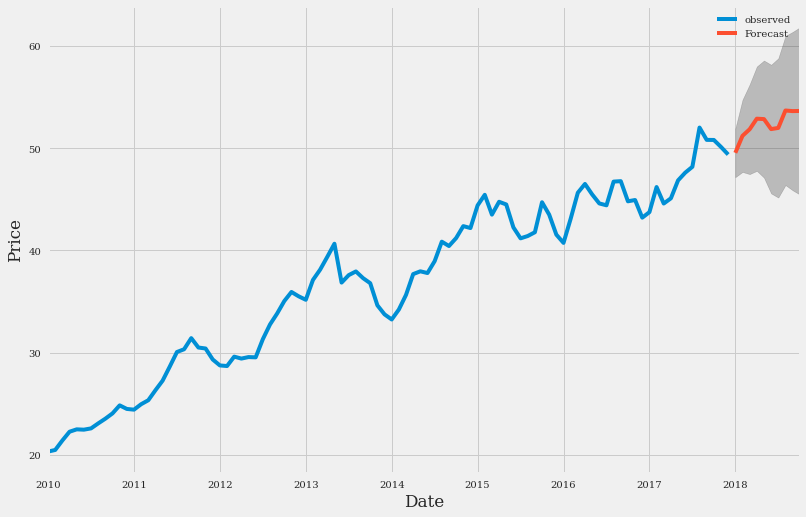

In [921]:
#Plot forecast
ax = data.plot(label='observed', figsize=(12, 8))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Price')

plt.legend()
plt.show()

#Visualisation

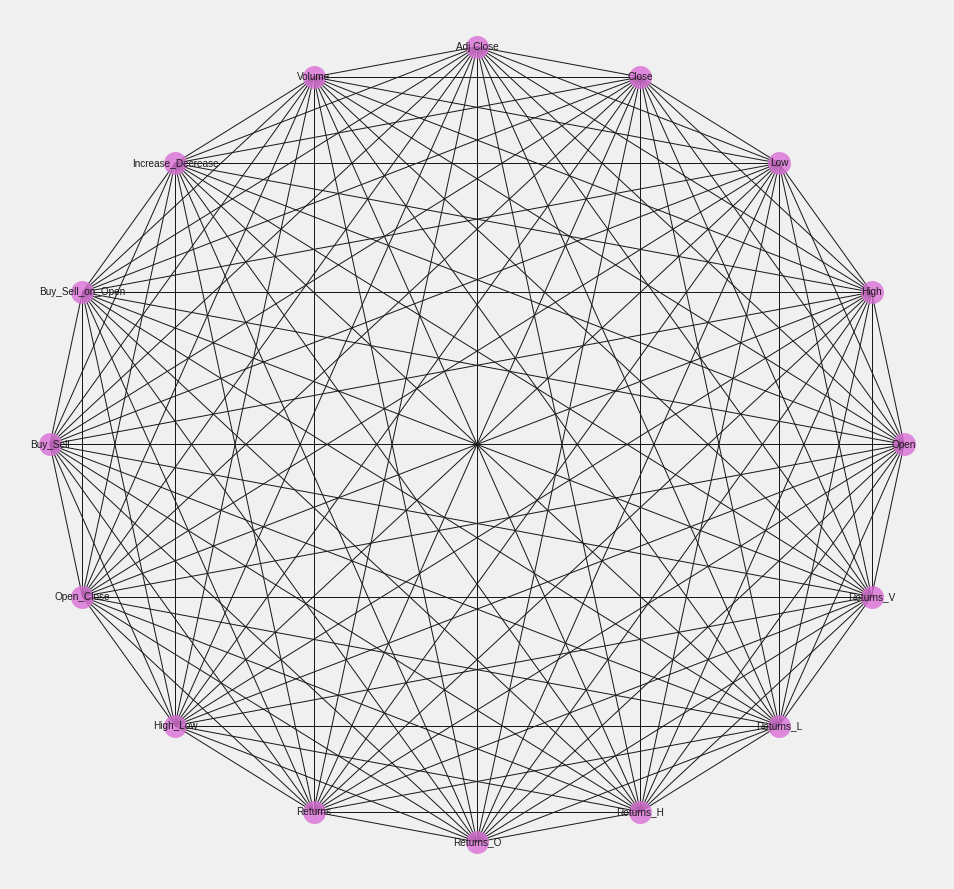

In [922]:
create_corr_network_1(G)

In [927]:
# Imports the pandas package.
import pandas as pd 
#Retrieves end-of-day (EOD) data and stores it in a DataFrame object.
raw = pd.read_csv('http://hilpisch.com/pyalgo_eikon_eod_data.csv',
 index_col=0, parse_dates=True).dropna()

In [928]:
# Exports DataFrame to a CSV file
raw.to_csv(r'C:\Users\Youssouf\Desktop\Applied Data Science Folder\Demystifying Python\EOD_data.csv', index = False)

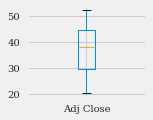

In [926]:
data.plot(kind='box', subplots=True, layout=(5,5), sharex=False, sharey=False)
plt.show()

In [929]:
#Currency symbol
symbol = 'EUR='

In [930]:
#The time series data for the specified symbol is selected from the original DataFrame.
data = pd.DataFrame(raw[symbol]) 

In [931]:
#Renames the single column to price
data.rename(columns={symbol: 'price'}, inplace=True) 
data.head()

,price
Date,
2010-01-04,1.4411
2010-01-05,1.4368
2010-01-06,1.4412
2010-01-07,1.4318
2010-01-08,1.4412


In [932]:
# No change required to implement the regression-based prediction approach. 
# Just the data object needs to be replaced
lags = 5
cols = []
for lag in range(1, lags + 1):
 col = f'lag_{lag}'
 data[col] = data['price'].shift(lag) # Takes the price column and shifts it by lag
 cols.append(col)
 data.dropna(inplace=True)
 data

In [933]:
reg = np.linalg.lstsq(data[cols], data['price'],
 rcond=None)[0]

In [934]:
#Computes the prediction values as the dot product.
data['prediction'] = np.dot(data[cols], reg)

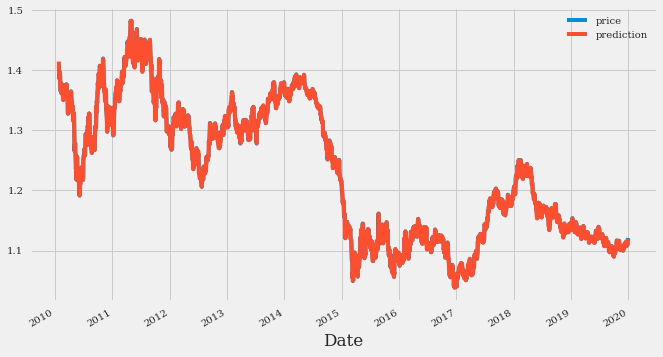

In [935]:
#Plots the price and prediction columns.
data[['price', 'prediction']].plot(figsize=(10, 6));

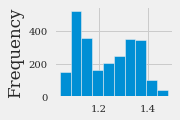

In [936]:
data['prediction'].plot(kind='hist', subplots=True, layout=(5,5), sharex=False, sharey=False)
plt.show()

In [925]:
data['price'].plot(kind='hist', subplots=True, layout=(4,4), sharex=False, sharey=False)
plt.show()

KeyError: ignored

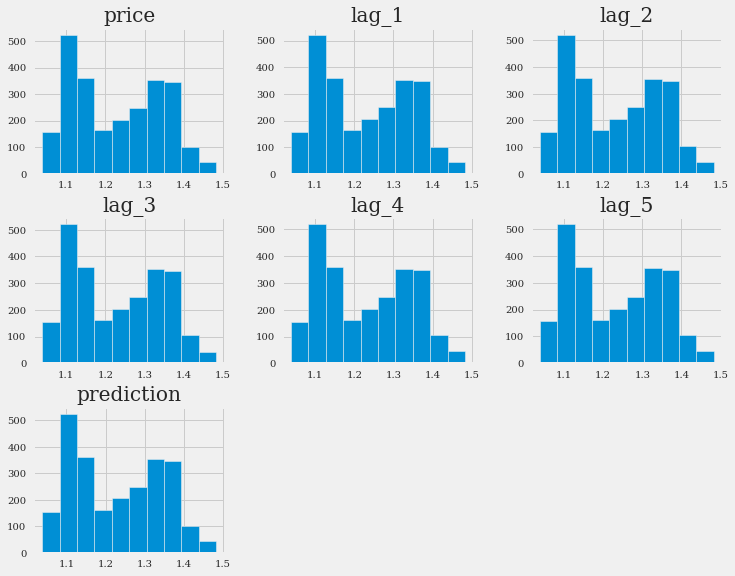

In [937]:
data.hist()
plt.show()

In [938]:
# Dataset information and prints all columns
print(data.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2501 entries, 2010-01-26 to 2019-12-31
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   price       2501 non-null   float64
 1   lag_1       2501 non-null   float64
 2   lag_2       2501 non-null   float64
 3   lag_3       2501 non-null   float64
 4   lag_4       2501 non-null   float64
 5   lag_5       2501 non-null   float64
 6   prediction  2501 non-null   float64
dtypes: float64(7)
memory usage: 156.3 KB
None


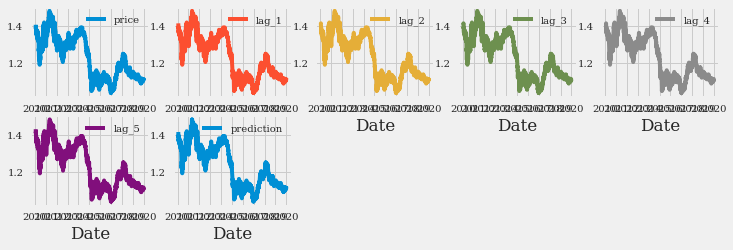

In [939]:
data.plot(kind='line', subplots=True, layout=(5,5), sharex=False, sharey=False)
plt.show()

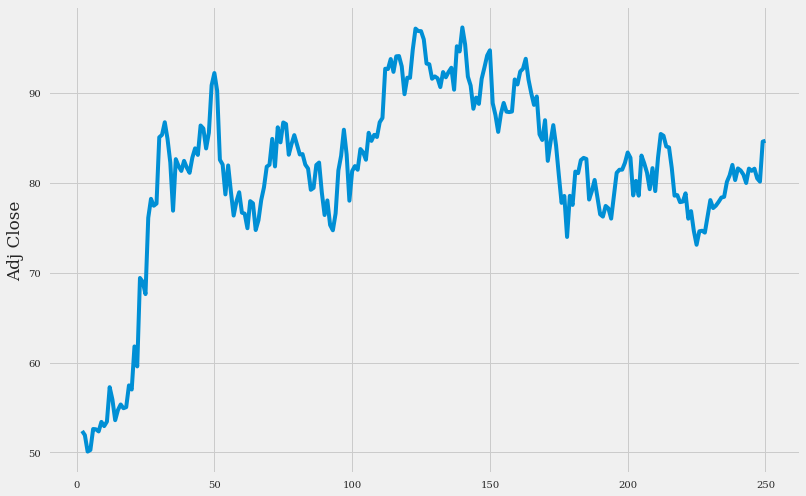

In [940]:

fig, ax = plt.subplots()
fig.set_size_inches(12, 8)
sns.lineplot(dataset.index ,dataset['Adj Close'])

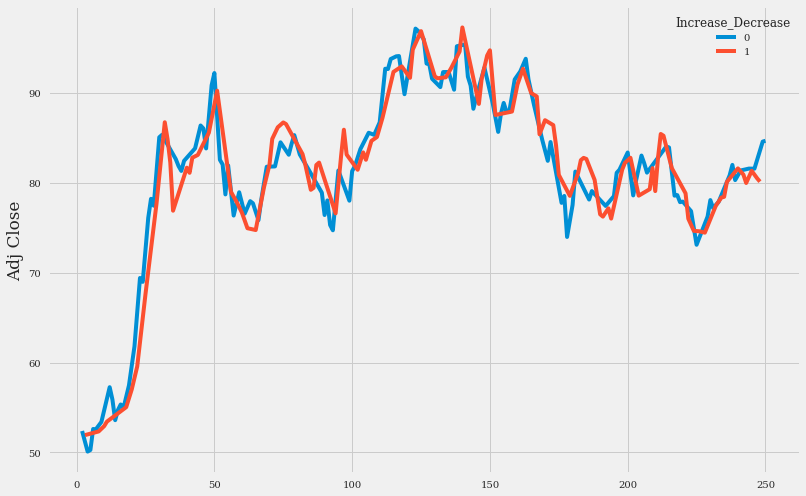

In [942]:
fig, ax = plt.subplots()
fig.set_size_inches(12, 8)
ax = sns.lineplot(x=dataset.index, y="Adj Close", hue="Increase_Decrease", data=dataset)

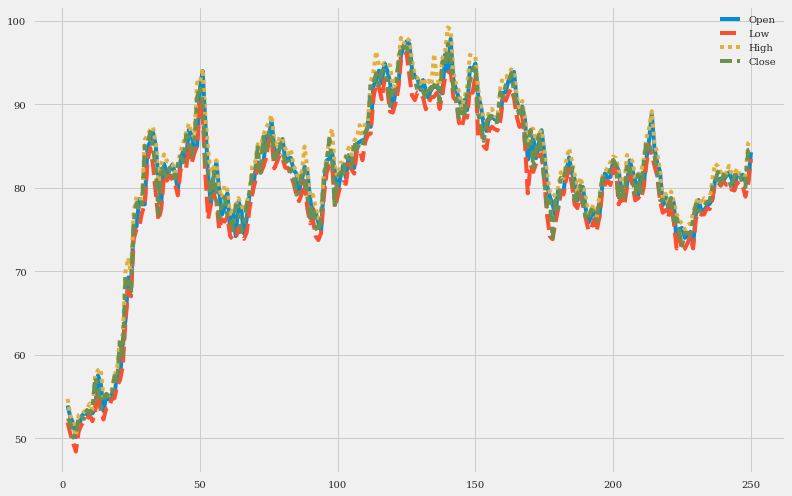

In [943]:
# Plot Multi lines
fig, ax = plt.subplots()
fig.set_size_inches(12, 8)
ax = sns.lineplot(data=dataset[['Open', 'Low', 'High', 'Close']])

In [944]:
dataset['Increase_Decrease'].value_counts()

0    140
1    109
Name: Increase_Decrease, dtype: int64

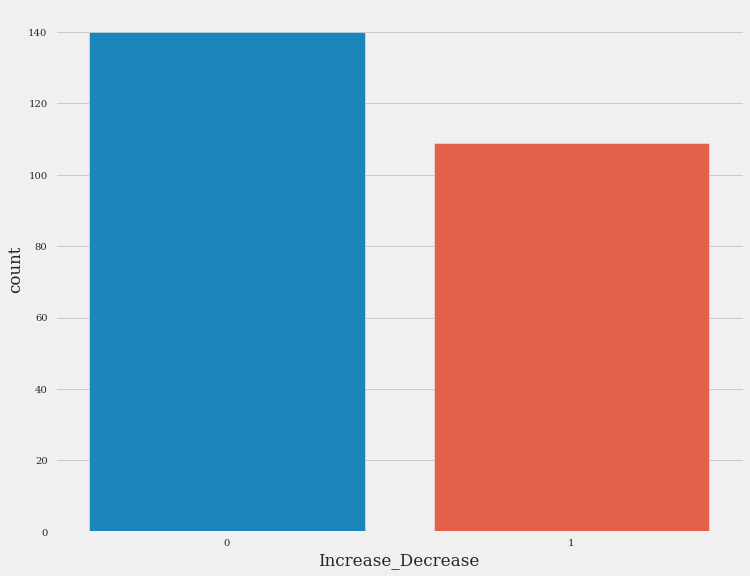

In [947]:
ax = sns.countplot(dataset['Increase_Decrease'],label="Count")

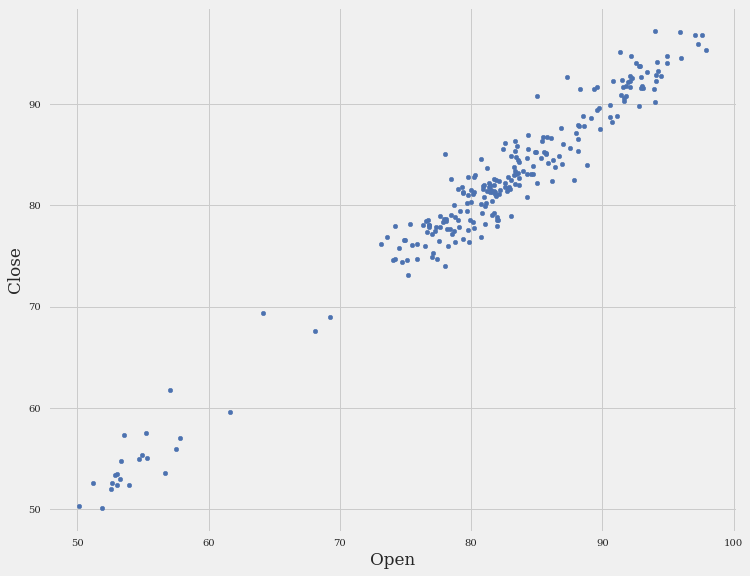

In [948]:
# Scatterplot
dataset.plot(kind="scatter", x="Open", y="Close")

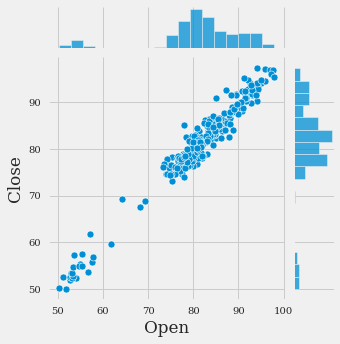

In [949]:
# bivariate scatterplots and univariate histograms
sns.jointplot(x="Open", y="Close", data=dataset, size=5)

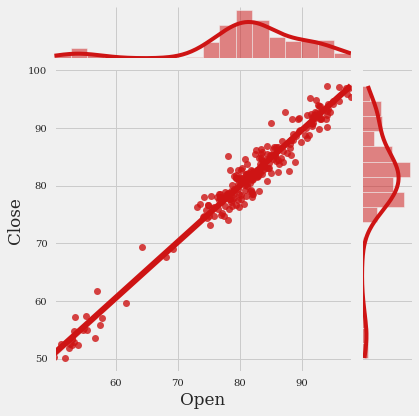

In [950]:
sns.jointplot(dataset.loc[:,'Open'], dataset.loc[:,'Close'], kind='reg', color="#ce1414")

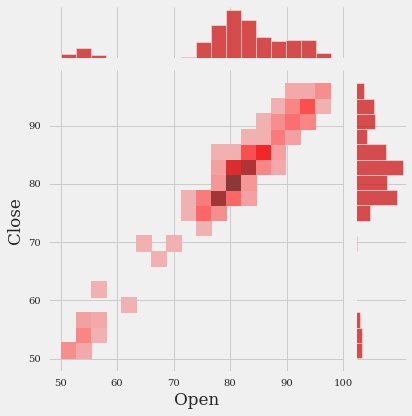

In [951]:
sns.jointplot(dataset.loc[:,'Open'], dataset.loc[:,'Close'], kind="hist", color="#ce1414")

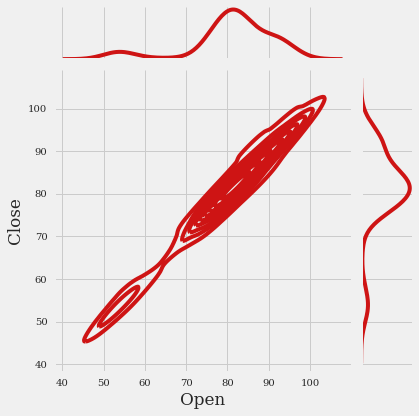

In [952]:
sns.jointplot(dataset.loc[:,'Open'], dataset.loc[:,'Close'], kind="kde", color="#ce1414")

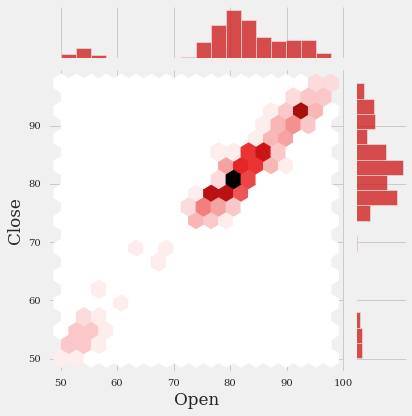

In [953]:
sns.jointplot(dataset.loc[:,'Open'], dataset.loc[:,'Close'], kind='hex', color="#ce1414")

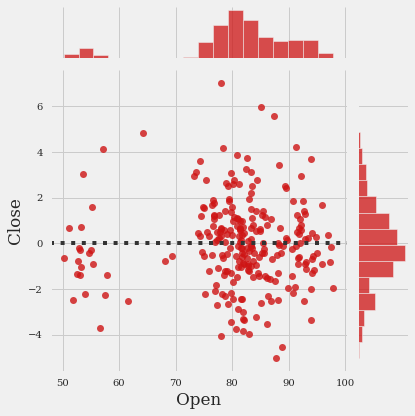

In [954]:
sns.jointplot(dataset.loc[:,'Open'], dataset.loc[:,'Close'], kind='resid', color="#ce1414")

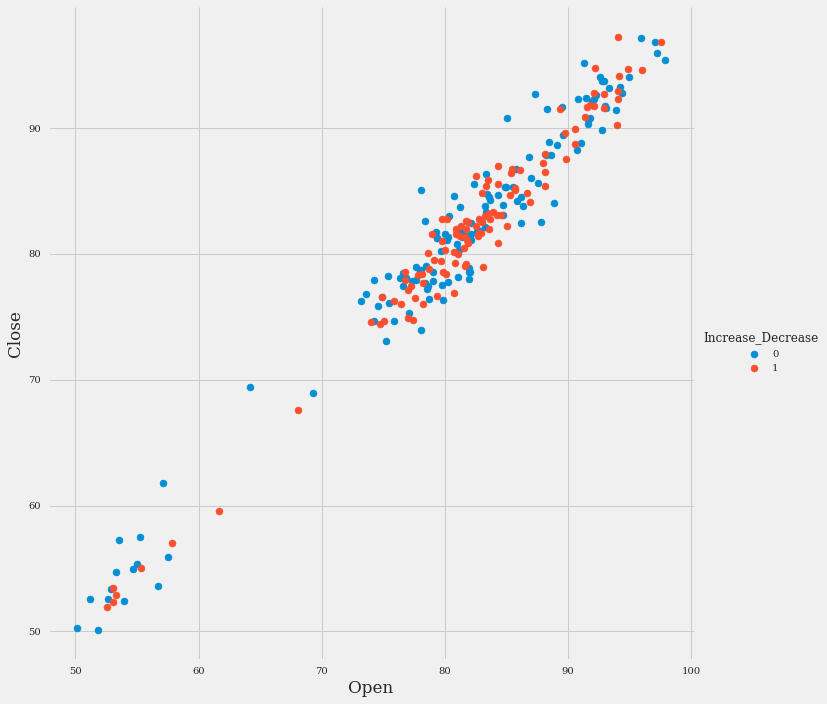

In [955]:
sns.FacetGrid(dataset, hue="Increase_Decrease", size=10) \
   .map(plt.scatter, "Open", "Close") \
   .add_legend()

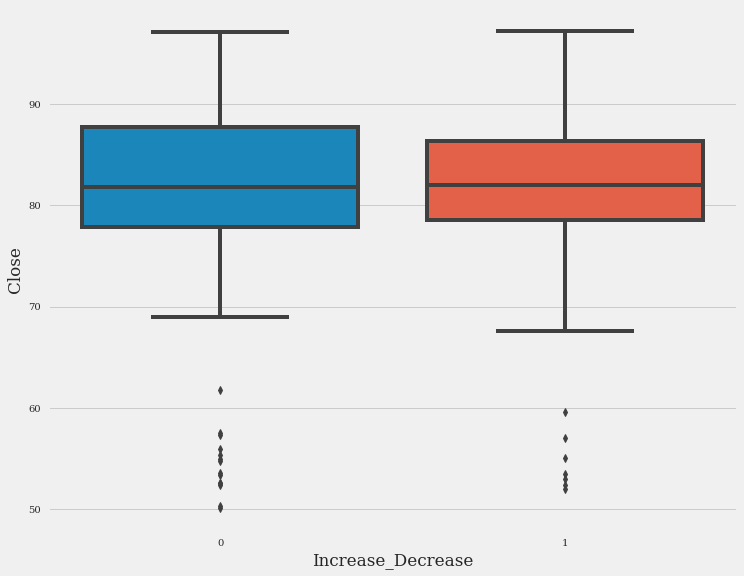

In [956]:
# Boxplot
sns.boxplot(x='Increase_Decrease', y=dataset['Close'], data=dataset)

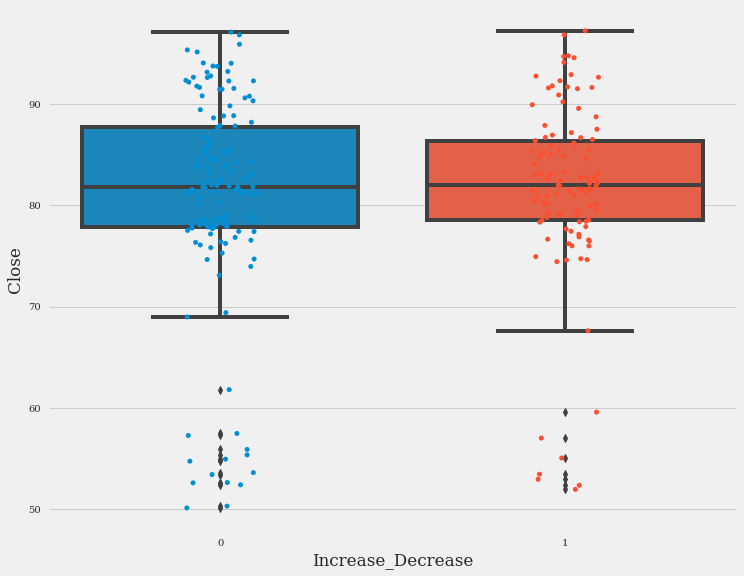

In [957]:
ax = sns.boxplot(x='Increase_Decrease', y=dataset['Close'], data=dataset)
ax = sns.stripplot(x='Increase_Decrease', y=dataset['Close'], data=dataset, jitter=True, edgecolor="gray")

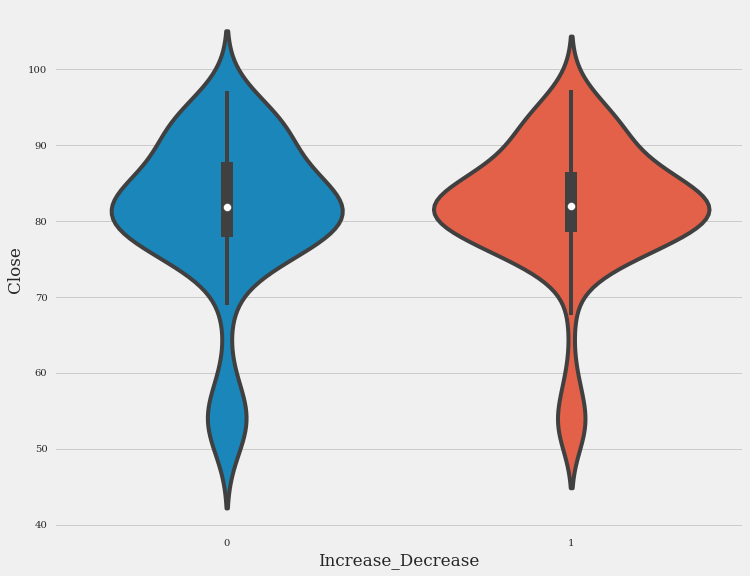

In [958]:
sns.violinplot(x='Increase_Decrease', y=dataset['Close'], data=dataset, size=6)

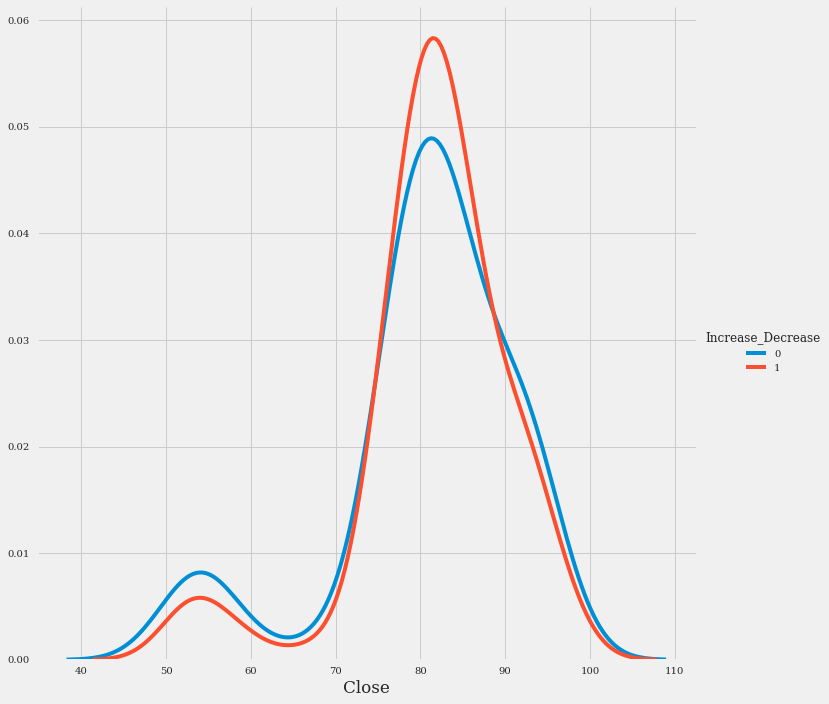

In [959]:

sns.FacetGrid(dataset, hue="Increase_Decrease", size=10) \
   .map(sns.kdeplot, "Close") \
   .add_legend()

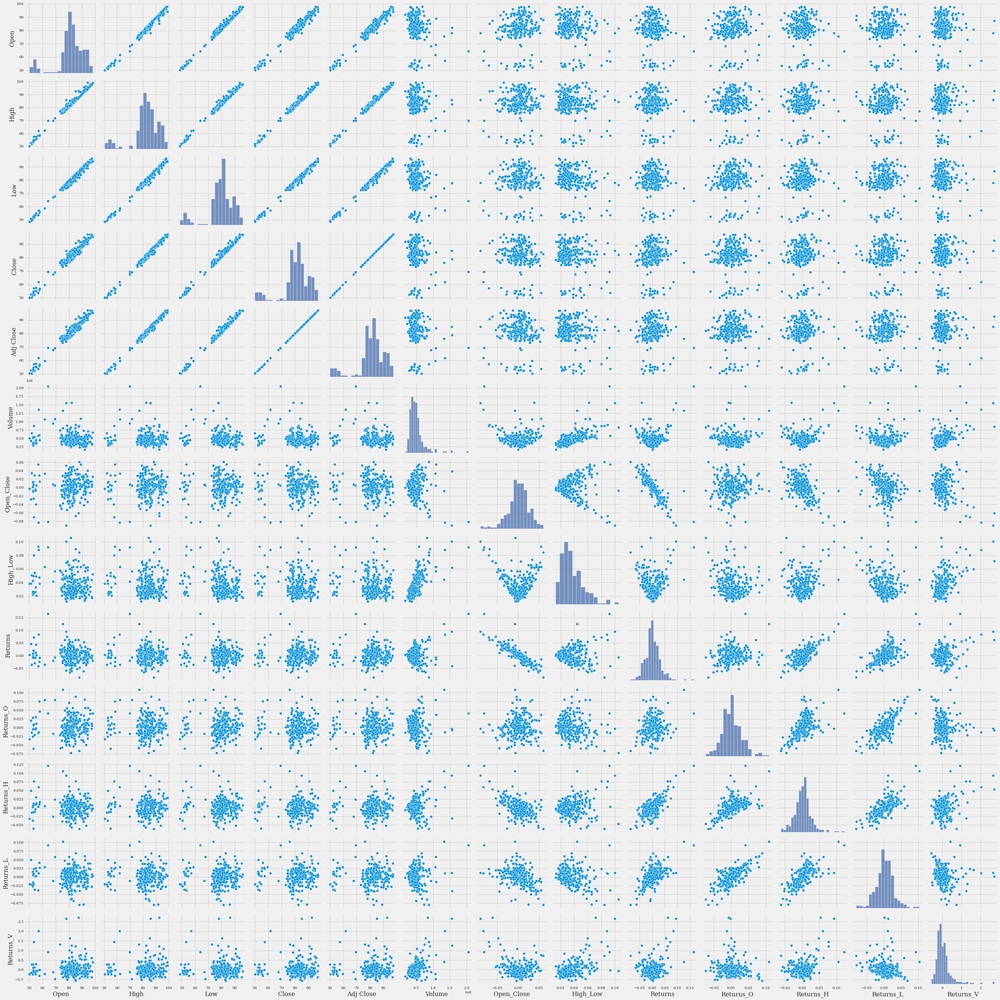

In [960]:
sns.pairplot(dataset.drop(["Increase_Decrease", "Buy_Sell_on_Open", "Buy_Sell"], axis=1), size=3)

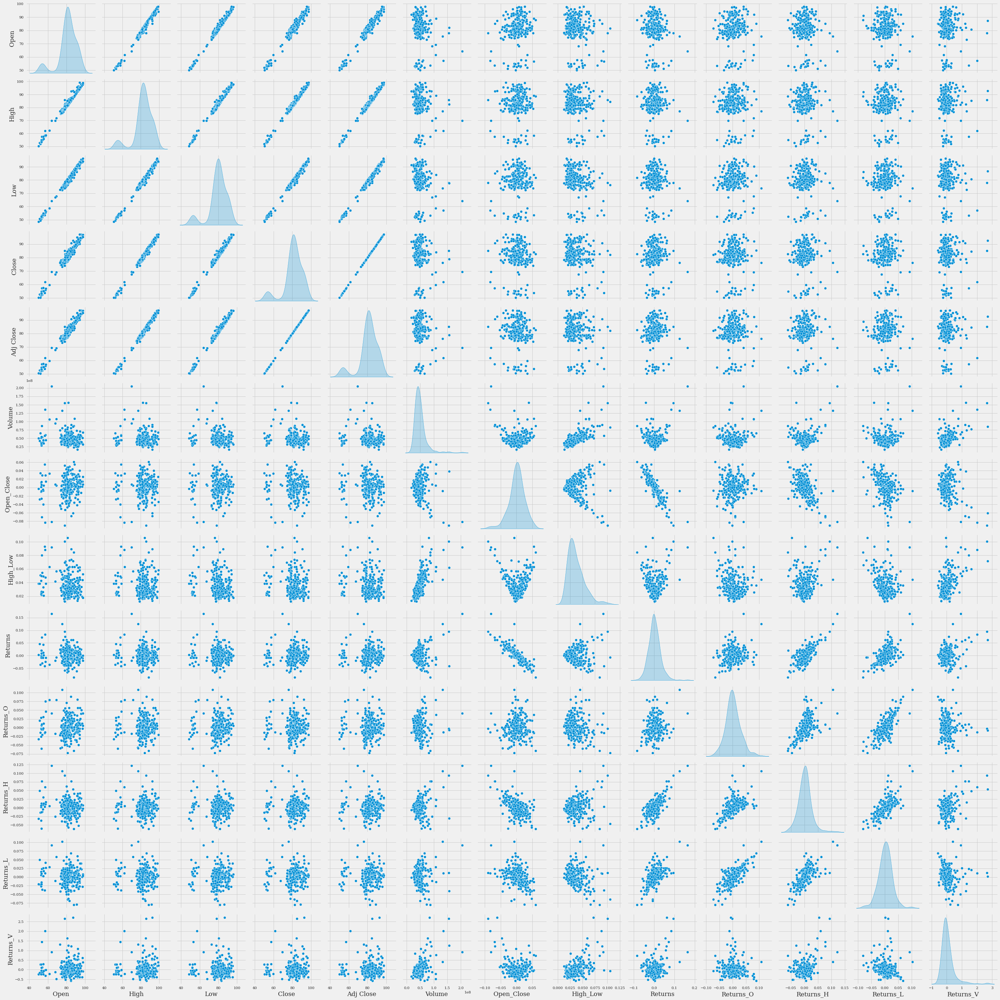

In [961]:
sns.pairplot(dataset.drop(["Increase_Decrease", "Buy_Sell_on_Open", "Buy_Sell"], axis=1), size=3, diag_kind="kde")

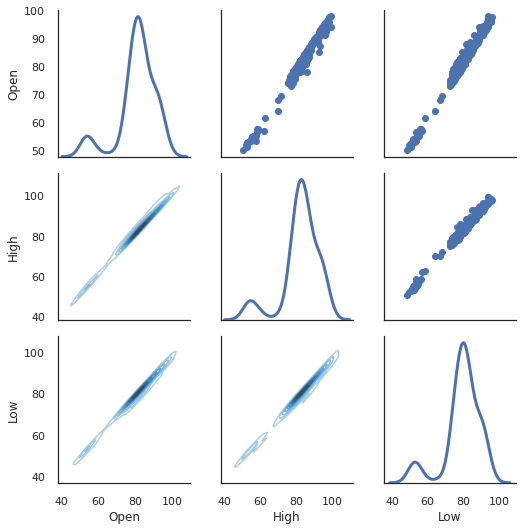

In [962]:
sns.set(style="white")
df = dataset.loc[:,['Open','High','Low']]
g = sns.PairGrid(df, diag_sharey=False)
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_upper(plt.scatter)
g.map_diag(sns.kdeplot, lw=3)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb24a17c1d0>,
      dtype=object)

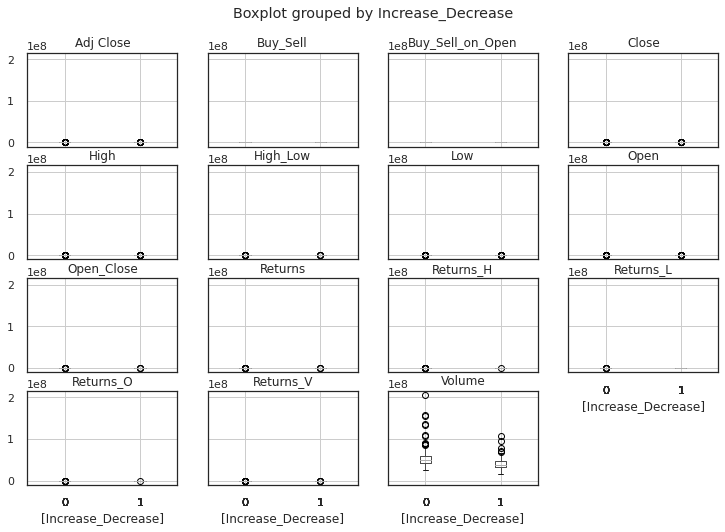

In [964]:
dataset.boxplot(by="Increase_Decrease", figsize=(12, 8))

In [ ]:
pip install wheel

In [ ]:
pip install pandas

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb2496031d0>,
      dtype=object)

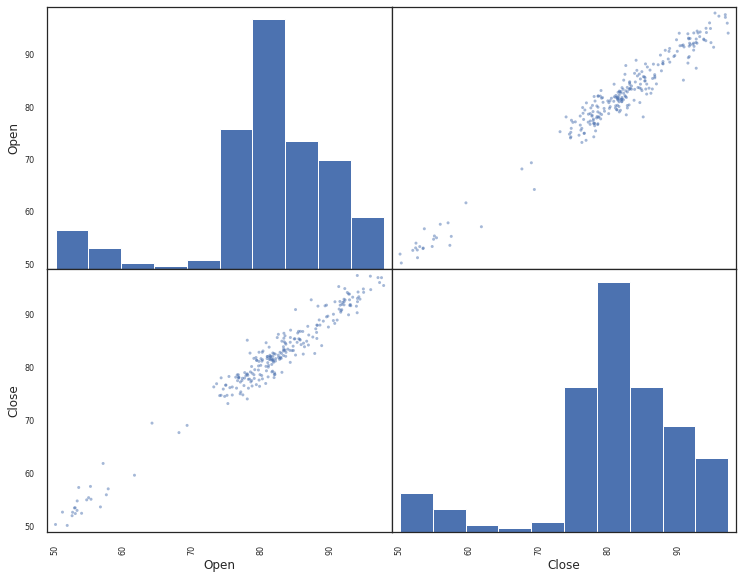

In [965]:
from pandas.plotting import scatter_matrix
#from pandas.tools.plotting import scatter_matrix
#from pandas.tools.plotting import andrews_curves

scatter_matrix(dataset[['Open', 'Close']])

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


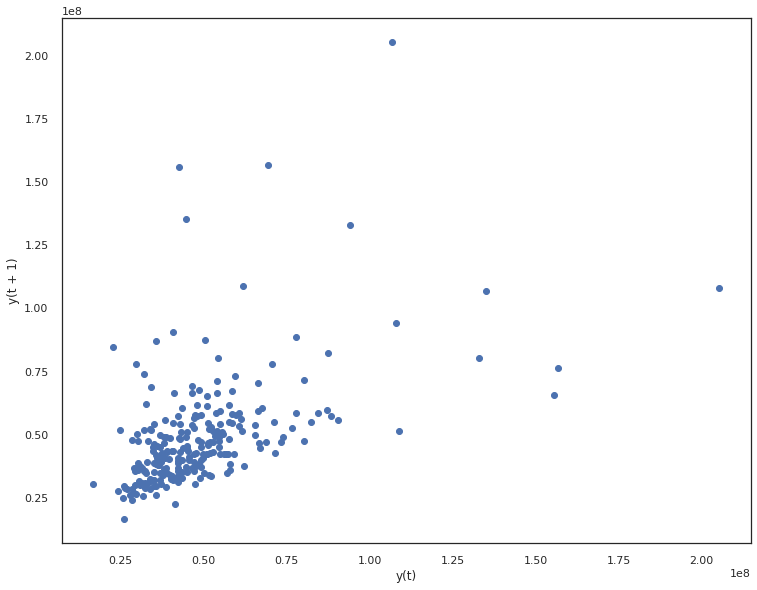

In [966]:
from pandas.plotting import lag_plot

lag_plot(dataset['Volume'].tail(250))

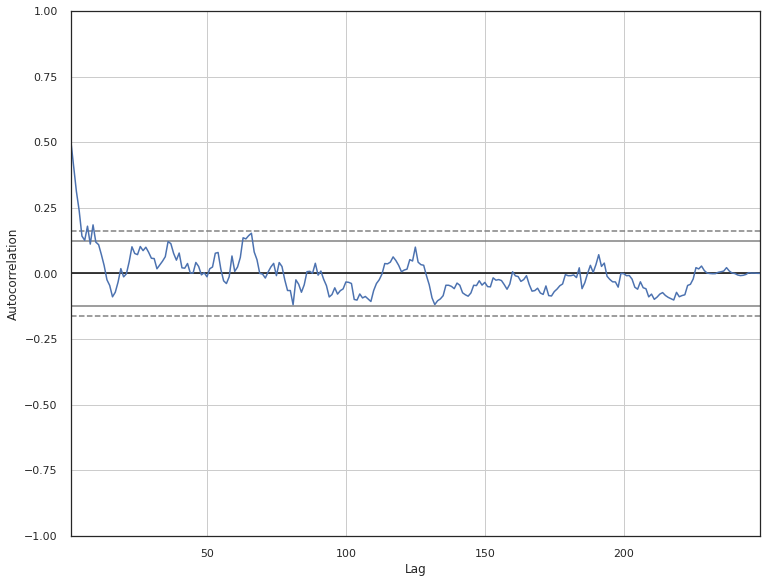

In [967]:
from pandas.plotting import autocorrelation_plot

autocorrelation_plot(dataset['Volume'])

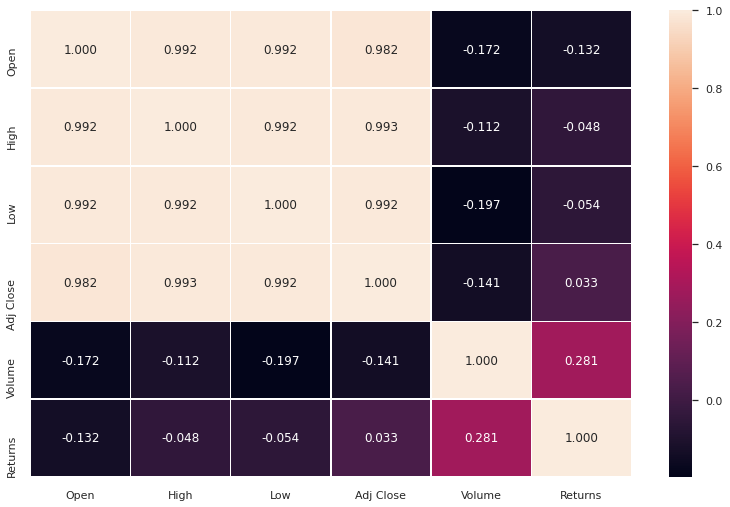

In [968]:
f,ax = plt.subplots(figsize=(12, 8))
sns.heatmap(dataset[['Open', 'High', 'Low', 'Adj Close', 'Volume', 'Returns']].corr(), annot=True, linewidths=.5, fmt= '.3f',ax=ax)

In [ ]:
pip install chart-studio

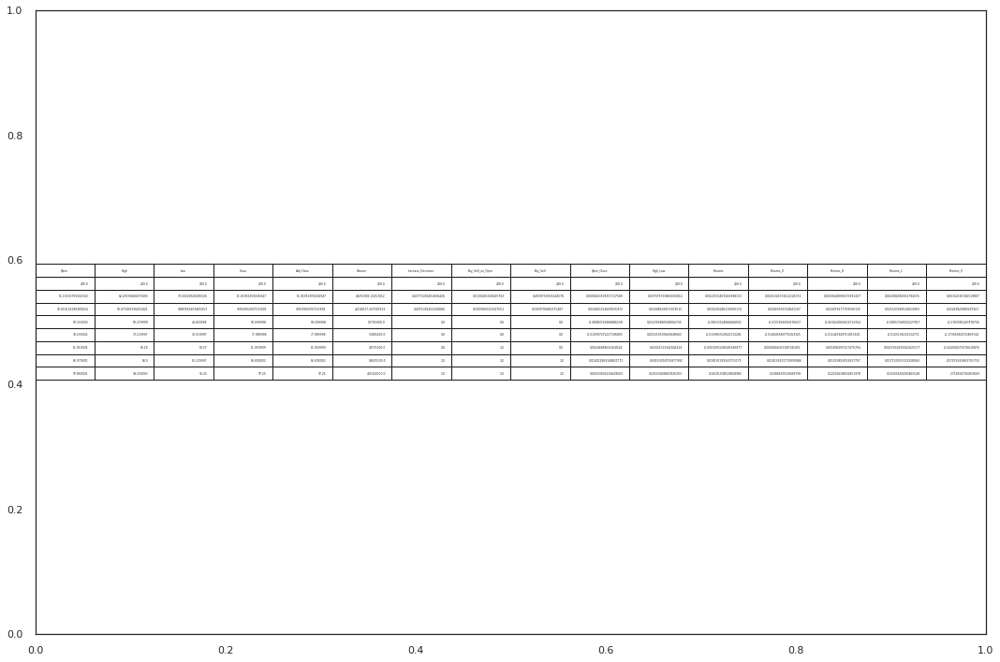

In [969]:
fig, ax = plt.subplots(figsize=(15,10))

ax.axis('on')
ax.table(cellText=dataset.describe().values, colLabels=dataset.describe().columns, loc='center')
fig.tight_layout()
plt.show()

#Case Studies

**Case Study 1: 30 Day Bollinger Band for Facebook**

In [601]:
# import needed libraries
import pandas as pd
import matplotlib.pyplot as plt
from pandas_datareader import data as web

In [602]:
# Make function for calls to Yahoo Finance
def get_adj_close(ticker, start, end):
    '''
    A function that takes ticker symbols, starting period, ending period
    as arguments and returns with a Pandas DataFrame of the Adjusted Close Prices
    for the tickers from Yahoo Finance
    '''
    start = start
    end = end
    info = web.DataReader(ticker, data_source='yahoo', start=start, end=end)['Adj Close']
    return pd.DataFrame(info)

In [603]:
# Get Adjusted Closing Prices for Facebook, Tesla and Amazon between 2016-2017
fb = get_adj_close('fb', '1/2/2016', '31/12/2020')
tesla = get_adj_close('tsla', '1/2/2016', '31/12/2020')
amazon = get_adj_close('amzn', '1/2/2016', '31/12/2020')

In [604]:
# Calculate 30 Day Moving Average, Std Deviation, Upper Band and Lower Band
for item in (fb, tesla, amazon):
    item['30 Day MA'] = item['Adj Close'].rolling(window=20).mean()
    
    # set .std(ddof=0) for population std instead of sample
    item['30 Day STD'] = item['Adj Close'].rolling(window=20).std() 
    
    item['Upper Band'] = item['30 Day MA'] + (item['30 Day STD'] * 2)
    item['Lower Band'] = item['30 Day MA'] - (item['30 Day STD'] * 2)

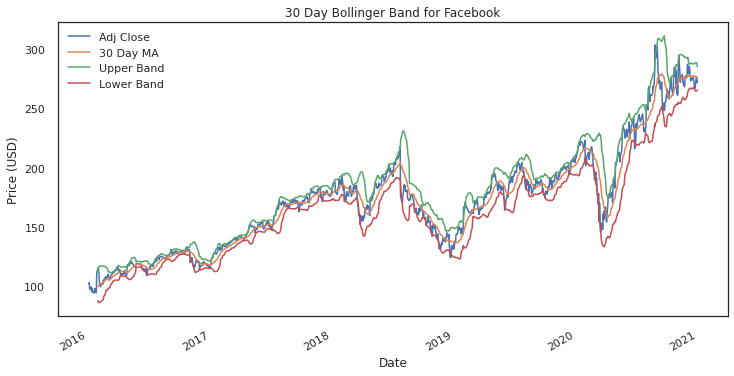

In [605]:
# Simple 30 Day Bollinger Band for Facebook (2016-2020)
fb[['Adj Close', '30 Day MA', 'Upper Band', 'Lower Band']].plot(figsize=(12,6))
plt.title('30 Day Bollinger Band for Facebook')
plt.ylabel('Price (USD)')
plt.show();

No handles with labels found to put in legend.


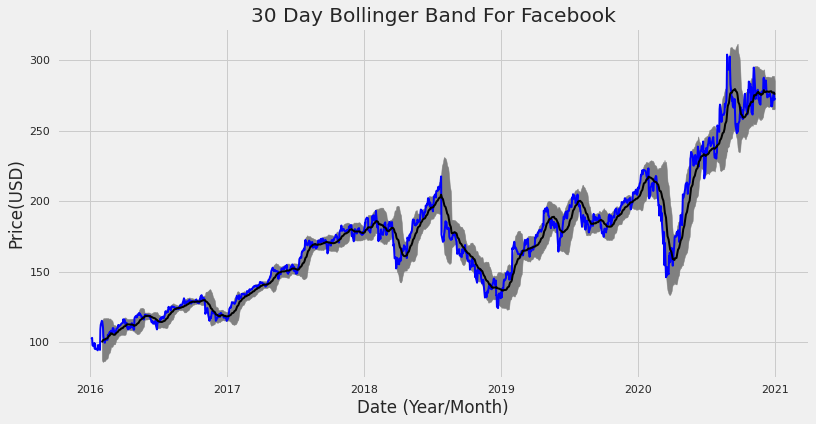

In [606]:
# set style, empty figure and axes
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
# Get index values for the X axis for facebook DataFrame
x_axis = fb.index.get_level_values(0)
# Plot shaded 21 Day Bollinger Band for Facebook
ax.fill_between(x_axis, fb['Upper Band'], fb['Lower Band'], color='grey')
# Plot Adjust Closing Price and Moving Averages
ax.plot(x_axis, fb['Adj Close'], color='blue', lw=2)
ax.plot(x_axis, fb['30 Day MA'], color='black', lw=2)
# Set Title & Show the Image
ax.set_title('30 Day Bollinger Band For Facebook')
ax.set_xlabel('Date (Year/Month)')
ax.set_ylabel('Price(USD)')
ax.legend()
plt.show();


**Exponention moving average (EMA) for Microsoft index (MSFT.O)**

In [607]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline
import seaborn as sns
sns.set(style='darkgrid', context='talk', palette='Dark2')


In [608]:
my_year_month_fmt = mdates.DateFormatter('%m/%y')
data= pd.read_csv('http://hilpisch.com/pyalgo_eikon_eod_data.csv',
                 index_col=0, parse_dates=True).dropna()
data.head()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2010-01-04,30.572827,30.950,20.88,133.90,173.08,113.33,1132.99,20.04,1.4411,1120.00,47.71,109.80
2010-01-05,30.625684,30.960,20.87,134.69,176.14,113.63,1136.52,19.35,1.4368,1118.65,48.17,109.70
2010-01-06,30.138541,30.770,20.80,132.25,174.26,113.71,1137.14,19.16,1.4412,1138.50,49.34,111.51
2010-01-07,30.082827,30.452,20.60,130.00,177.67,114.19,1141.69,19.06,1.4318,1131.90,49.10,110.82
2010-01-08,30.282827,30.660,20.83,133.52,174.31,114.57,1144.98,18.13,1.4412,1136.10,49.84,111.37


In [609]:
# Calculating the short-window simple moving average
short_rolling = data.rolling(window=20).mean()
short_rolling.head(5)
#https://www.learndatasci.com/tutorials/python-finance-part-3-moving-average-trading-strategy/

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2010-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [610]:
# Calculating the long-window simple moving average
long_rolling = data.rolling(window=100).mean()
long_rolling.tail()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2019-12-24,237.60675,142.56665,52.9243,1776.2150,212.3046,301.6382,3018.6683,15.3365,1.106562,1491.702987,27.8021,140.6211
2019-12-26,238.57245,142.83125,53.0528,1777.2514,212.5999,302.0294,3022.6200,15.2171,1.106456,1492.179966,27.8069,140.6670
2019-12-27,239.50045,143.07395,53.1840,1778.0711,212.8464,302.3800,3026.2025,15.1497,1.106433,1492.545433,27.8089,140.7012
2019-12-30,240.42525,143.29705,53.3129,1778.6060,213.0870,302.7111,3029.5756,15.1030,1.106433,1492.688663,27.8112,140.7173
2019-12-31,241.32745,143.48515,53.4397,1778.7555,213.3163,302.9935,3032.5025,15.0717,1.106465,1492.858763,27.8063,140.7290


**Simple moving average (SMA)**

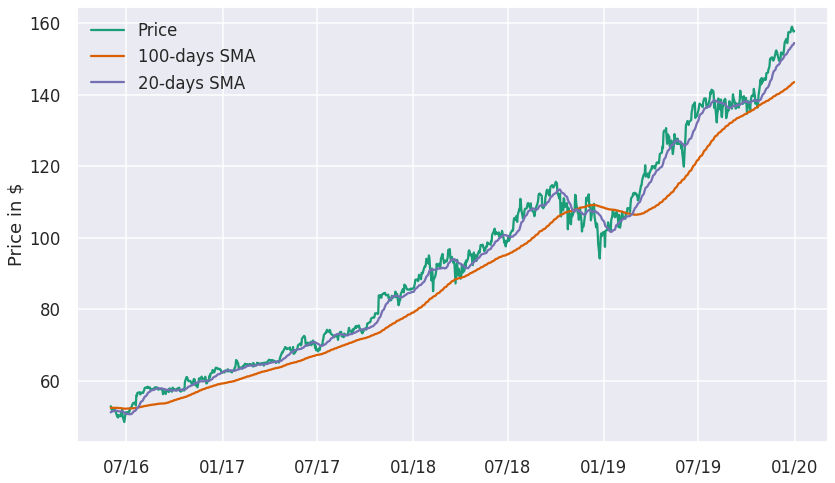

In [611]:
start_date = '2016-06-01'
end_date = '2021-06-30'

fig, ax = plt.subplots(figsize=(12,8))

ax.plot(data.loc[start_date:end_date, :].index, data.loc[start_date:end_date, 'MSFT.O'], label='Price')
ax.plot(long_rolling.loc[start_date:end_date, :].index, long_rolling.loc[start_date:end_date, 'MSFT.O'], label = '100-days SMA')
ax.plot(short_rolling.loc[start_date:end_date, :].index, short_rolling.loc[start_date:end_date, 'MSFT.O'], label = '20-days SMA')

ax.legend(loc='best')
ax.set_ylabel('Price in $')
ax.xaxis.set_major_formatter(my_year_month_fmt)

**20-days span EMA/SMA**

In [612]:
# Using Pandas to calculate a 20-days span EMA. adjust=False specifies that we are interested in the recursive calculation mode.
ema_short = data.ewm(span=20, adjust=False).mean()

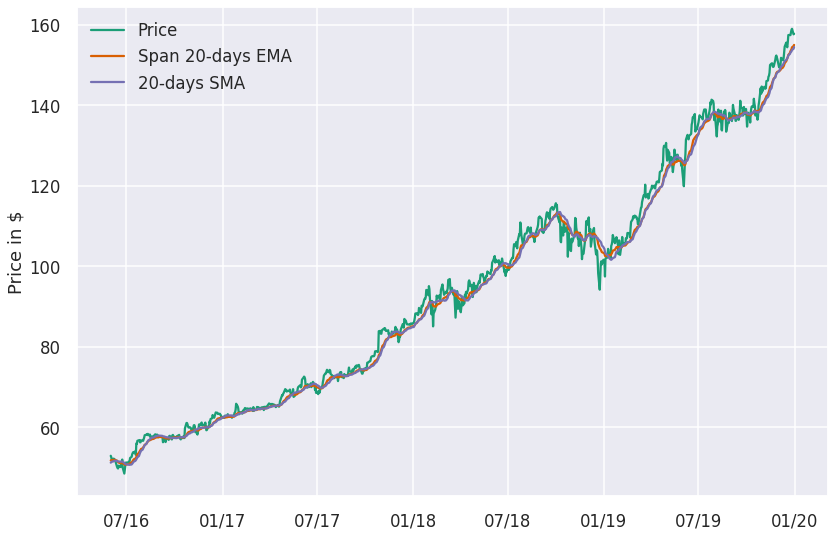

In [613]:
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(data.loc[start_date:end_date, :].index, data.loc[start_date:end_date, 'MSFT.O'], label='Price')
ax.plot(ema_short.loc[start_date:end_date, :].index, ema_short.loc[start_date:end_date, 'MSFT.O'], label = 'Span 20-days EMA')
ax.plot(short_rolling.loc[start_date:end_date, :].index, short_rolling.loc[start_date:end_date, 'MSFT.O'], label = '20-days SMA')

ax.legend(loc='best')
ax.set_ylabel('Price in $')
ax.xaxis.set_major_formatter(my_year_month_fmt)


In [614]:
# Taking the difference between the prices and the EMA timeseries
trading_positions_raw = data - ema_short
trading_positions_raw.tail()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2019-12-24,10.690016,4.010444,1.630512,14.597701,4.773411,4.610318,55.571302,-0.502375,-0.000456,22.644900,1.210366,2.161661
2019-12-26,14.774776,4.795640,1.846177,85.190301,5.494991,5.718383,65.234512,-0.472625,0.000402,31.786819,1.475093,2.960075
2019-12-27,13.268131,4.601293,1.905589,78.008844,4.474040,5.101394,59.121225,0.278101,0.007511,27.962227,1.144608,2.632925
2019-12-30,13.560690,2.923551,1.307914,49.851335,3.269845,3.005071,36.544441,1.509235,0.008786,29.557239,1.596550,2.653598
2019-12-31,14.196338,2.744641,1.391446,45.963113,3.076051,3.424588,41.650209,0.424546,0.009126,28.449549,1.254497,2.645161


In [615]:
# Taking the sign of the difference to determine whether the price or the EMA is greater and then multiplying by 1/3
trading_positions = trading_positions_raw.apply(np.sign) * 1/3
trading_positions.tail()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2019-12-24,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,-0.333333,-0.333333,0.333333,0.333333,0.333333
2019-12-26,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,-0.333333,0.333333,0.333333,0.333333,0.333333
2019-12-27,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333
2019-12-30,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333
2019-12-31,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333,0.333333


In [616]:
# Lagging our trading signals by one day.
trading_positions_final = trading_positions.shift(1)

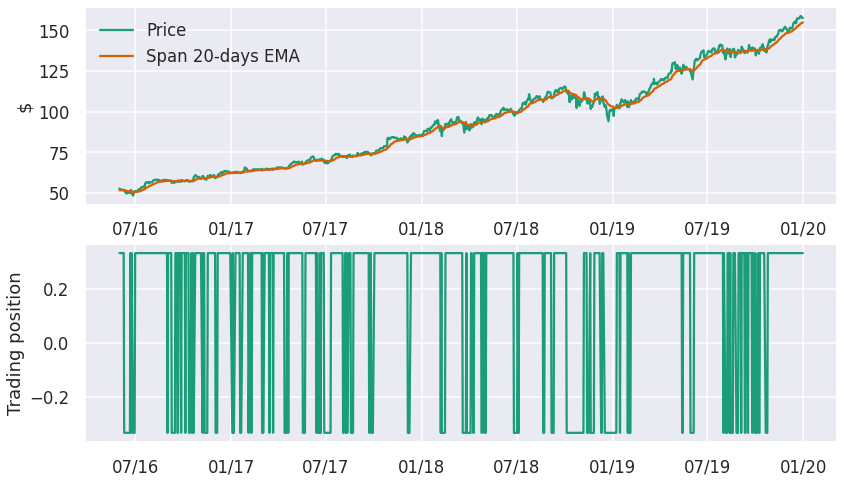

In [617]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,8))

ax1.plot(data.loc[start_date:end_date, :].index, data.loc[start_date:end_date, 'MSFT.O'], label='Price')
ax1.plot(ema_short.loc[start_date:end_date, :].index, ema_short.loc[start_date:end_date, 'MSFT.O'], label = 'Span 20-days EMA')

ax1.set_ylabel('$')
ax1.legend(loc='best')
ax1.xaxis.set_major_formatter(my_year_month_fmt)

ax2.plot(trading_positions_final.loc[start_date:end_date, :].index, trading_positions_final.loc[start_date:end_date, 'MSFT.O'], 
        label='Trading position')

ax2.set_ylabel('Trading position')
ax2.xaxis.set_major_formatter(my_year_month_fmt)

In [618]:
# Log returns - First the logarithm of the prices is 
# taken and the the difference of consecutive (log) observations
asset_log_returns = np.log(data).diff()
asset_log_returns.head()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2010-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-05,0.001727,0.000323,-0.000479,0.005883,0.017525,0.002644,0.003111,-0.035038,-0.002988,-0.001206,0.009595,-0.000911
2010-01-06,-0.016034,-0.006156,-0.003360,-0.018282,-0.010731,0.000704,0.000545,-0.009868,0.003058,0.017589,0.023999,0.016365
2010-01-07,-0.001850,-0.010389,-0.009662,-0.017160,0.019379,0.004212,0.003993,-0.005233,-0.006544,-0.005814,-0.004876,-0.006207
2010-01-08,0.006626,0.006807,0.011103,0.026717,-0.019093,0.003322,0.002878,-0.050024,0.006544,0.003704,0.014959,0.004951


In [619]:
strategy_asset_log_returns = trading_positions_final * asset_log_returns
strategy_asset_log_returns.tail()

,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
Date,,,,,,,,,,,,
2019-12-24,0.000317,-0.000064,0.001011,-0.000705,0.001191,0.000010,-0.000065,-0.001582,-0.000030,0.003025,0.010515,0.003129
2019-12-26,0.006549,0.002721,0.002292,0.014502,0.001879,0.001770,0.001705,0.000527,-0.000270,0.002766,0.004849,0.002609
2019-12-27,-0.000127,0.000609,0.001446,0.000184,-0.000794,-0.000083,0.000011,-0.019945,0.002365,-0.000194,-0.002416,-0.000117
2019-12-30,0.001973,-0.002885,-0.002562,-0.004109,-0.001245,-0.001843,-0.001933,0.032829,0.000656,0.001037,0.007083,0.000702
2019-12-31,0.002427,0.000233,0.001283,0.000171,0.000189,0.000809,0.000981,-0.024253,0.000387,0.000415,-0.002382,0.000630


In [620]:
# Get the cumulative log-returns per asset
cum_strategy_asset_log_returns = strategy_asset_log_returns.cumsum()

In [621]:
# Transform the cumulative log returns to relative returns
cum_strategy_asset_relative_returns = np.exp(cum_strategy_asset_log_returns) - 1

**Cumulative log-returns**

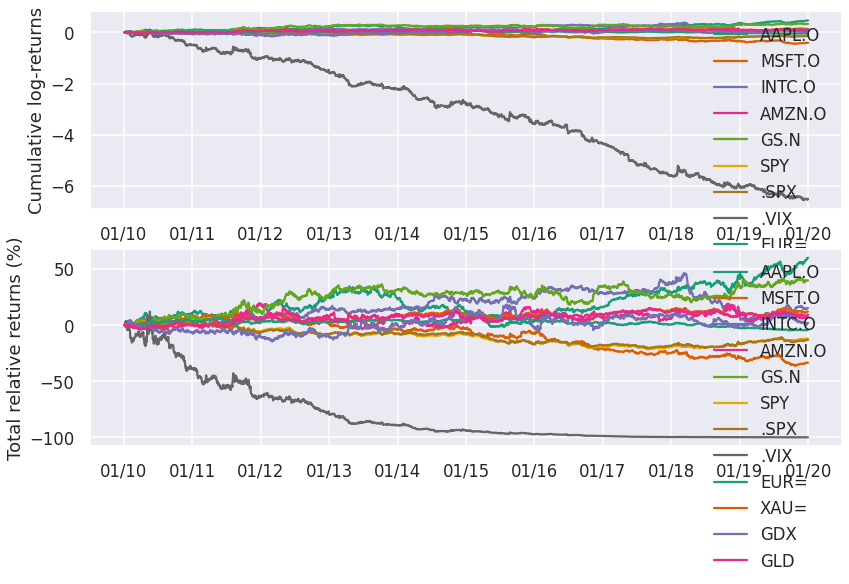

In [622]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,8))

for c in asset_log_returns:
    ax1.plot(cum_strategy_asset_log_returns.index, cum_strategy_asset_log_returns[c], label=str(c))

ax1.set_ylabel('Cumulative log-returns')
ax1.legend(loc='best')
ax1.xaxis.set_major_formatter(my_year_month_fmt)

for c in asset_log_returns:
    ax2.plot(cum_strategy_asset_relative_returns.index, 100*cum_strategy_asset_relative_returns[c], label=str(c))

ax2.set_ylabel('Total relative returns (%)')
ax2.legend(loc='best')
ax2.xaxis.set_major_formatter(my_year_month_fmt)

**Total strategy relative returns**

In [623]:
# Total strategy relative returns. This is the exact calculation.
cum_relative_return_exact = cum_strategy_asset_relative_returns.sum(axis=1)

In [624]:
# Get the cumulative log-returns per asset
cum_strategy_log_return = cum_strategy_asset_log_returns.sum(axis=1)

In [625]:
# Transform the cumulative log returns to relative returns. This is the approximation
cum_relative_return_approx = np.exp(cum_strategy_log_return) - 1

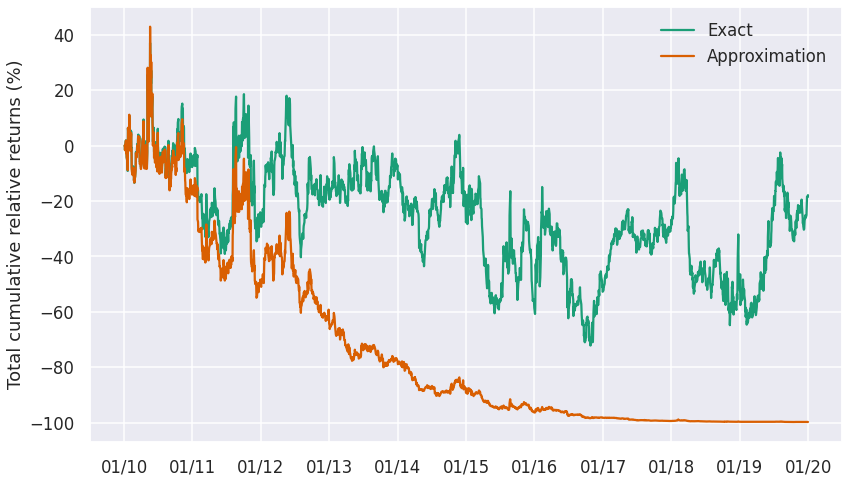

In [626]:
fig, ax = plt.subplots(figsize=(12,8))

ax.plot(cum_relative_return_exact.index, 100*cum_relative_return_exact, label='Exact')
ax.plot(cum_relative_return_approx.index, 100*cum_relative_return_approx, label='Approximation')

ax.set_ylabel('Total cumulative relative returns (%)')
ax.legend(loc='best')
ax.xaxis.set_major_formatter(my_year_month_fmt)

**Portfolio yearly statistics**

In [627]:
def print_portfolio_yearly_statistics(portfolio_cumulative_relative_returns, days_per_year = 52 * 5):

    total_days_in_simulation = portfolio_cumulative_relative_returns.shape[0]
    number_of_years = total_days_in_simulation / days_per_year

    # The last data point will give us the total portfolio return
    total_portfolio_return = portfolio_cumulative_relative_returns[-1]
    # Average portfolio return assuming compunding of returns
    average_yearly_return = (1 + total_portfolio_return)**(1/number_of_years) - 1

    print('Total portfolio return is: ' + '{:5.2f}'.format(100*total_portfolio_return) + '%')
    print('Average yearly return is: ' + '{:5.2f}'.format(100*average_yearly_return) + '%')

In [628]:
print_portfolio_yearly_statistics(cum_relative_return_exact)

Total portfolio return is: -17.89%
Average yearly return is: -2.02%


In [629]:
# Define the weights matrix for the simple buy-and-hold strategy
simple_weights_matrix = pd.DataFrame(1/3, index = data.index, columns=data.columns)

In [630]:
# Get the buy-and-hold strategy log returns per asset
simple_strategy_asset_log_returns = simple_weights_matrix * asset_log_returns

In [631]:
# Get the cumulative log-returns per asset
simple_cum_strategy_asset_log_returns = simple_strategy_asset_log_returns.cumsum()

In [632]:
# Transform the cumulative log returns to relative returns
simple_cum_strategy_asset_relative_returns = np.exp(simple_cum_strategy_asset_log_returns) - 1

In [633]:
# Total strategy relative returns. This is the exact calculation.
simple_cum_relative_return_exact = simple_cum_strategy_asset_relative_returns.sum(axis=1)

Total portfolio return is: 444.94%
Average yearly return is: 19.15%


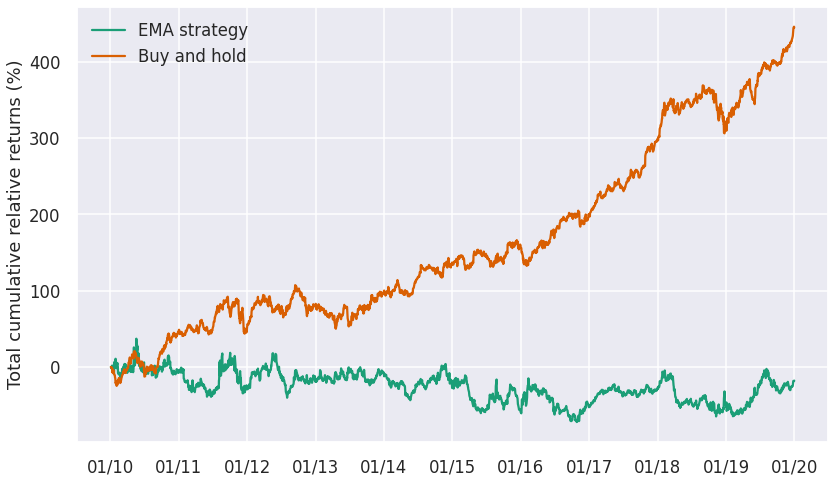

In [634]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(cum_relative_return_exact.index, 100*cum_relative_return_exact, label='EMA strategy')
ax.plot(simple_cum_relative_return_exact.index, 100*simple_cum_relative_return_exact, label='Buy and hold')
ax.set_ylabel('Total cumulative relative returns (%)')
ax.legend(loc='best')
ax.xaxis.set_major_formatter(my_year_month_fmt)

print_portfolio_yearly_statistics(simple_cum_relative_return_exact)

**Cass Study 2**

In [635]:
raw = pd.read_csv('http://hilpisch.com/pyalgo_eikon_eod_data.csv',
                 index_col=0, parse_dates=True).dropna()

In [636]:
spx = pd.DataFrame(raw['.SPX'])

In [637]:
spx.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2010-01-04 to 2019-12-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   .SPX    2516 non-null   float64
dtypes: float64(1)
memory usage: 39.3 KB


In [638]:
vix = pd.DataFrame(raw['.VIX'])

In [639]:
vix.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2010-01-04 to 2019-12-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   .VIX    2516 non-null   float64
dtypes: float64(1)
memory usage: 39.3 KB


In [640]:
spxvix = pd.DataFrame(spx).join(vix)

In [641]:
spxvix.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2010-01-04 to 2019-12-31
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   .SPX    2516 non-null   float64
 1   .VIX    2516 non-null   float64
dtypes: float64(2)
memory usage: 139.0 KB


In [642]:

spxvix = pd.merge(spx, vix,
                  left_index=True,  # merge on left index
                  right_index=True,  # merge on right index
                 )

In [643]:
spxvix.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2010-01-04 to 2019-12-31
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   .SPX    2516 non-null   float64
 1   .VIX    2516 non-null   float64
dtypes: float64(2)
memory usage: 139.0 KB


In [644]:
spxvix = pd.DataFrame({'SPX': spx['.SPX'],
                       'VIX': vix['.VIX']},
                       index=spx.index)

In [645]:
spxvix.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2010-01-04 to 2019-12-31
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SPX     2516 non-null   float64
 1   VIX     2516 non-null   float64
dtypes: float64(2)
memory usage: 139.0 KB


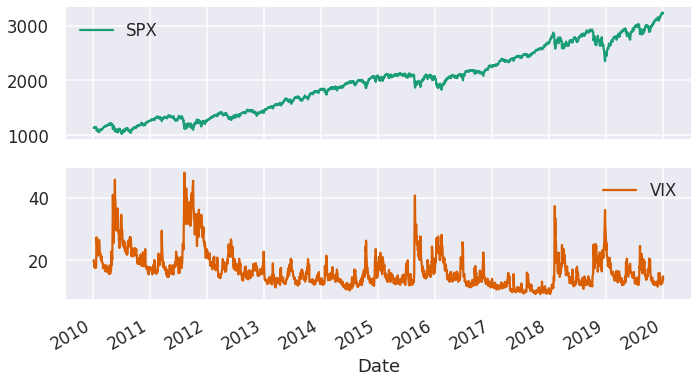

In [646]:
spxvix.plot(figsize=(10, 6), subplots=True);
# plt.savefig('../../images/chA/example_01.png');

**Running maximum**

In [647]:
rets = np.log(spxvix / spxvix.shift(1))

In [648]:
rets = rets.dropna()

In [649]:
rets.head()

,SPX,VIX
Date,,
2010-01-05,0.003111,-0.035038
2010-01-06,0.000545,-0.009868
2010-01-07,0.003993,-0.005233
2010-01-08,0.002878,-0.050024
2010-01-11,0.001745,-0.032514


In [650]:

rg = np.polyfit(rets['SPX'], rets['VIX'], 1)

In [651]:
ret = rets.mean() * 252

In [652]:
ret

SPX    0.104995
VIX   -0.037526
dtype: float64

In [653]:
vol = rets.std() * math.sqrt(252)

In [654]:
vol

SPX    0.147902
VIX    1.229086
dtype: float64

In [655]:
(ret - 0.01) / vol

SPX    0.642279
VIX   -0.038667
dtype: float64

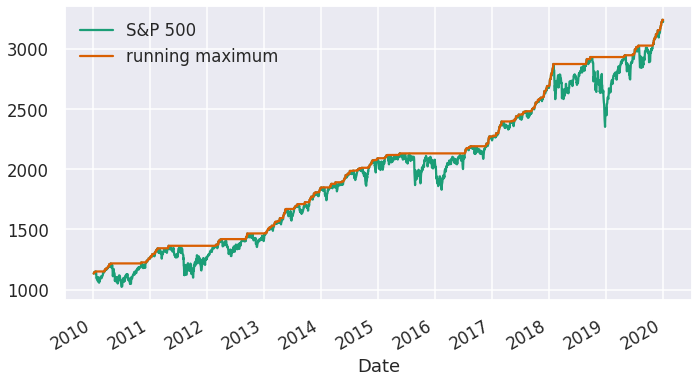

In [656]:
plt.figure(figsize=(10, 6))
spxvix['SPX'].plot(label='S&P 500')
spxvix['SPX'].cummax().plot(label='running maximum')
plt.legend(loc=0);
# plt.savefig('../../images/chA/example_03.png');

In [657]:
adrawdown = spxvix['SPX'].cummax() - spxvix['SPX']

In [658]:
adrawdown.max()

579.6500000000001

In [659]:
rdrawdown = ((spxvix['SPX'].cummax() - spxvix['SPX']) /
              spxvix['SPX'].cummax())

In [660]:
rdrawdown.max()

0.1977821376780688

In [661]:
temp = adrawdown[adrawdown == 0]

In [662]:
periods_spx = (temp.index[1:].to_pydatetime() -
               temp.index[:-1].to_pydatetime())

In [663]:
periods_spx[50:60]

array([datetime.timedelta(days=67), datetime.timedelta(days=1),
       datetime.timedelta(days=1), datetime.timedelta(days=1),
       datetime.timedelta(days=301), datetime.timedelta(days=3),
       datetime.timedelta(days=1), datetime.timedelta(days=2),
       datetime.timedelta(days=12), datetime.timedelta(days=2)],
      dtype=object)

In [664]:
max(periods_spx)

datetime.timedelta(days=417)

**Introduction to Linear Regression**

In [665]:
import os
import random
import numpy as np
from pylab import mpl, plt
plt.style.use('seaborn')
mpl.rcParams['savefig.dpi'] = 300
mpl.rcParams['font.family'] = 'serif'
os.environ['PYTHONHASHSEED'] = '0'

In [666]:
#Generates an evenly spaced grid of floats for the x values between 0 and 10
x = np.linspace(0, 10) 

In [667]:
#Fixes the seed values for all relevant random number generators
def set_seeds(seed=100):
 random.seed(seed)
 np.random.seed(seed)
 set_seeds() 

In [668]:
#Generates the randomized data for the y values.
y = x + np.random.standard_normal(len(x))

In [669]:
#OLS regression of degree 1 (that is, linear regression) is conducted.
reg = np.polyfit(x, y, deg=1) 

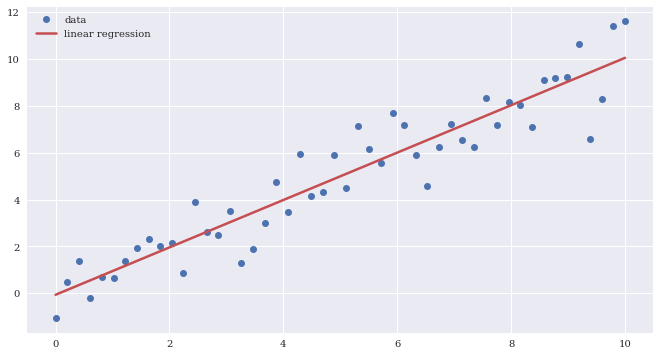

In [670]:
plt.figure(figsize=(10, 6)) # Creates a new figure object
plt.plot(x, y, 'bo', label='data') # Plots the original data set as dots.
plt.plot(x, np.polyval(reg, x), 'r', lw=2.5,
label='linear regression') # Plots the regression line.
plt.legend(loc=0); # Creates the legend.

Figure 1. Linear regression illustrated based on randomized data

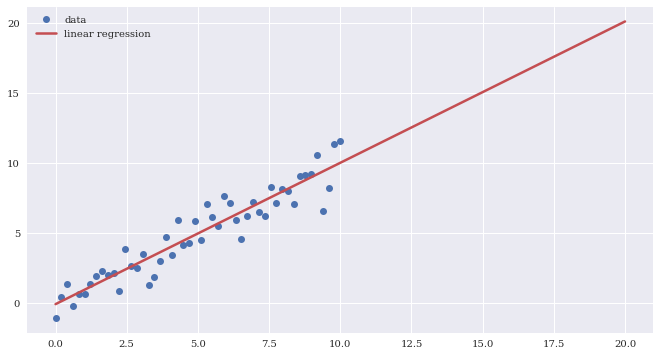

In [671]:
#The interval for the dependent variable x is x ֎ 0, 10 . Enlarging the interval to, say,
#x ֎ 0, 20 allows one to “predict” values for the dependent variable y beyond the
#domain of the original data set by an extrapolation given the optimal regression parameters.
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'bo', label='data')
xn = np.linspace(0, 20)
plt.plot(xn, np.polyval(reg, xn), 'r', lw=2.5,
 label='linear regression')
plt.legend(loc=0);

Figure 2. Prediction (extrapolation) based on linear regression

**Introduction to basic prediction concepts**

In [672]:
#The next example casts this idea again into a rather simple context. The data the
#example uses are the numbers from 0 to 11
x = np.arange(12)
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [673]:
#Defines the number of lags.
lags =3

In [674]:
#Instantiates an ndarray object with the appropriate dimensions
m = np.zeros((lags + 1, len(x) - lags))

In [675]:
m[lags] = x[lags:] #Defines the target values (dependent variable).
for i in range(lags): #Iterates over the numbers from 0 to lags - 1
  m[i] = x[i:i - lags]  #Defines the basis vectors (independent variables)

In [676]:
#Shows the transpose of the ndarray object m
m.T 

array([[        0.00,         1.00,         2.00,         3.00],
       [        1.00,         2.00,         3.00,         4.00],
       [        2.00,         3.00,         4.00,         5.00],
       [        3.00,         4.00,         5.00,         6.00],
       [        4.00,         5.00,         6.00,         7.00],
       [        5.00,         6.00,         7.00,         8.00],
       [        6.00,         7.00,         8.00,         9.00],
       [        7.00,         8.00,         9.00,        10.00],
       [        8.00,         9.00,        10.00,        11.00]])

In [677]:
import pandas as pd
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import numpy as np
import math
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.tsa.stattools as ts
from statsmodels.tsa.arima_model import ARIMA

In [678]:
# Fetches stock market data 
import fix_yahoo_finance as yf
yf.pdr_override()

symbol = 'AMD'# 1: Input the stock symbol   
start = '2020-04-27'# 2: Input the stock starting date 
end = '2021-04-27'# 3. Input the stock ending date  

# Read data 
variables = yf.download(symbol,start,end)

[*********************100%***********************]  1 of 1 downloaded


In [679]:
Close =variables ["Close"]
Close

Date
2020-04-27    56.490002
2020-04-28    55.509998
2020-04-29    53.660000
2020-04-30    52.389999
2020-05-01    49.880001
                ...    
2021-04-20    79.269997
2021-04-21    81.610001
2021-04-22    79.059998
2021-04-23    82.760002
2021-04-26    85.410004
Name: Close, Length: 252, dtype: float64

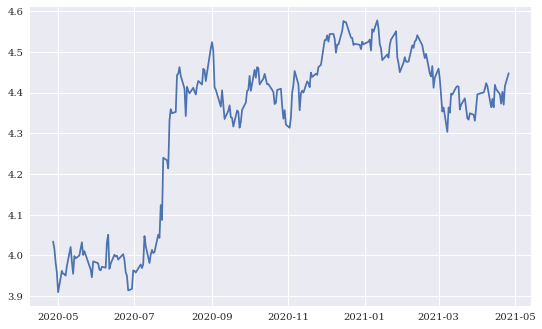

In [680]:
lnClose=np.log(Close)
lnClose
plt.plot(lnClose)
plt.show()

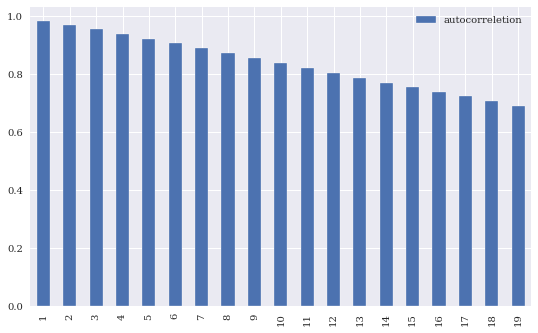

In [682]:
acf_1 =  acf(lnClose)[1:20]
test_df = pd.DataFrame([acf_1]).T
test_df.columns = ['autocorreletion']
test_df.index += 1
test_df.plot(kind='bar')
plt.show()

<function matplotlib.pyplot.show>

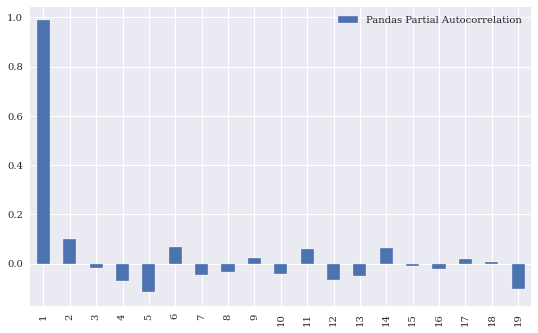

In [683]:
pacf_1 = pacf(lnClose)[1:20]
test_df = pd.DataFrame([pacf_1]).T
test_df.columns = ['Pandas Partial Autocorrelation']
test_df.index += 1
test_df.plot(kind='bar')
plt.show

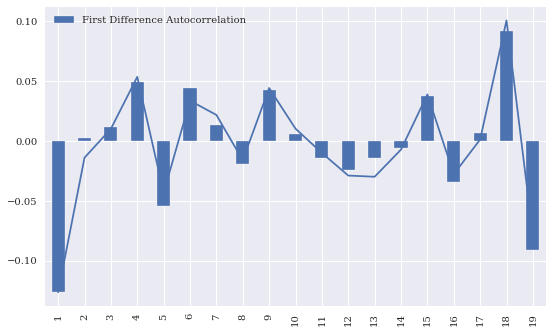

In [685]:
#we can confirmation as it can show in follwing plot that our data follows an AR(1) 
#stationary process (one with a constant mean, variance, and autocorrelation), 
#and we see that the price plot now shows a stationary process:

lnClose_diff=lnClose-lnClose.shift()
diff=lnClose_diff.dropna()
acf_1_diff =  acf(diff)[1:20]
test_df = pd.DataFrame([acf_1_diff]).T
test_df.columns = ['First Difference Autocorrelation']
test_df.index += 1
test_df.plot(kind='bar')
pacf_1_diff =  pacf(diff)[1:20]
plt.plot(pacf_1_diff)
plt.show()